In [192]:
# התקנת החבילה bottleneck
#pip install --upgrade bottleneck

import pandas as pd
import numpy as np

# נתיב לקובץ ה-CSV
csv_file_path = r"C:\Users\noaga\OneDrive - Payoneer\Desktop\ML Project\players_stats_by_season_full_details.csv"

# קריאת קובץ ה-CSV
NBA = pd.read_csv(csv_file_path)


# המרת ערכי אינסוף ל-NaN כדי להימנע מהאזהרה
NBA.replace([float('inf'), float('-inf')], pd.NA, inplace=True)


# הצגת השורות הראשונות של הדאטה פריים
print(NBA.head())
import os
print(os.getcwd())

  League    Season         Stage            Player      Team  GP    MIN   FGM  \
0   NBA   1999 - 2000  Regular_Season  Shaquille O'Neal  LAL  79  3163.0  956   
1   NBA   1999 - 2000  Regular_Season      Vince Carter  TOR  82  3126.0  788   
2   NBA   1999 - 2000  Regular_Season       Karl Malone  UTA  82  2947.0  752   
3   NBA   1999 - 2000  Regular_Season     Allen Iverson  PHI  70  2853.0  729   
4   NBA   1999 - 2000  Regular_Season       Gary Payton  SEA  82  3425.0  747   

    FGA  3PM  3PA  FTM  FTA  TOV  PF   ORB  DRB   REB  AST  STL  BLK   PTS  \
0  1665    0    1  432  824  223  255  336  742  1078  299   36  239  2344   
1  1696   95  236  436  551  178  263  150  326   476  322  110   92  2107   
2  1476    2    8  589  739  231  229  169  610   779  304   79   71  2095   
3  1733   89  261  442  620  230  162   71  196   267  328  144    5  1989   
4  1666  177  520  311  423  224  178  100  429   529  732  153   18  1982   

   birth_year birth_month   birth_date  heig

In [194]:
# יוצרים מילון לאחסון התוצאות
results = {}

# עוברים על כל עמודה בדאטה פריים
for column in NBA.columns:
    # סופרים את מספר הערכים החסרים והלא חסרים
    null_count = NBA[column].isnull().sum()
    non_null_count = NBA[column].notnull().sum()
    
    # סופרים את מספר הערכים הייחודיים
    unique_count = NBA[column].nunique()
    
    # מאחסנים את התוצאות במילון
    results[column] = {
        'null_count': null_count,
        'non_null_count': non_null_count,
        'unique_count': unique_count
    }

# מדפיסים את התוצאות
for column, counts in results.items():
    print(f"Column: {column}")
    print(f"  Null values: {counts['null_count']}")
    print(f"  Non-null values: {counts['non_null_count']}")
    print(f"  Unique values: {counts['unique_count']}")

Column: League
  Null values: 0
  Non-null values: 53949
  Unique values: 49
Column: Season
  Null values: 0
  Non-null values: 53949
  Unique values: 21
Column: Stage
  Null values: 0
  Non-null values: 53949
  Unique values: 3
Column: Player
  Null values: 0
  Non-null values: 53949
  Unique values: 14582
Column: Team
  Null values: 11
  Non-null values: 53938
  Unique values: 793
Column: GP
  Null values: 0
  Non-null values: 53949
  Unique values: 85
Column: MIN
  Null values: 0
  Non-null values: 53949
  Unique values: 16044
Column: FGM
  Null values: 0
  Non-null values: 53949
  Unique values: 755
Column: FGA
  Null values: 0
  Non-null values: 53949
  Unique values: 1445
Column: 3PM
  Null values: 0
  Non-null values: 53949
  Unique values: 257
Column: 3PA
  Null values: 0
  Non-null values: 53949
  Unique values: 585
Column: FTM
  Null values: 0
  Non-null values: 53949
  Unique values: 542
Column: FTA
  Null values: 0
  Non-null values: 53949
  Unique values: 653
Column: TOV
 

In [196]:
print(NBA.dtypes)


League          object
Season          object
Stage           object
Player          object
Team            object
GP               int64
MIN            float64
FGM              int64
FGA              int64
3PM              int64
3PA              int64
FTM              int64
FTA              int64
TOV              int64
PF               int64
ORB              int64
DRB              int64
REB              int64
AST              int64
STL              int64
BLK              int64
PTS              int64
birth_year     float64
birth_month     object
birth_date      object
height          object
height_cm      float64
weight         float64
weight_kg      float64
nationality     object
high_school     object
draft_round    float64
draft_pick     float64
draft_team      object
dtype: object


In [198]:
import pandas as pd
import pickle
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# קריאת הנתונים
NBA = pd.read_csv(csv_file_path)

# מיזוג נתונים לפי שם השחקן
NBA_prepared = NBA.groupby("Player").agg({
    "League": lambda x: "NBA" if "NBA" in x.values else x.iloc[-1],  # אם השחקן שיחק ב-NBA, נשמר NBA, אחרת נשמרת הליגה האחרונה
    "Season": "last",  # שומר את העונה האחרונה של השחקן
    "Stage": list,  # שומר את שלבי המשחק כרשימה
    "Team": "last",  # שומר את הקבוצה האחרונה בה שיחק
    "GP": "sum", "MIN": "sum", "FGM": "sum", "FGA": "sum", "3PM": "sum", "3PA": "sum", 
    "FTM": "sum", "FTA": "sum", "TOV": "sum", "PF": "sum", "ORB": "sum", "DRB": "sum", 
    "REB": "sum", "AST": "sum", "STL": "sum", "BLK": "sum", "PTS": "sum",  # סכימה של כל הנתונים הסטטיסטיים
    "birth_year":"last",
    "height_cm": "last", "weight_kg": "last", "nationality": "last",
    "draft_team": "last"
}).reset_index()

# המרת birth_year ל- integer תוך שמירה על ערכים חסרים
NBA_prepared['birth_year'] = NBA_prepared['birth_year'].apply(lambda x: int(x) if pd.notna(x) else np.nan)

# הוספת עמודה שמציינת בכמה ליגות וstage השחקן שיחק
NBA_prepared["Number_of_Leagues_Played"] = NBA.groupby("Player")["League"].nunique().values
NBA_prepared["Number_of_Stages_Played"] = NBA.groupby("Player")["Stage"].apply(lambda x: len(set(x))).values

# הוספת אינדיקציה אם השחקן שיחק אי פעם ב-NBA
NBA_prepared["NBA_Indication"] = NBA_prepared["League"].apply(lambda x: 1 if x == "NBA" else 0)

# הוספת אינדיקציות לשלבים השונים כל שחקן מקבל אינדיקציה (1 או 0) האם הוא השתתף בשלבים International, Regular Season, או Playoffs.
NBA_prepared["International indication"] = NBA_prepared["Stage"].apply(lambda x: 1 if "International" in x else 0)
NBA_prepared["Regular_Season indication"] = NBA_prepared["Stage"].apply(lambda x: 1 if "Regular_Season" in x else 0)
NBA_prepared["Playoffs indication"] = NBA_prepared["Stage"].apply(lambda x: 1 if "Playoffs" in x else 0)

# מחיקת עמודת ה-Stage לאחר יצירת האינדיקציות
NBA_prepared.drop(columns=["Stage"], inplace=True)

# השארת רק את העמודות הרלוונטיות
NBA_prepared = NBA_prepared[["Player", "League", "Season", "Team", "GP", "MIN", "FGM", "FGA", "3PM", "3PA", "FTM", "FTA", "TOV", "PF", "ORB", "DRB", "REB", "AST", "STL", "BLK", "PTS", "birth_year", "height_cm", "weight_kg", "Number_of_Leagues_Played", "NBA_Indication","Number_of_Stages_Played", "International indication", "Regular_Season indication", "Playoffs indication"]]

# שמירת הנתונים כקובץ פיקל
output_path_pickle = r'C:\Users\noaga\OneDrive - Payoneer\Desktop\ML Project\NBA_prepared.pkl'
with open(output_path_pickle, 'wb') as f:
    pickle.dump(NBA_prepared, f)

# שמירת הנתונים כקובץ CSV
output_path_csv = r'C:\Users\noaga\OneDrive - Payoneer\Desktop\ML Project\NBA_prepared.csv'
NBA_prepared.to_csv(output_path_csv, index=False)

# הדפסת מיקום הקבצים
print(f"נשמר כקובץ פיקל בנתיב: {output_path_pickle}")
print(f"נשמר כקובץ CSV בנתיב: {output_path_csv}")






נשמר כקובץ פיקל בנתיב: C:\Users\noaga\OneDrive - Payoneer\Desktop\ML Project\NBA_prepared.pkl
נשמר כקובץ CSV בנתיב: C:\Users\noaga\OneDrive - Payoneer\Desktop\ML Project\NBA_prepared.csv


In [199]:
#בדיקה על שחקן אחד לראות שתקין 
import pickle
import pandas as pd
from IPython.display import display

# קריאת הקובץ פיקל
output_path_pickle = r'C:\Users\noaga\OneDrive - Payoneer\Desktop\ML Project\NBA_prepared.pkl'
with open(output_path_pickle, 'rb') as f:
    NBA_prepared = pickle.load(f)

# בדיקה על שחקן אחד לראות שתקין
display(NBA_prepared[NBA_prepared["Player"] == "Aaron Brooks"])




,Player,League,Season,Team,GP,MIN,FGM,FGA,3PM,3PA,FTM,FTA,TOV,PF,ORB,DRB,REB,AST,STL,BLK,PTS,birth_year,height_cm,weight_kg,Number_of_Leagues_Played,NBA_Indication,Number_of_Stages_Played,International indication,Regular_Season indication,Playoffs indication
25,Aaron Brooks,NBA,2016 - 2017,IND,453,11153.1,2026,4749,750,1934,835,1002,874,952,228,725,953,1552,333,69,5637,1985.0,183.0,73.0,2,1,3,1,1,1


In [202]:

#EDA using reporting libraries
#חלק 1: טעינת הנתונים, סיכום ראשוני וסקירה כללית
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import warnings

warnings.filterwarnings("ignore")

# קריאת הנתונים שהכנת מתוך קובץ פיקל
NBA_prepared = pd.read_pickle(r"C:\Users\noaga\OneDrive - Payoneer\Desktop\ML Project\NBA_prepared.pkl")

# הצגת סקירה ראשונית של הנתונים
print(NBA_prepared.head())

# הצגת מידע על הנתונים
print(f"Shape of the dataset: {NBA_prepared.shape}")
print(NBA_prepared.info())

# הצגת סטטיסטיקות תיאוריות (ממוצע, סטיית תקן, מינימום, מקסימום)
print(NBA_prepared.describe())



       Player          League       Season    Team  GP     MIN   FGM  FGA  \
0  . Rufukatijiang   Chinese-CBA  2019 - 2020  XIN   20   249.0   56   96   
1  A'uston Calhoun     Swiss-LNA  2018 - 2019  STA   50  1360.0  246  558   
2       A.C. Green           NBA  2000 - 2001  MIA  187  3769.0  354  801   
3    A.D. Vassallo  Mexican-LNBP  2019 - 2020  AST   68  1952.5  394  870   
4    A.J. Bramlett       Eurocup  2007 - 2008  ASK   98  2842.7  468  884   

   3PM  3PA  FTM  FTA  TOV  PF   ORB  DRB  REB  AST  STL  BLK   PTS  \
0    0    0   19   27   21   34   25   48   73    9   5    1    131   
1   46  141   96  128   94   98   97  178  275   70  30   19    634   
2    1   10  161  229  107  290  310  585  895  132  97   29    870   
3  175  434  209  249  150  163   47  248  295  140  58   19   1172   
4    0    6  176  366  182  345  309  433  742  158  81   94   1112   

   birth_year  height_cm  weight_kg  Number_of_Leagues_Played  NBA_Indication  \
0    1998.0        NaN       

In [204]:
#Data Protocol
import pandas as pd

# Type of values
NBA_prepared.dtypes.to_excel("NBA_datatype.xlsx", sheet_name='data_type')

# בחר רק עמודות מספריות עבור חישוב המקסימום והמינימום
numeric_columns = NBA_prepared.select_dtypes(include=['number'])

# Maximum values
max_values = numeric_columns.max()
max_values.to_excel("max_NBA.xlsx", sheet_name='max')
print("Maximum Values:")
print(max_values)

# Minimum values
min_values = numeric_columns.min()
min_values.to_excel("min_NBA.xlsx", sheet_name='min')
print("\nMinimum Values:")
print(min_values)

# Missing values
missing_values = NBA_prepared.isnull().sum(axis=0)
missing_values.to_excel("NA_NBA.xlsx", sheet_name='NA')
print("\nMissing Values:")
print(missing_values)

# Unique values
unique_values = NBA_prepared.nunique()
unique_values.to_excel("unique_NBA.xlsx", sheet_name='unique')
print("\nUnique Values:")
print(unique_values)



Maximum Values:
GP                            1525.0
MIN                          59365.0
FGM                          15152.0
FGA                          30168.0
3PM                           2898.0
3PA                           7354.0
FTM                           9139.0
FTA                          12423.0
TOV                           5374.0
PF                            3890.0
ORB                           4014.0
DRB                          11665.0
REB                          15679.0
AST                          11217.0
STL                           2459.0
BLK                           3110.0
PTS                          41732.0
birth_year                    2004.0
height_cm                      229.0
weight_kg                      170.0
Number_of_Leagues_Played        10.0
NBA_Indication                   1.0
Number_of_Stages_Played          3.0
International indication         1.0
Regular_Season indication        1.0
Playoffs indication              1.0
dtype: float64

Minimu

Shape of your Data Set loaded: (14582, 30)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  4
    Number of Integer-Categorical Columns =  18
    Number of String-Categorical Columns =  2
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  4
    Number of Discrete String Columns =  1
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  1
    Number of Columns to Delete =  0
    30 Predictors classified...
        1 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['Player']
To fix these data quality issues in the dataset, import

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Player,object,0.000000,100,,,Possible ID column: drop before modeling step.
League,object,0.000000,0,,,"2 rare categories: ['Kosovo-FBK', 'Balkan-BIL']. Group them into a single category or drop the categories."
Season,object,0.000000,0,,,"7 rare categories: ['2008 - 2009', '2009 - 2010', '2010 - 2011', '2002 - 2003', '2000 - 2001', '2001 - 2002', '1999 - 2000']. Group them into a single category or drop the categories."
Team,object,0.041147,5,,,"6 missing values. Impute them with mean, median, mode, or a constant value such as 123., Mixed dtypes: has 2 different data types: object, float,, Possible high cardinality column with 790 unique values: Use hash encoding or text embedding to reduce dimension."
GP,int64,0.000000,5,1.000000,1525.000000,"Column has 1024 outliers greater than upper bound (319.50) or lower than lower bound(-148.50). Cap them or remove them., Column has a high correlation with ['MIN']. Consider dropping one of them."
MIN,float64,0.000000,NA,0.000000,59365.000000,Column has 1081 outliers greater than upper bound (7766.02) or lower than lower bound(-3711.37). Cap them or remove them.
FGM,int64,0.000000,13,0.000000,15152.000000,"Column has 1127 outliers greater than upper bound (1147.00) or lower than lower bound(-565.00). Cap them or remove them., Column has a high correlation with ['MIN', 'GP']. Consider dropping one of them."
FGA,int64,0.000000,21,0.000000,30168.000000,"Column has 1112 outliers greater than upper bound (2472.50) or lower than lower bound(-1203.50). Cap them or remove them., Column has a high correlation with ['MIN', 'GP', 'FGM']. Consider dropping one of them."
3PM,int64,0.000000,5,0.000000,2898.000000,Column has 1373 outliers greater than upper bound (294.00) or lower than lower bound(-162.00). Cap them or remove them.
3PA,int64,0.000000,11,0.000000,7354.000000,"Column has 1316 outliers greater than upper bound (840.50) or lower than lower bound(-451.50). Cap them or remove them., Column has a high correlation with ['3PM']. Consider dropping one of them."


Number of All Scatter Plots = 10


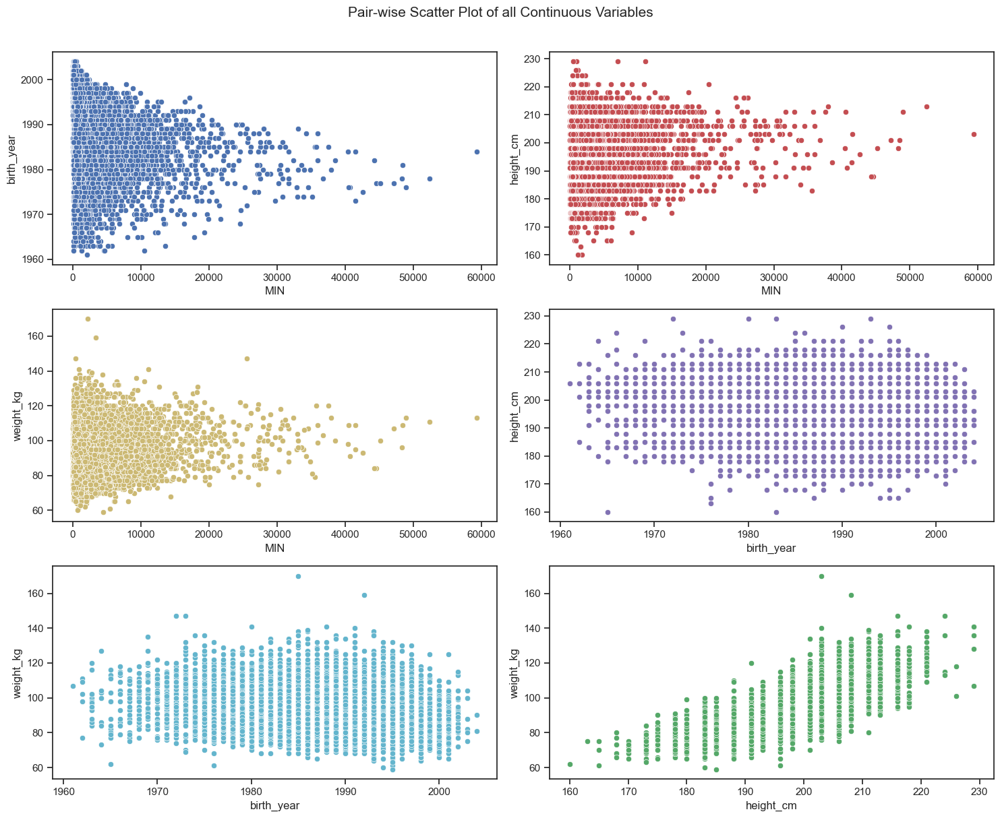

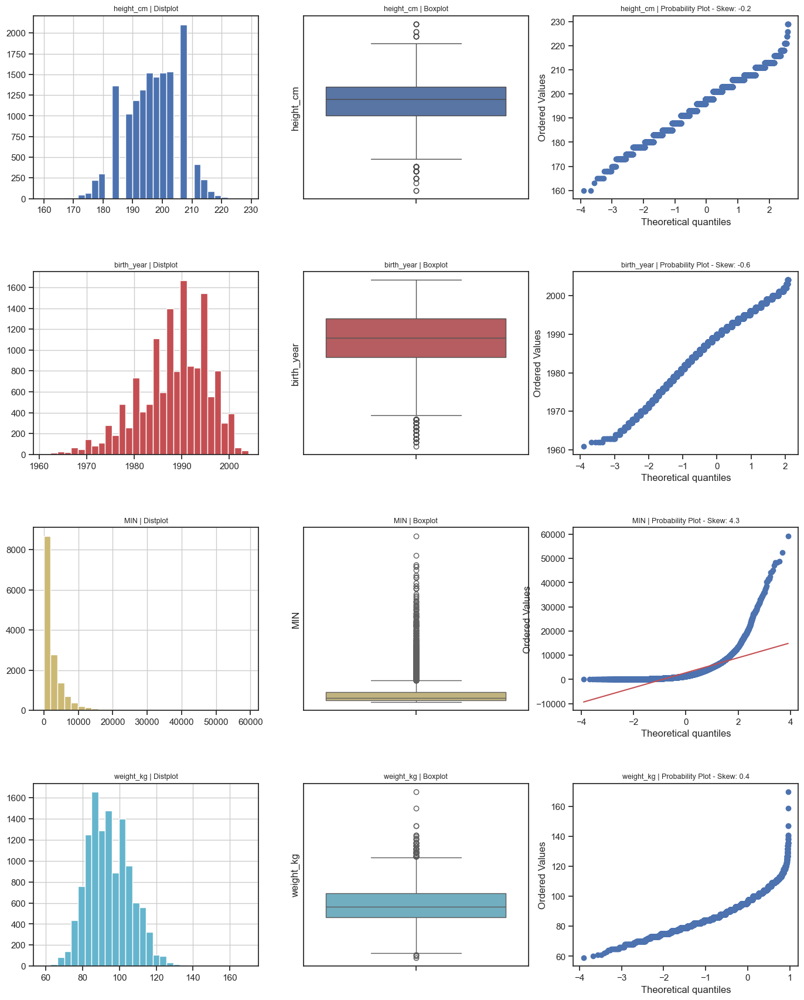

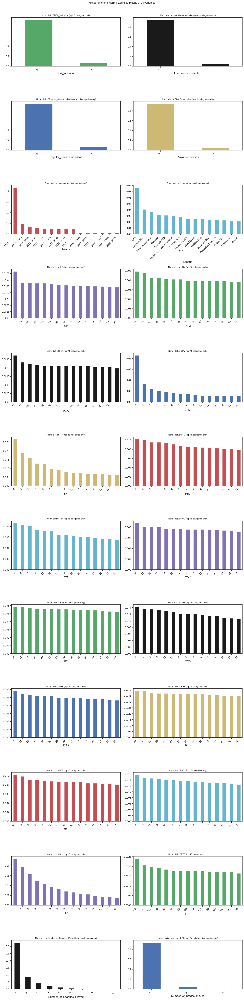

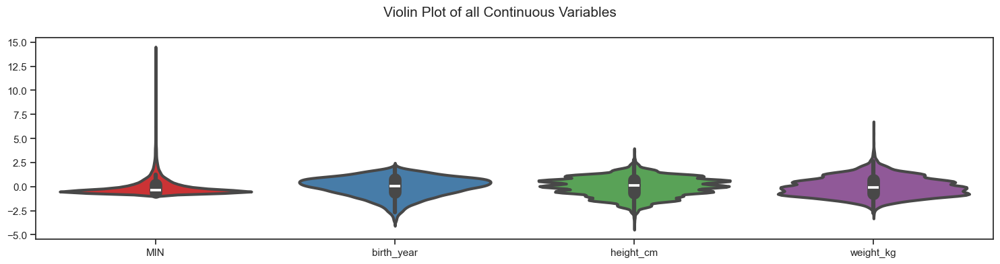

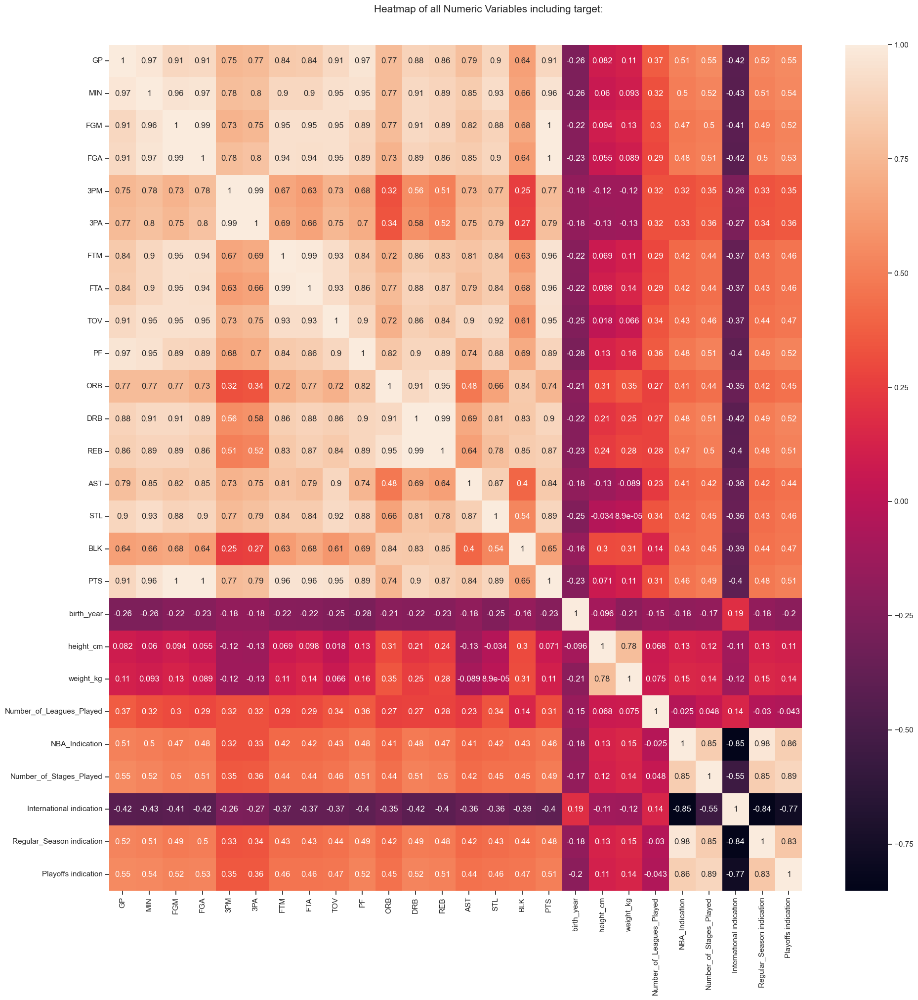

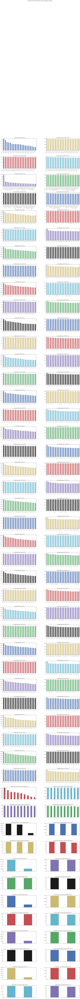

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     C:\Users\noaga\AppData\Roaming\nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     C:\Users\noaga\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     C:\Users\noaga\AppData\Roaming\nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     C:\Users\noaga\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     C:\Users\noaga\AppData\Roaming\nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]   

Could not draw wordcloud plot for Team. 
Looks like you are missing some required data for this feature.

To download the necessary data, simply run

    python -m textblob.download_corpora

or use the NLTK downloader to download the missing data: http://nltk.org/data.html
If this doesn't fix the problem, file an issue at https://github.com/sloria/TextBlob/issues.

All Plots done
Time to run AutoViz = 58 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


,Player,League,Season,Team,GP,MIN,FGM,FGA,3PM,3PA,FTM,FTA,TOV,PF,ORB,DRB,REB,AST,STL,BLK,PTS,birth_year,height_cm,weight_kg,Number_of_Leagues_Played,NBA_Indication,Number_of_Stages_Played,International indication,Regular_Season indication,Playoffs indication
0,. Rufukatijiang,Chinese-CBA,2019 - 2020,XIN,20,249.0,56,96,0,0,19,27,21,34,25,48,73,9,5,1,131,1998.0,NaN,NaN,1,0,1,1,0,0
1,A'uston Calhoun,Swiss-LNA,2018 - 2019,STA,50,1360.0,246,558,46,141,96,128,94,98,97,178,275,70,30,19,634,1990.0,201.0,106.0,2,0,1,1,0,0
2,A.C. Green,NBA,2000 - 2001,MIA,187,3769.0,354,801,1,10,161,229,107,290,310,585,895,132,97,29,870,1963.0,206.0,100.0,1,1,2,0,1,1
3,A.D. Vassallo,Mexican-LNBP,2019 - 2020,AST,68,1952.5,394,870,175,434,209,249,150,163,47,248,295,140,58,19,1172,1986.0,198.0,98.0,2,0,1,1,0,0
4,A.J. Bramlett,Eurocup,2007 - 2008,ASK,98,2842.7,468,884,0,6,176,366,182,345,309,433,742,158,81,94,1112,1977.0,208.0,103.0,2,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14577,Zygimantas Jonusas,Lithuanian-LKL,2013 - 2014,PZV,329,9510.5,1296,2872,626,1624,756,1002,513,947,278,967,1245,477,281,57,3974,1982.0,201.0,98.0,4,0,1,1,0,0
14578,Zygimantas Riauka,Danish-Basketligaen,2017 - 2018,FOG,30,507.2,80,148,0,0,51,70,35,77,68,97,165,19,10,15,211,1993.0,206.0,107.0,1,0,1,1,0,0
14579,Zygimantas Skucas,Lithuanian-LKL,2019 - 2020,JUV,203,4392.3,605,1257,113,389,368,503,369,575,253,609,862,272,121,135,1691,1992.0,201.0,98.0,3,0,1,1,0,0
14580,Zygis Sestokas,Lithuanian-LKL,2012 - 2013,SAK,42,784.3,90,201,58,138,28,37,26,82,9,40,49,29,19,0,266,1986.0,196.0,88.0,1,0,1,1,0,0


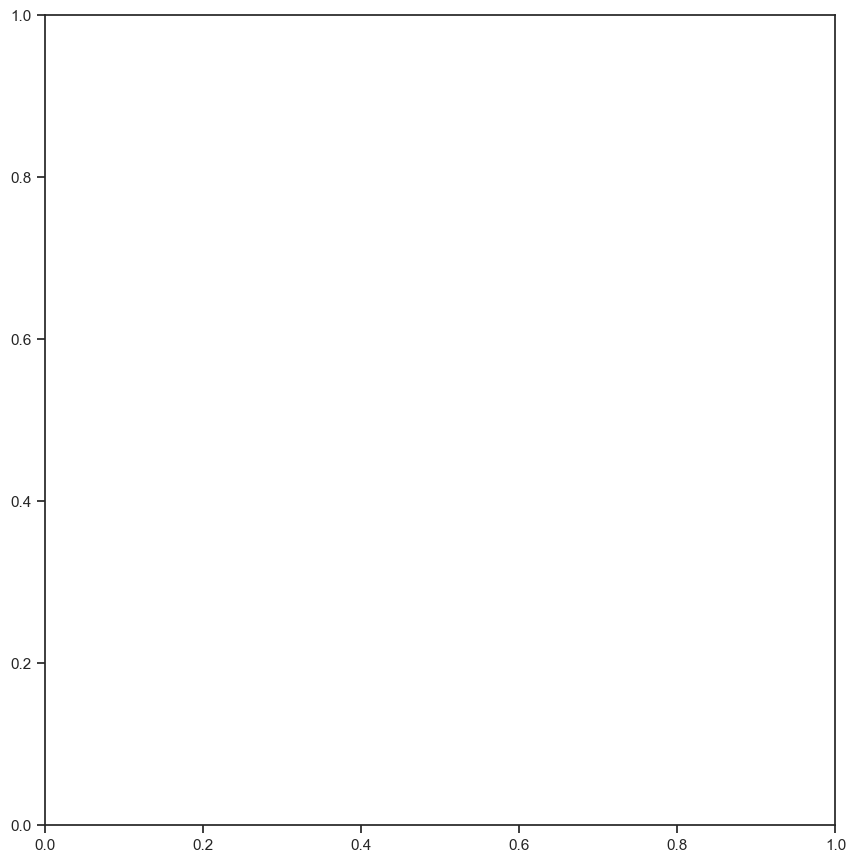

In [206]:
#Descriptive Statistics
#Automated reports
#AutoViz

from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline

# יצירת אובייקט של AutoViz
AV = AutoViz_Class()

# הרצת AutoViz על הקובץ שלך
AV.AutoViz('C:/Users/noaga/OneDrive - Payoneer/Desktop/ML Project/NBA_prepared.csv')


In [207]:
#EDA - Explenatory Data Analysis
# Descriptive Statistics
# הצגת תיאור סטטיסטי של הנתונים
print(NBA_prepared.describe())



            GP            MIN           FGM           FGA           3PM      \
count  14582.000000  14582.000000  14582.000000  14582.000000  14582.000000   
mean     112.151077   2783.769154    418.807845    906.777328    105.324990   
std      141.714248   3977.072247    681.458255   1459.030220    183.006652   
min        1.000000      0.000000      0.000000      0.000000      0.000000   
25%       27.000000    592.650000     77.000000    175.000000      9.000000   
50%       61.000000   1423.000000    204.000000    448.000000     39.000000   
75%      144.000000   3462.000000    505.000000   1094.000000    123.000000   
max     1525.000000  59365.000000  15152.000000  30168.000000   2898.000000   

            3PA           FTM           FTA           TOV           PF       \
count  14582.000000  14582.000000  14582.000000  14582.000000  14582.000000   
mean     298.707653    208.283020    281.224112    174.849541    259.352695   
std      490.800843    385.300692    498.506831    

In [208]:
#תיאור:
#סינון שחקנים עם GP שווה ל-0: הקוד מבצע סינון לשחקנים שלא שיחקו כלל (כאשר ה-"GP" שלהם הוא 0).
#חישוב ממוצעים: הקוד מחלק את ערך כל עמודה ב-"GP" כדי לחשב את הממוצע למשחק.
#הפרדה לשחקני NBA ולא NBA: הקוד מפריד בין שחקני NBA (אינדקציה 1) לשחקנים שלא ב-NBA (אינדקציה 0).
#הדפסת ממוצעים: מציג ממוצעים עבור כל משתנה (כגון ריבאונדים, אסיסטים, נקודות וכו') לשחקני NBA ושחקנים שלא ב-NBA.
#הצגת גרפים: הצגת גרפים להשוואה בין שחקני NBA לשחקנים לא NBA לכל משתנה.


NBA players averages:
Avg_REB     4.274270
Avg_AST     2.104052
Avg_PTS    10.040973
Avg_MIN    24.259598
Avg_FGM     3.740111
Avg_FGA     8.202858
Avg_3PM     0.777542
Avg_3PA     2.172494
Avg_FTM     1.783349
Avg_FTA     2.365864
Avg_TOV     1.382630
Avg_PF      2.176195
Avg_ORB     1.122547
Avg_DRB     3.151723
Avg_STL     0.773589
Avg_BLK     0.490691
dtype: float64

Non-NBA players averages:
Avg_REB     3.810970
Avg_AST     1.754885
Avg_PTS     9.253144
Avg_MIN    23.010930
Avg_FGM     3.373105
Avg_FGA     7.400054
Avg_3PM     0.879476
Avg_3PA     2.592814
Avg_FTM     1.626596
Avg_FTA     2.268902
Avg_TOV     1.532053
Avg_PF      2.272111
Avg_ORB     1.094688
Avg_DRB     2.716282
Avg_STL     0.842976
Avg_BLK     0.279876
dtype: float64


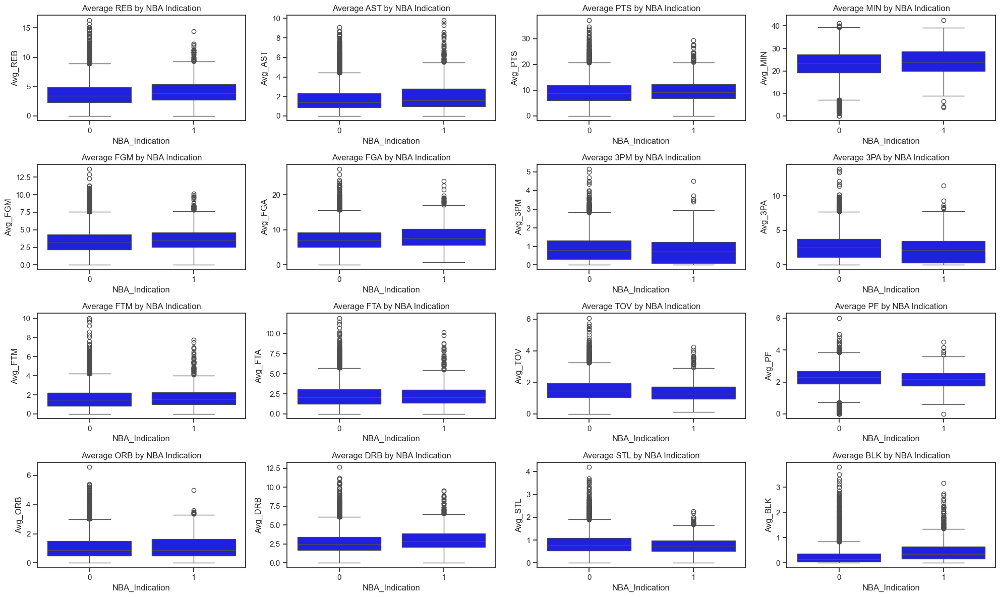

In [209]:
#Target Value
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt

# קריאת הקובץ
df = pd.read_csv('C:/Users/noaga/OneDrive - Payoneer/Desktop/ML Project/NBA_prepared.csv')

# סינון שחקנים עם GP שווה ל-0 (לא שיחקו בכלל)
df = df[df['GP'] > 0]

# משתנים שצריך לחשב להם ממוצעים
columns_to_avg = ["REB", "AST", "PTS", "MIN", "FGM", "FGA", "3PM", "3PA", "FTM", "FTA", "TOV", "PF", "ORB", "DRB", "STL", "BLK"]

# חישוב ממוצעים לכל עמודה על פי GP (Games Played)
for col in columns_to_avg:
    df[f'Avg_{col}'] = df[col] / df['GP']

# הפרדה בין שחקני NBA לשחקנים שלא ב-NBA
nba_players = df[df['NBA_Indication'] == 1]
non_nba_players = df[df['NBA_Indication'] == 0]

# הצגת ממוצעים עבור שחקני NBA ושחקנים לא NBA
print("NBA players averages:")
print(nba_players[[f'Avg_{col}' for col in columns_to_avg]].mean())

print("\nNon-NBA players averages:")
print(non_nba_players[[f'Avg_{col}' for col in columns_to_avg]].mean())

# הצגת גרפים להשוואת ממוצעים
plt.figure(figsize=(20, 12))

# גרפים לכל המשתנים בצבע כחול
for i, col in enumerate(columns_to_avg, 1):
    plt.subplot(4, 4, i)  # 4 שורות ו-4 עמודות עבור כל המשתנים
    sb.boxplot(x='NBA_Indication', y=f'Avg_{col}', data=df, color='blue')
    plt.title(f'Average {col} by NBA Indication')

plt.tight_layout()
plt.show()


In [210]:
#מה עושה הקוד:
#חישוב ממוצעים: מחושב ממוצע של משקל, גובה ושנת לידה עבור שחקני NBA ושחקנים שלא ב-NBA, ומשווה ביניהם.
#הצגת התפלגות:
#משקל: התפלגות משקל עבור שחקני NBA ולא NBA.
#גובה: התפלגות גובה עבור שחקני NBA ולא NBA.
#שנת לידה: התפלגות שנת לידה עבור שחקני NBA ולא NBA.
#הקוד מציג את המידע בצורה ברורה באמצעות גרפים כדי לראות את ההבדלים בין שתי הקבוצות.

Average values for NBA players:
weight_kg       99.913315
height_cm      200.774799
birth_year    1983.791778
dtype: float64
Average values for non-NBA players:
weight_kg       93.773045
height_cm      196.440239
birth_year    1988.762962
dtype: float64


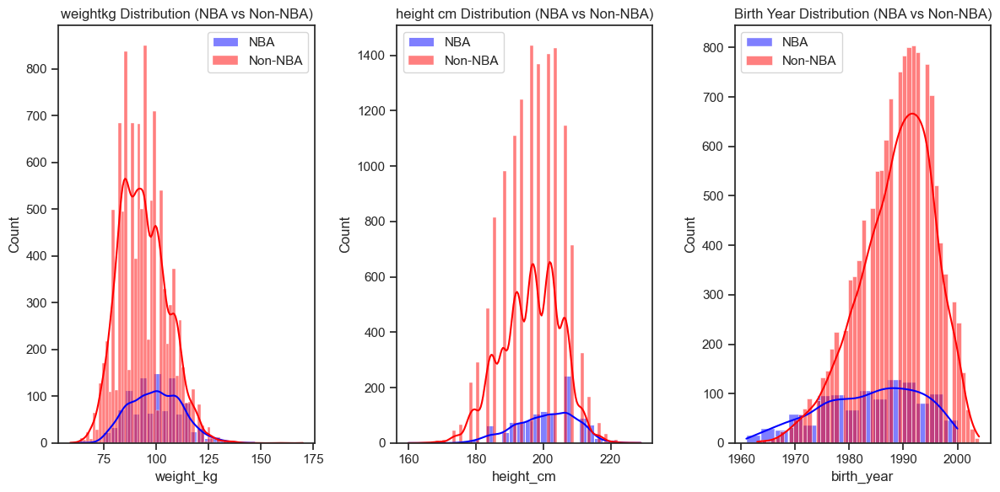

In [211]:
import seaborn as sb
import matplotlib.pyplot as plt

# חישוב ממוצעים עבור משקל, גובה ושנת לידה
nba_players_avg = nba_players[['weight_kg', 'height_cm', 'birth_year']].mean()
non_nba_players_avg = non_nba_players[['weight_kg', 'height_cm', 'birth_year']].mean()

print(f"Average values for NBA players:\n{nba_players_avg}")
print(f"Average values for non-NBA players:\n{non_nba_players_avg}")

# הצגת התפלגות משקל עבור שחקני NBA ולא NBA בנפרד
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
sb.histplot(nba_players['weight_kg'], kde=True, color='blue', label='NBA')
sb.histplot(non_nba_players['weight_kg'], kde=True, color='red', label='Non-NBA')
plt.title('weightkg Distribution (NBA vs Non-NBA)')
plt.legend()

# הצגת התפלגות גובה עבור שחקני NBA ולא NBA בנפרד
plt.subplot(1, 3, 2)
sb.histplot(nba_players['height_cm'], kde=True, color='blue', label='NBA')
sb.histplot(non_nba_players['height_cm'], kde=True, color='red', label='Non-NBA')
plt.title('height cm Distribution (NBA vs Non-NBA)')
plt.legend()

# הצגת התפלגות שנת לידה עבור שחקני NBA ולא NBA בנפרד
plt.subplot(1, 3, 3)
sb.histplot(nba_players['birth_year'], kde=True, color='blue', label='NBA')
sb.histplot(non_nba_players['birth_year'], kde=True, color='red', label='Non-NBA')
plt.title('Birth Year Distribution (NBA vs Non-NBA)')
plt.legend()

# הצגת הגרפים
plt.tight_layout()
plt.show()
		


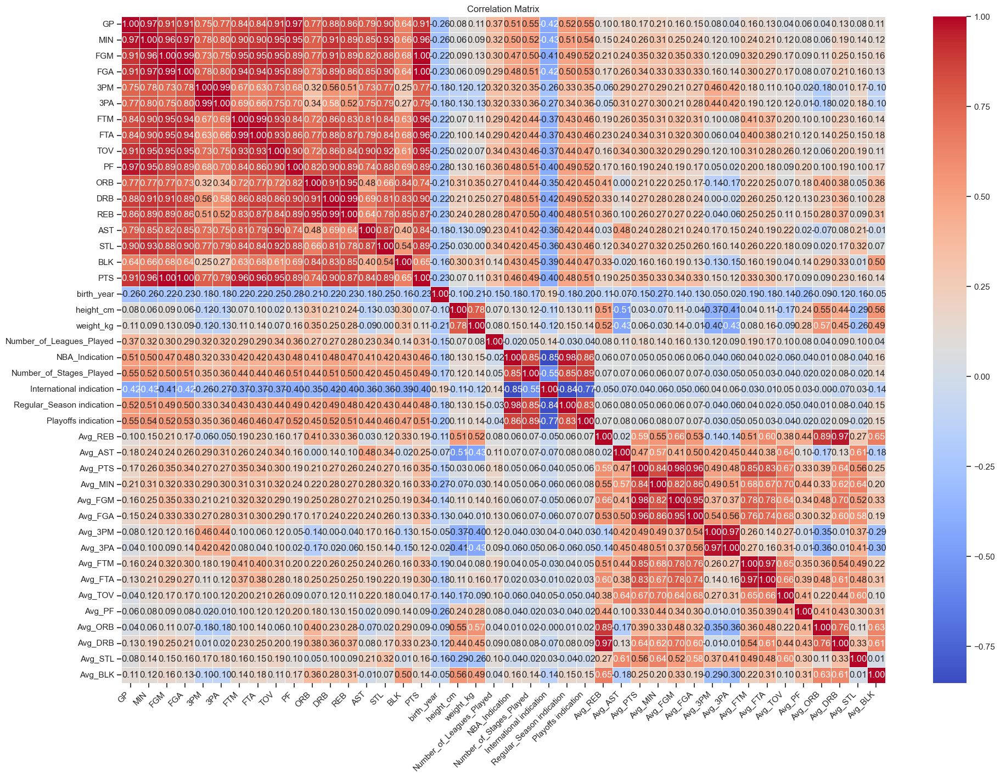

In [212]:

# ניתוח קורלציות בין המשתנים השונים
# הסרת עמודות שאינן מספריות לפני חישוב הקורלציות
numeric_df = df.select_dtypes(include=['number'])
correlation_matrix = numeric_df.corr()

# יצירת מטריצת קורלציות קריאה יותר
plt.figure(figsize=(20, 15))
heatmap = sb.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, horizontalalignment='right')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.title('Correlation Matrix')
plt.show()

                           Missing Values Percentage
Player                             0         0.00%  
League                             0         0.00%  
Season                             0         0.00%  
Team                               6         0.04%  
GP                                 0         0.00%  
MIN                                0         0.00%  
FGM                                0         0.00%  
FGA                                0         0.00%  
3PM                                0         0.00%  
3PA                                0         0.00%  
FTM                                0         0.00%  
FTA                                0         0.00%  
TOV                                0         0.00%  
PF                                 0         0.00%  
ORB                                0         0.00%  
DRB                                0         0.00%  
REB                                0         0.00%  
AST                                0         0

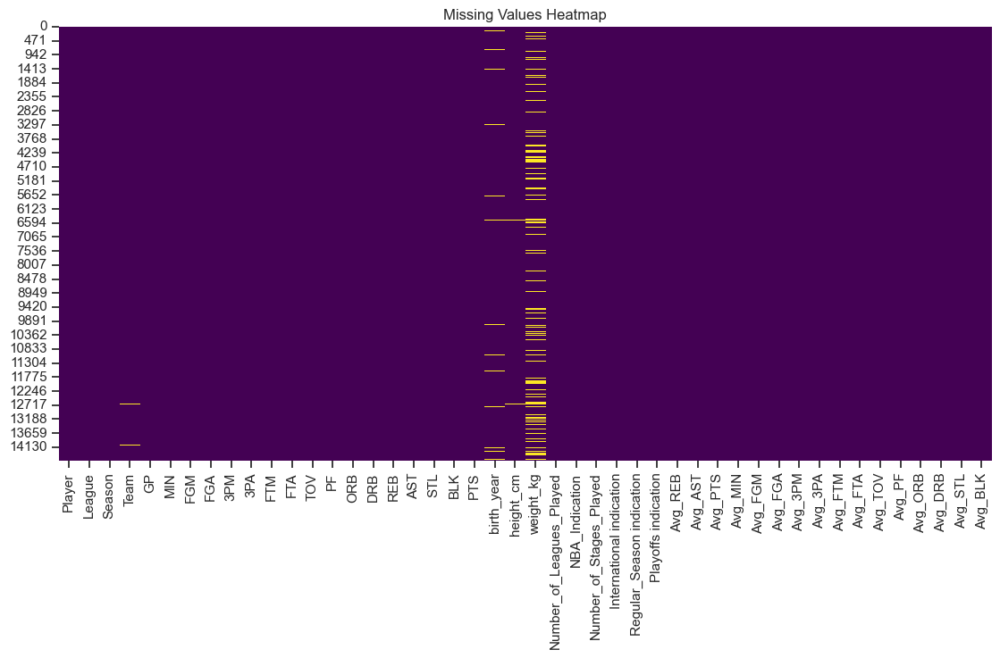

In [213]:

# בדיקת ערכים חסרים
missing_values = df.isnull().sum()
total_values = len(df)
missing_percentage = (missing_values / total_values) * 100

# הצגת מספר הערכים החסרים ואחוזם בפורמט אחוזים עם שתי ספרות אחרי הנקודה
missing_data = pd.DataFrame({'Missing Values': missing_values, 'Percentage': missing_percentage})
missing_data['Percentage'] = missing_data['Percentage'].apply(lambda x: f'{x:.2f}%')
print(missing_data)

# הצגת ערכים חסרים בגרף חום
plt.figure(figsize=(12, 6))
sb.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()

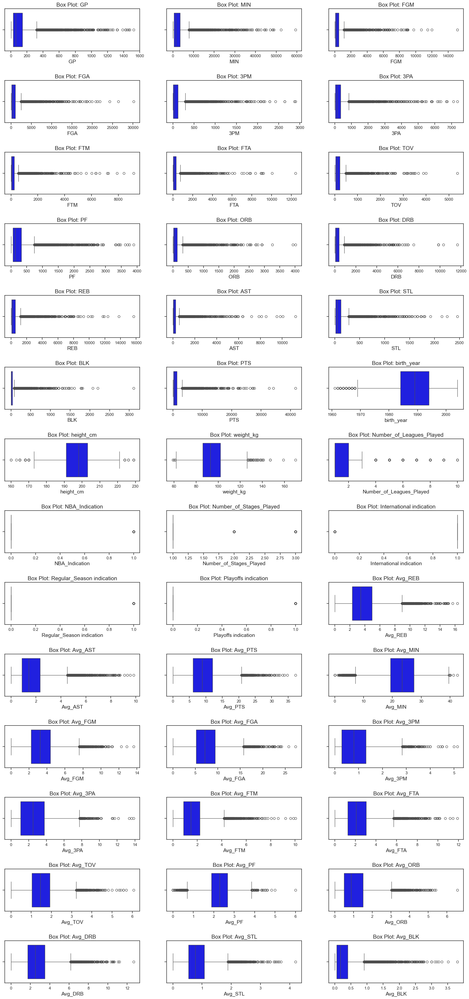

In [214]:
# בדיקת ערכים חריגים עבור משתנים שונים
# הצגת ערכים חריגים באמצעות Boxplot בצבע כחול
def outliers_boxplot(df):
    plt.figure(figsize=(20, 200))
    for i, col in enumerate(df.columns):
        if df[col].dtype in ['float64', 'int64']:
            ax = plt.subplot(60, 3, i+1)
            sb.boxplot(data=df, x=col, ax=ax, color='blue')
            plt.subplots_adjust(hspace=0.7)
            plt.title('Box Plot: {}'.format(col), fontsize=15)
            plt.xlabel('{}'.format(col), fontsize=14)

outliers_boxplot(numeric_df)


--- GP ---


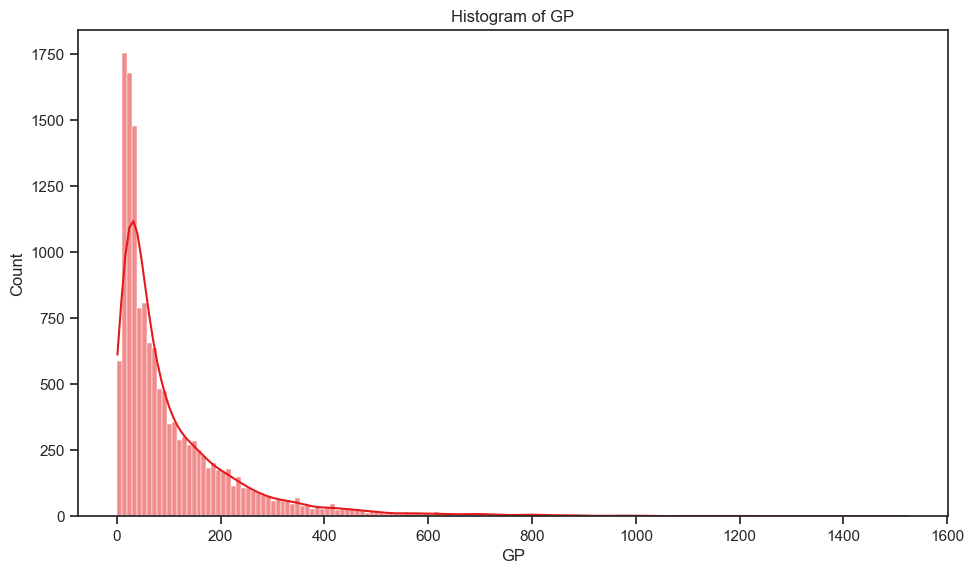

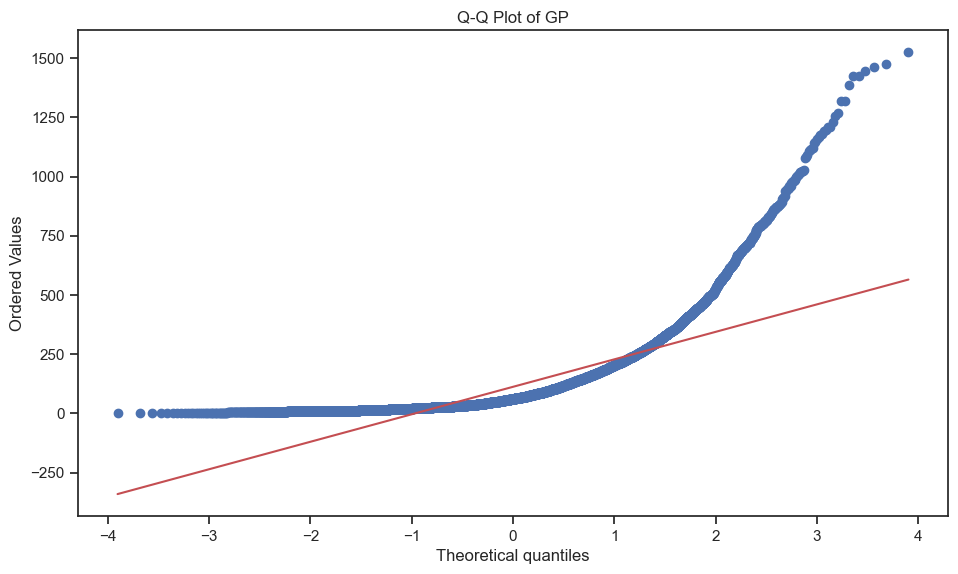

Shapiro-Wilk Test for GP:
Statistic: 0.6706576347351074, p-value: 0.0
Kolmogorov-Smirnov Test for GP:
Statistic: 0.22067798388205326, p-value: 0.0

--- MIN ---


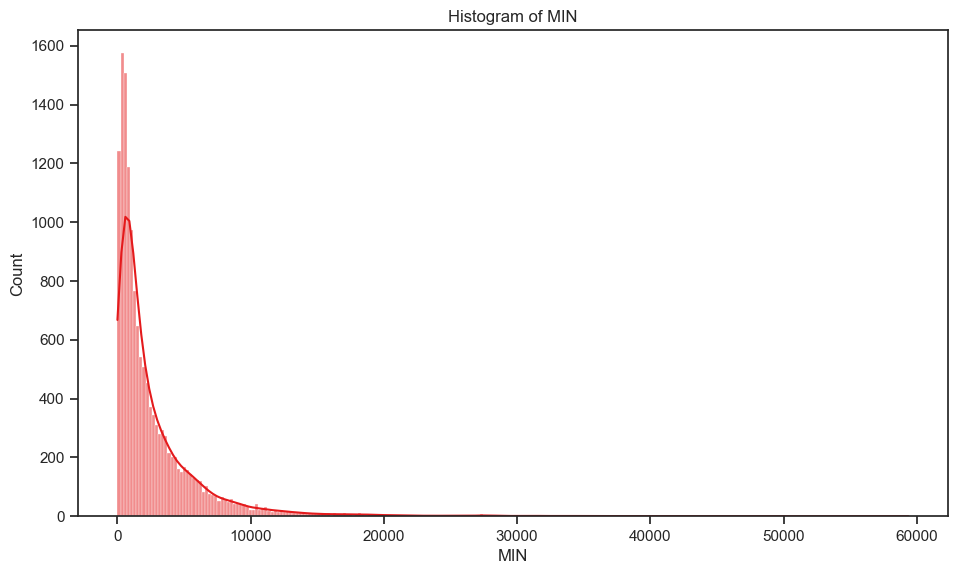

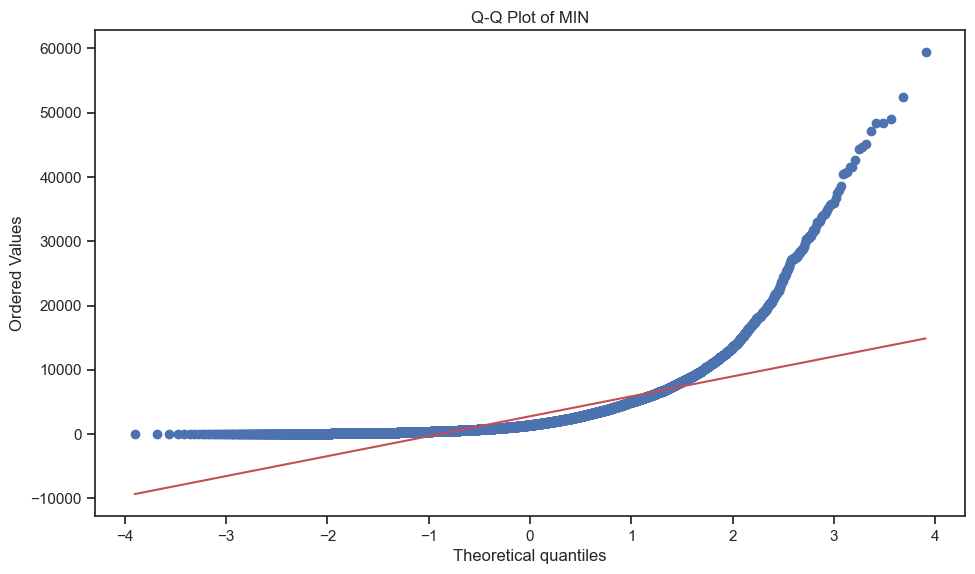

Shapiro-Wilk Test for MIN:
Statistic: 0.6074230670928955, p-value: 0.0
Kolmogorov-Smirnov Test for MIN:
Statistic: 0.2428671347226133, p-value: 0.0

--- FGM ---


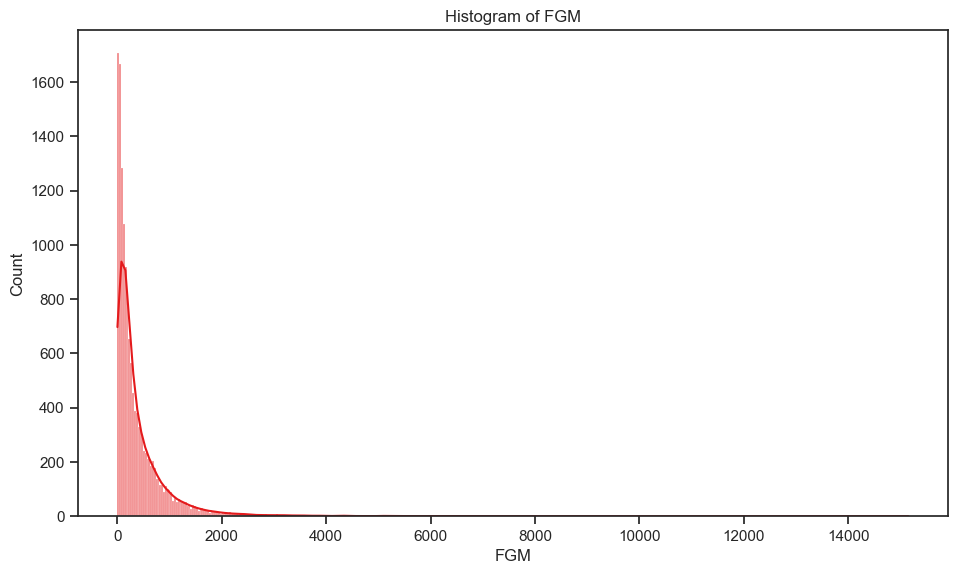

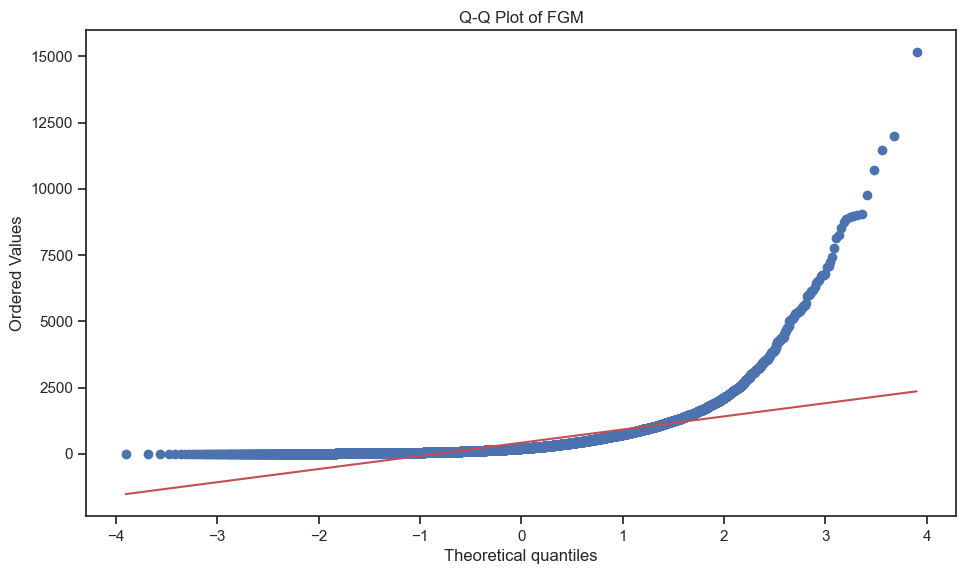

Shapiro-Wilk Test for FGM:
Statistic: 0.531664252281189, p-value: 0.0
Kolmogorov-Smirnov Test for FGM:
Statistic: 0.26941740512481316, p-value: 0.0

--- FGA ---


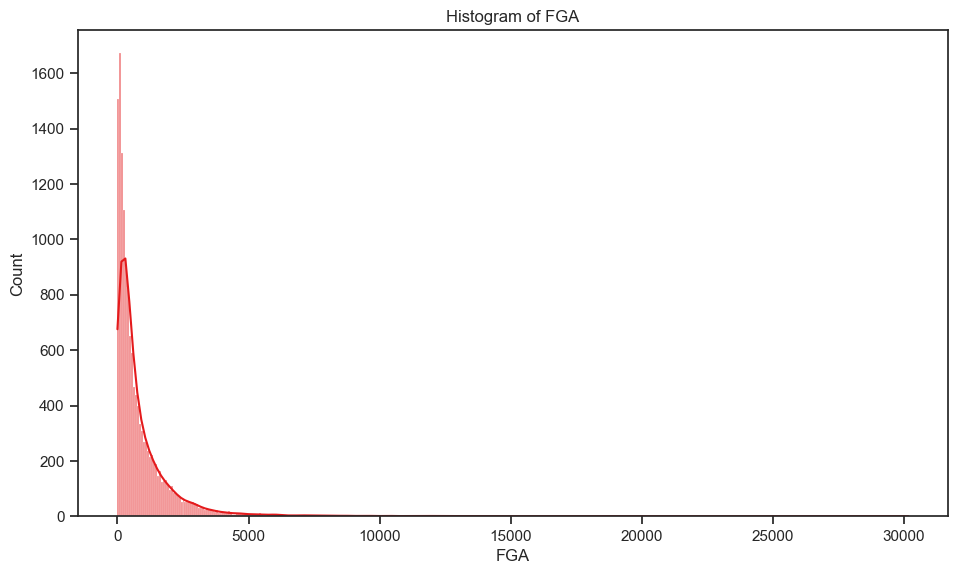

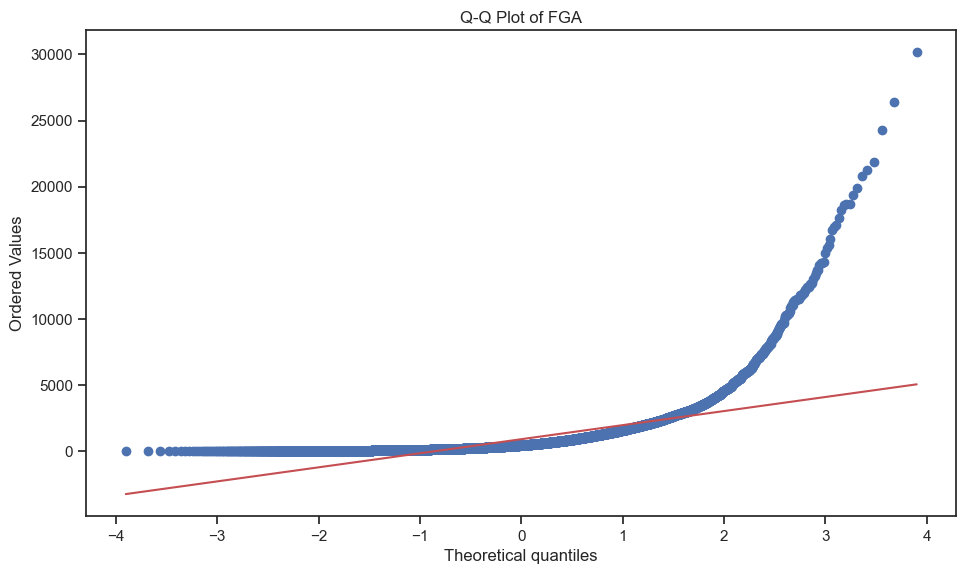

Shapiro-Wilk Test for FGA:
Statistic: 0.531354546546936, p-value: 0.0
Kolmogorov-Smirnov Test for FGA:
Statistic: 0.2672656289432972, p-value: 0.0

--- 3PM ---


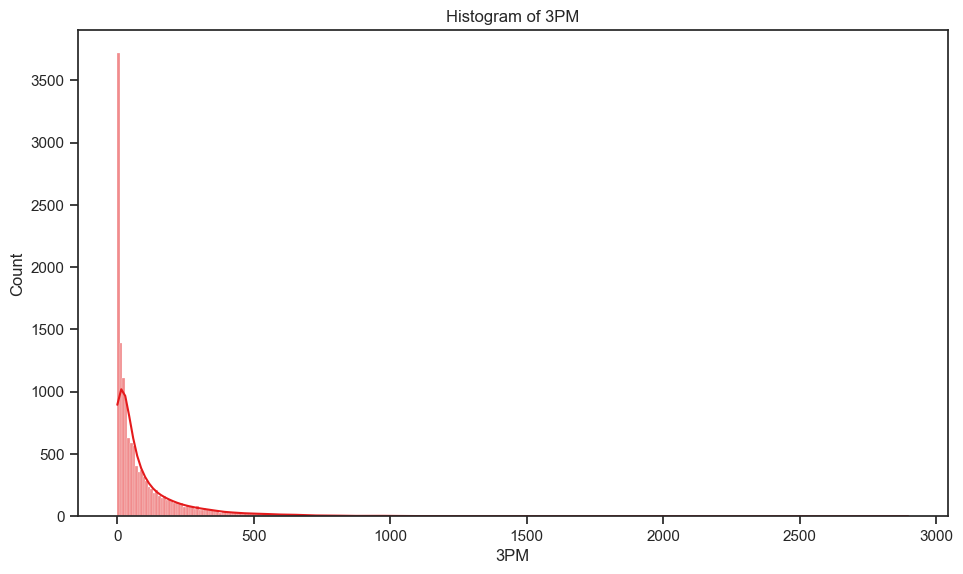

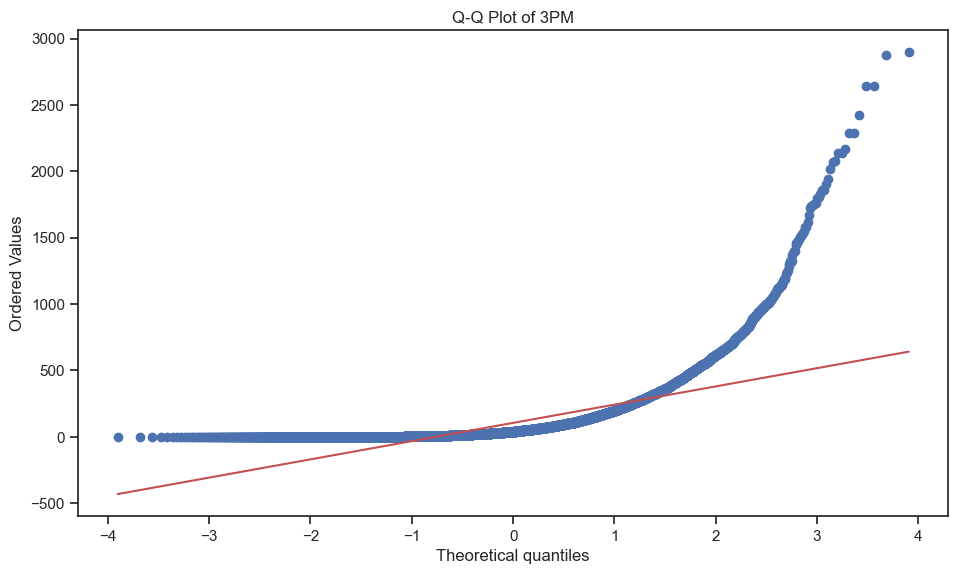

Shapiro-Wilk Test for 3PM:
Statistic: 0.5643911361694336, p-value: 0.0
Kolmogorov-Smirnov Test for 3PM:
Statistic: 0.2824679840658605, p-value: 0.0

--- 3PA ---


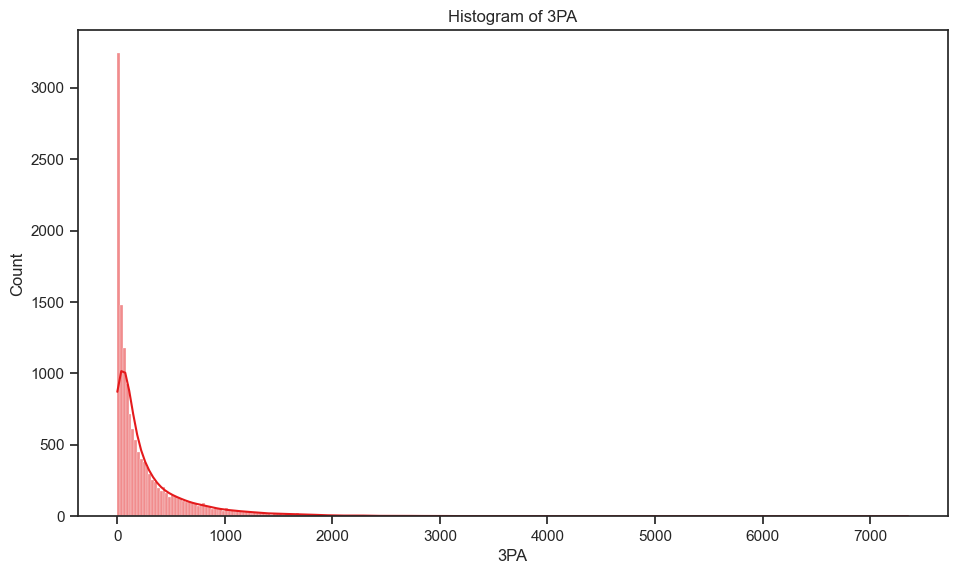

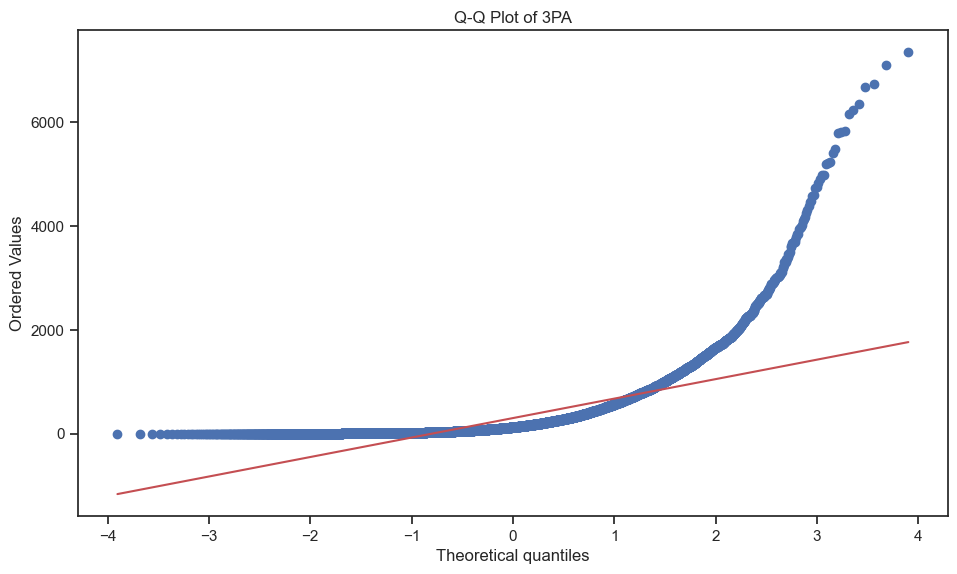

Shapiro-Wilk Test for 3PA:
Statistic: 0.5854835510253906, p-value: 0.0
Kolmogorov-Smirnov Test for 3PA:
Statistic: 0.27139057400612976, p-value: 0.0

--- FTM ---


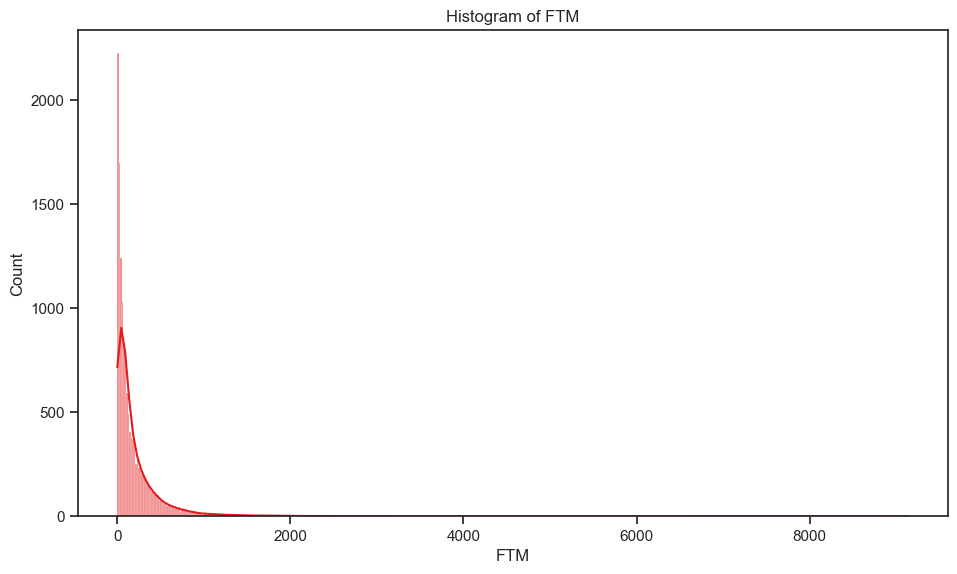

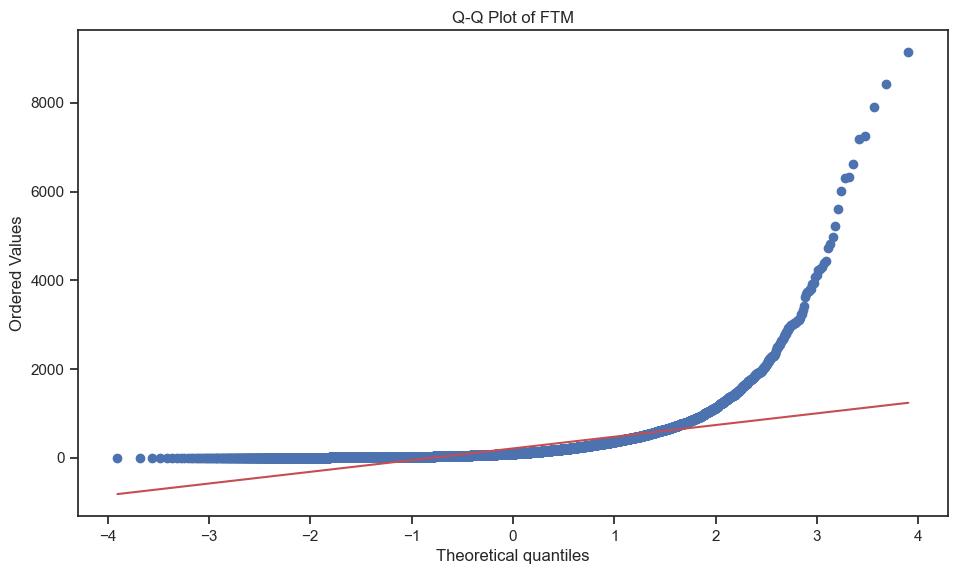

Shapiro-Wilk Test for FTM:
Statistic: 0.4686247706413269, p-value: 0.0
Kolmogorov-Smirnov Test for FTM:
Statistic: 0.29440108333774606, p-value: 0.0

--- FTA ---


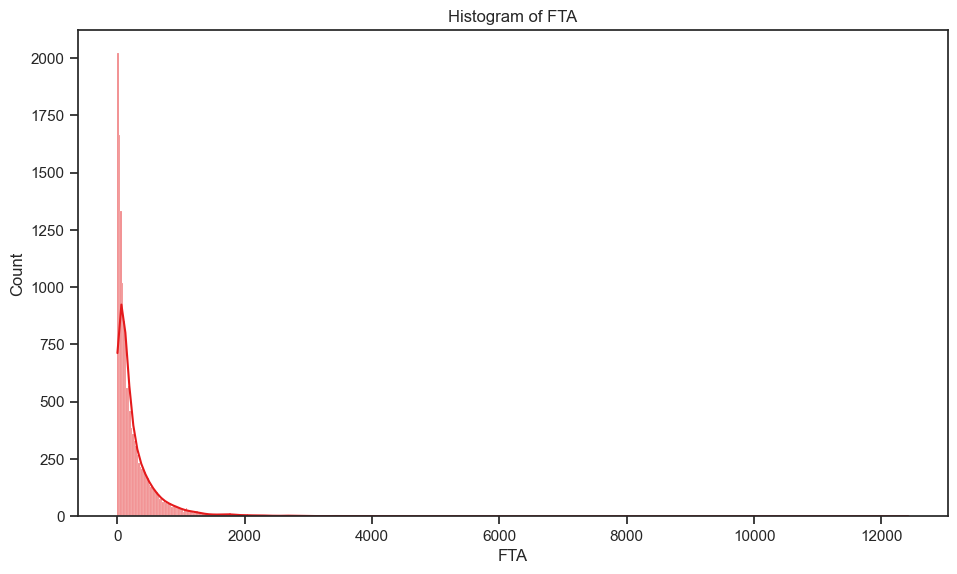

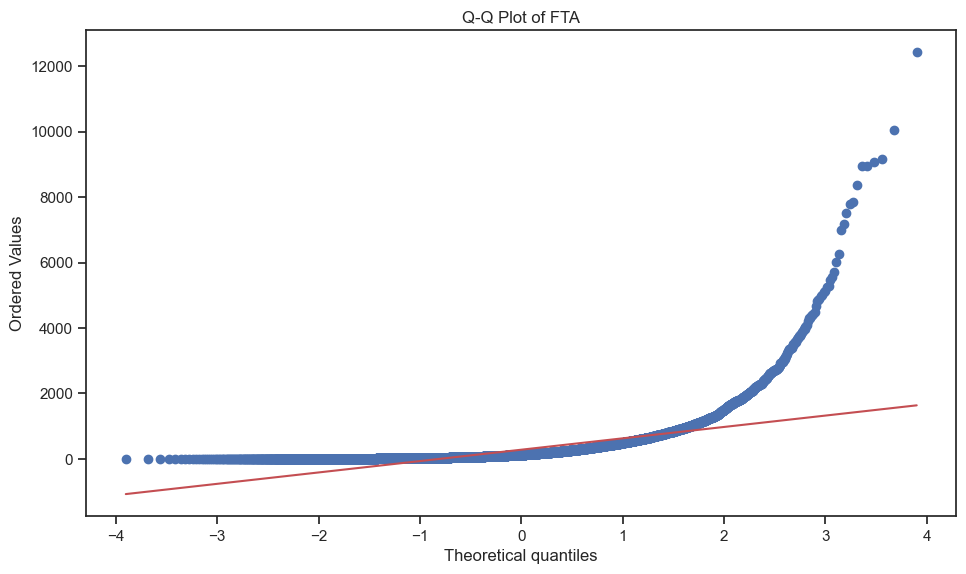

Shapiro-Wilk Test for FTA:
Statistic: 0.485797643661499, p-value: 0.0
Kolmogorov-Smirnov Test for FTA:
Statistic: 0.28633183936126105, p-value: 0.0

--- TOV ---


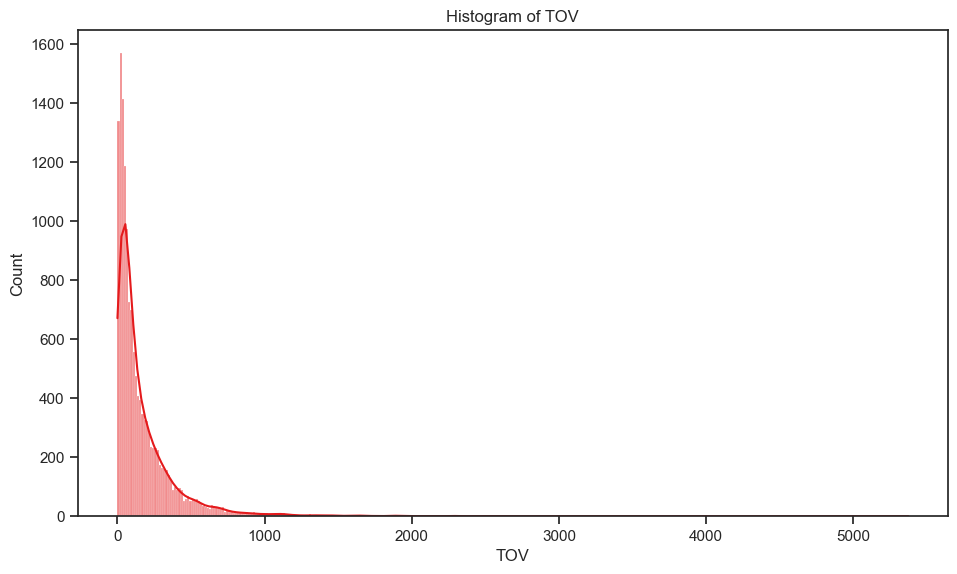

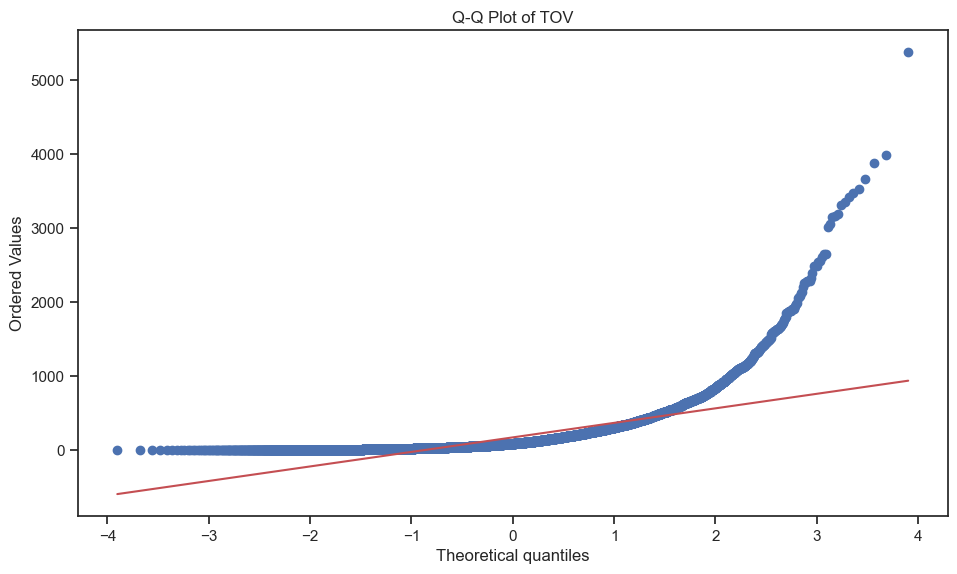

Shapiro-Wilk Test for TOV:
Statistic: 0.5838635563850403, p-value: 0.0
Kolmogorov-Smirnov Test for TOV:
Statistic: 0.24787074170780604, p-value: 0.0

--- PF ---


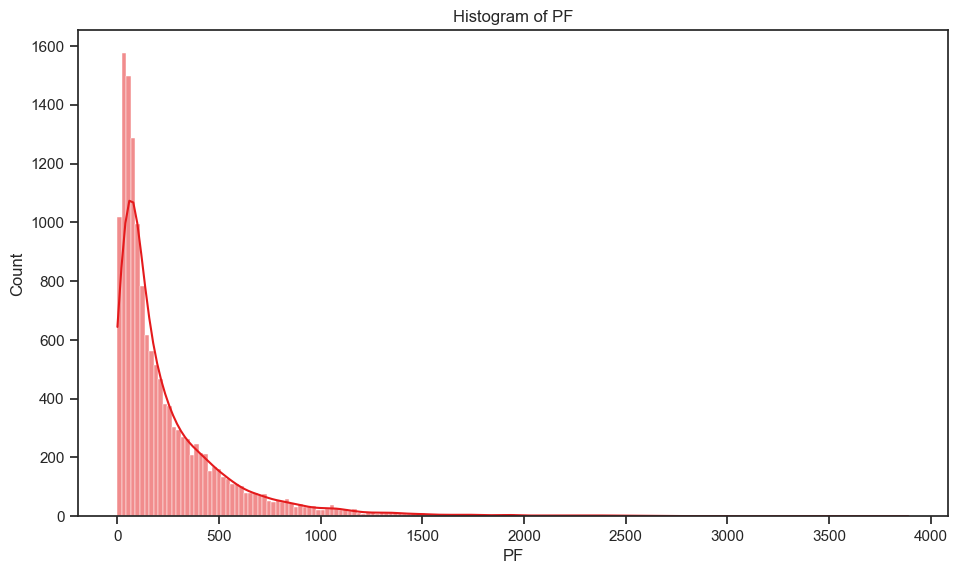

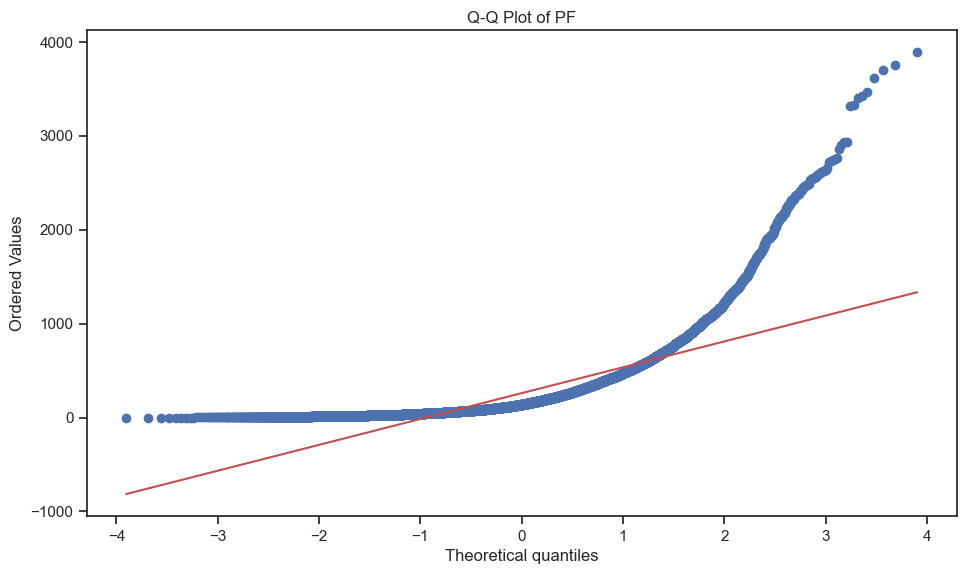

Shapiro-Wilk Test for PF:
Statistic: 0.6659612059593201, p-value: 0.0
Kolmogorov-Smirnov Test for PF:
Statistic: 0.22160710350666504, p-value: 0.0

--- ORB ---


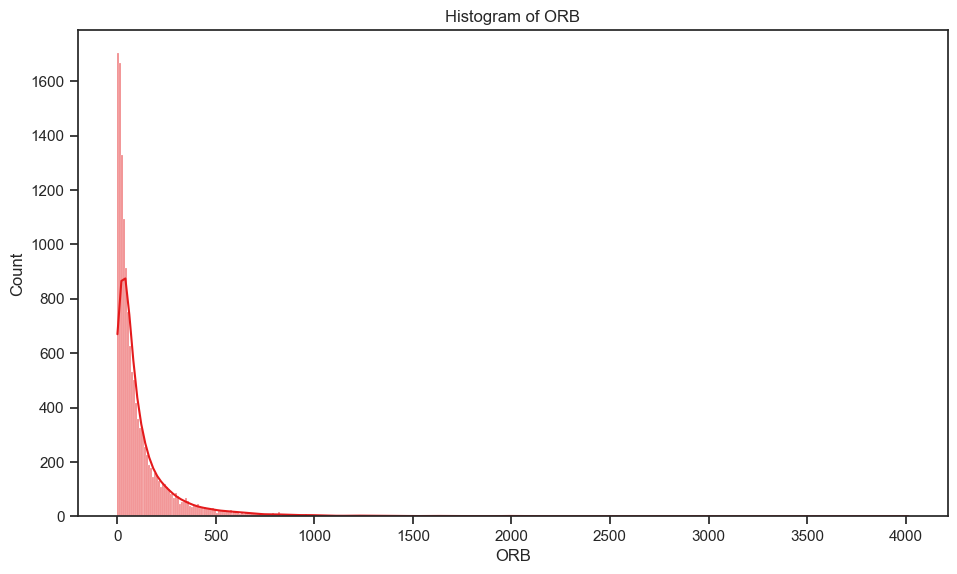

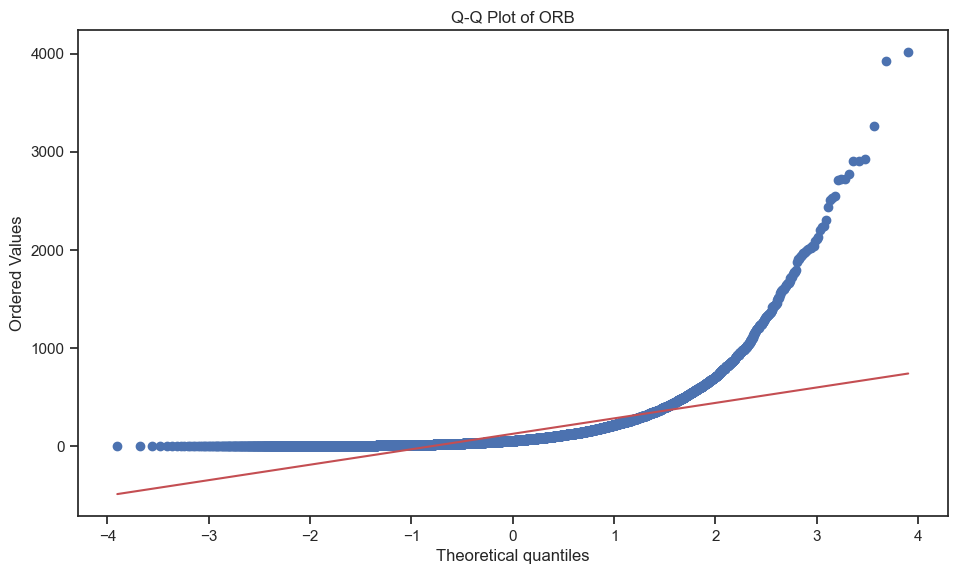

Shapiro-Wilk Test for ORB:
Statistic: 0.5218343734741211, p-value: 0.0
Kolmogorov-Smirnov Test for ORB:
Statistic: 0.27997344660724277, p-value: 0.0

--- DRB ---


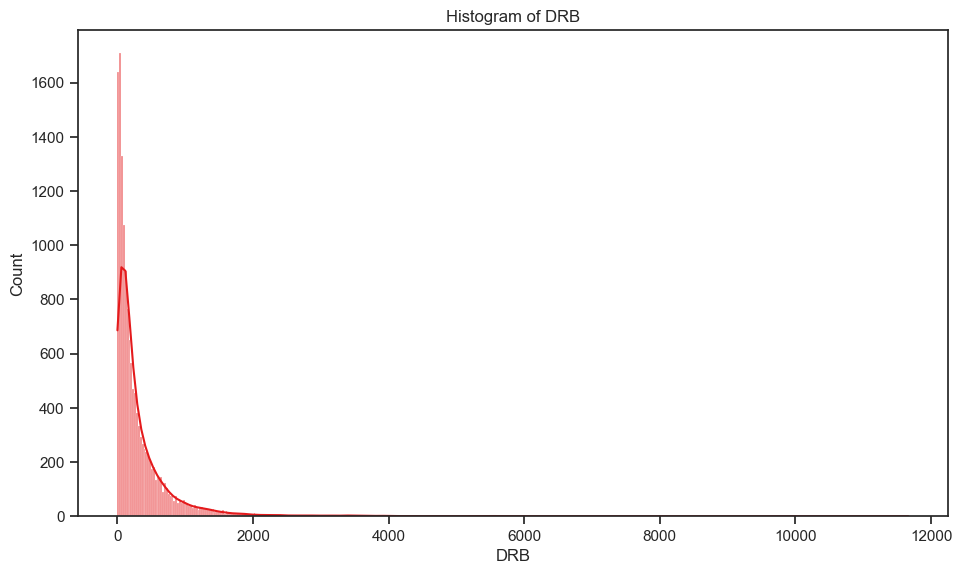

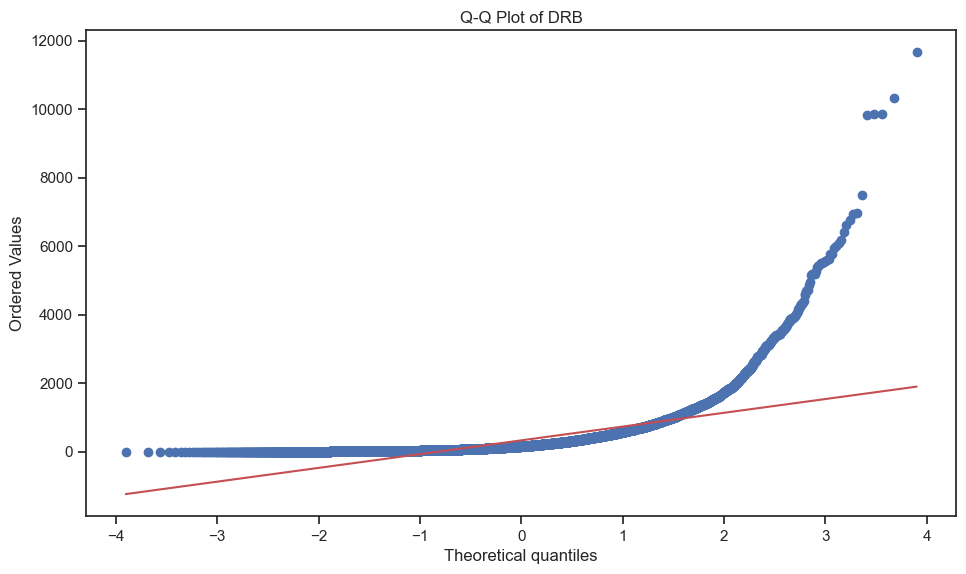

Shapiro-Wilk Test for DRB:
Statistic: 0.5229364037513733, p-value: 0.0
Kolmogorov-Smirnov Test for DRB:
Statistic: 0.27325133704870097, p-value: 0.0

--- REB ---


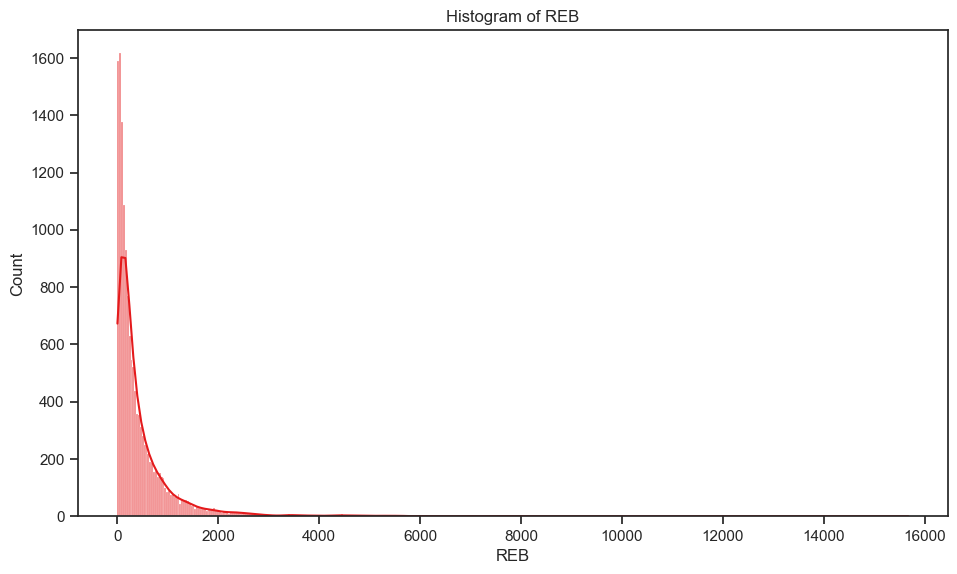

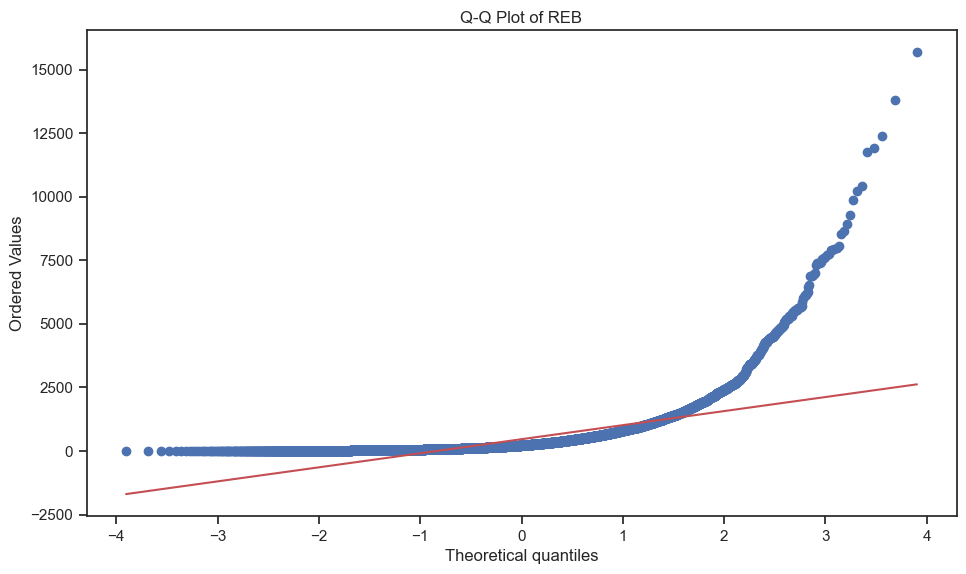

Shapiro-Wilk Test for REB:
Statistic: 0.5299241542816162, p-value: 0.0
Kolmogorov-Smirnov Test for REB:
Statistic: 0.2714745209342877, p-value: 0.0

--- AST ---


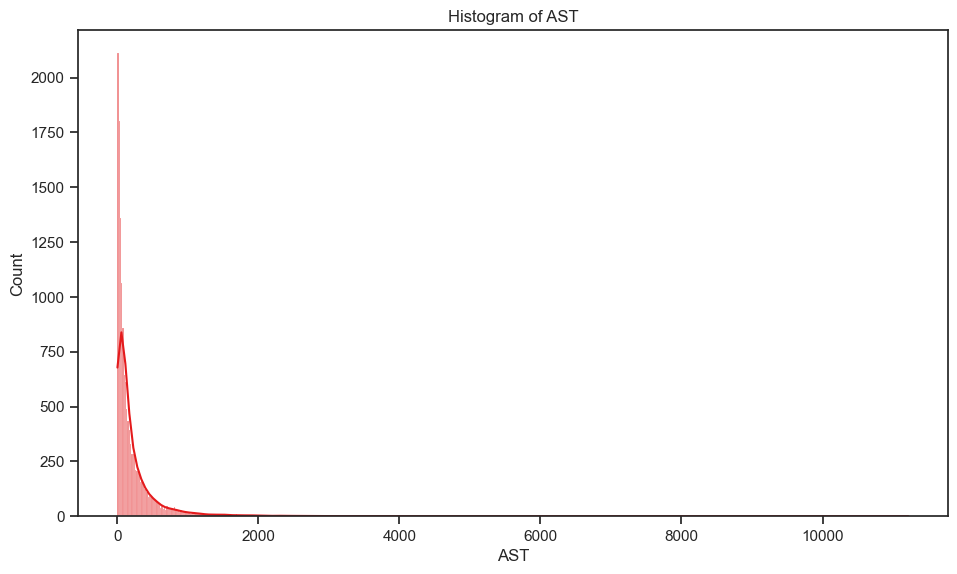

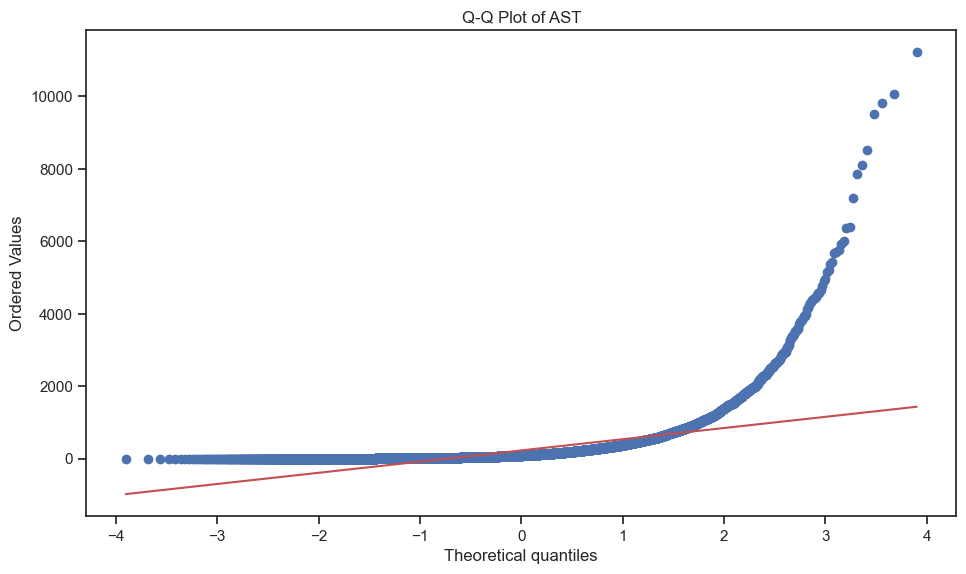

Shapiro-Wilk Test for AST:
Statistic: 0.436226487159729, p-value: 0.0
Kolmogorov-Smirnov Test for AST:
Statistic: 0.309662668940346, p-value: 0.0

--- STL ---


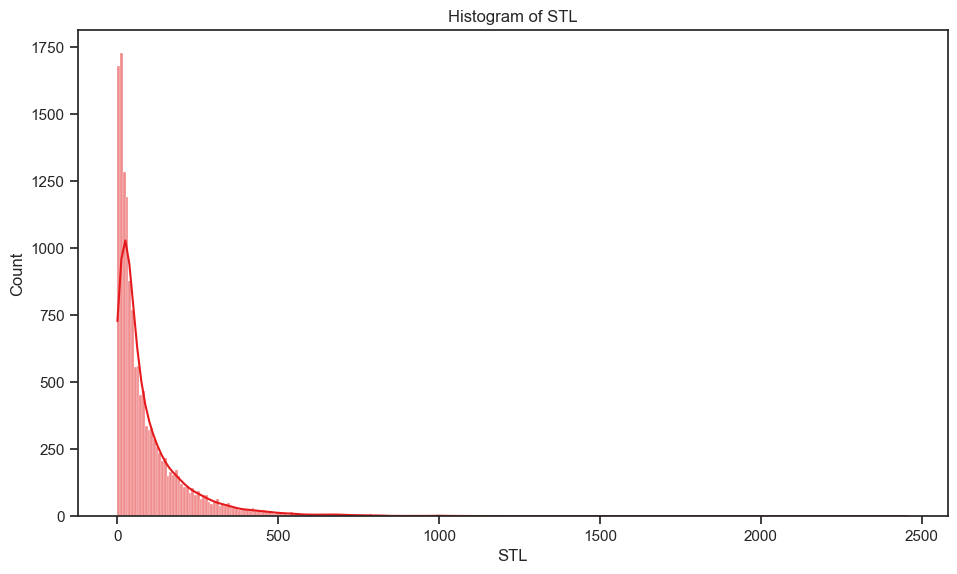

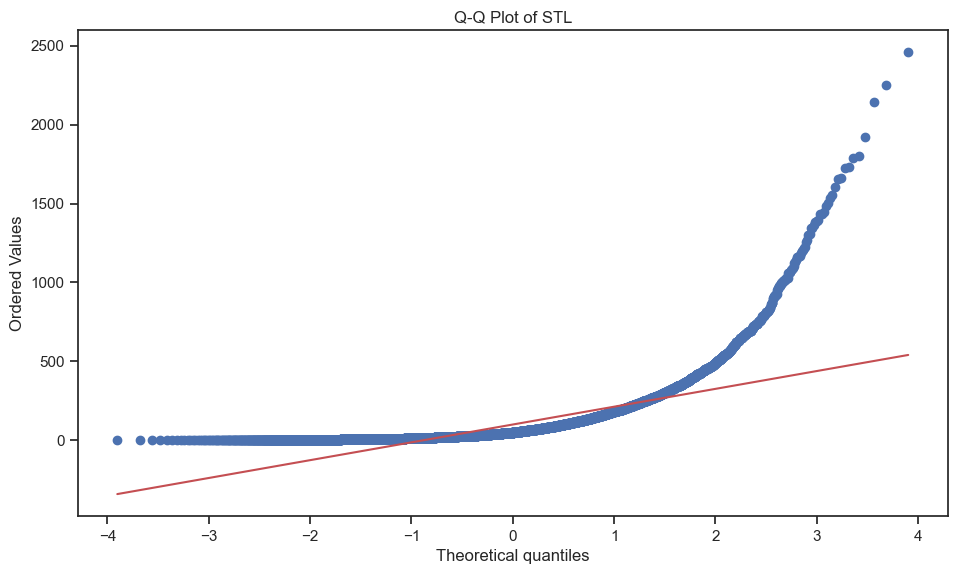

Shapiro-Wilk Test for STL:
Statistic: 0.6041214466094971, p-value: 0.0
Kolmogorov-Smirnov Test for STL:
Statistic: 0.2483192745818798, p-value: 0.0

--- BLK ---


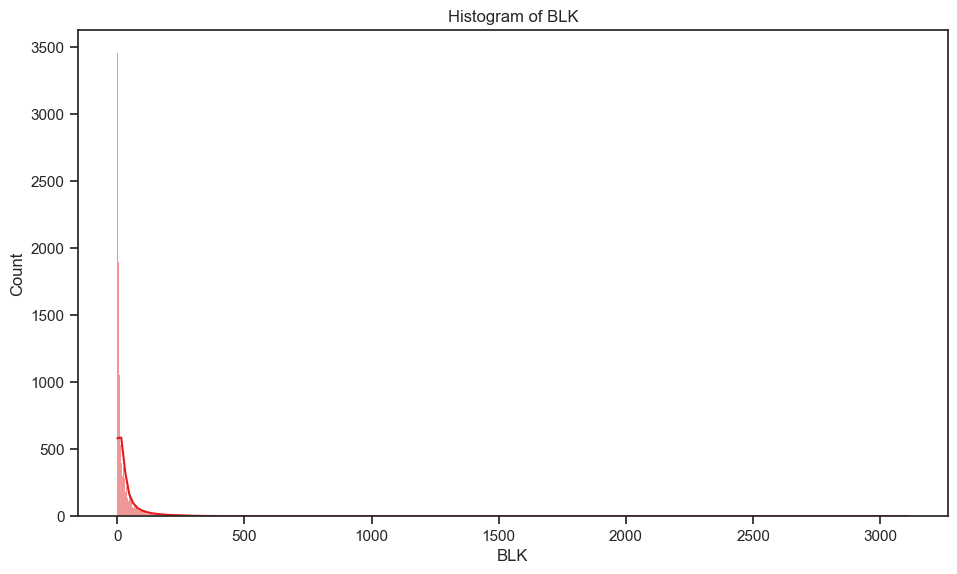

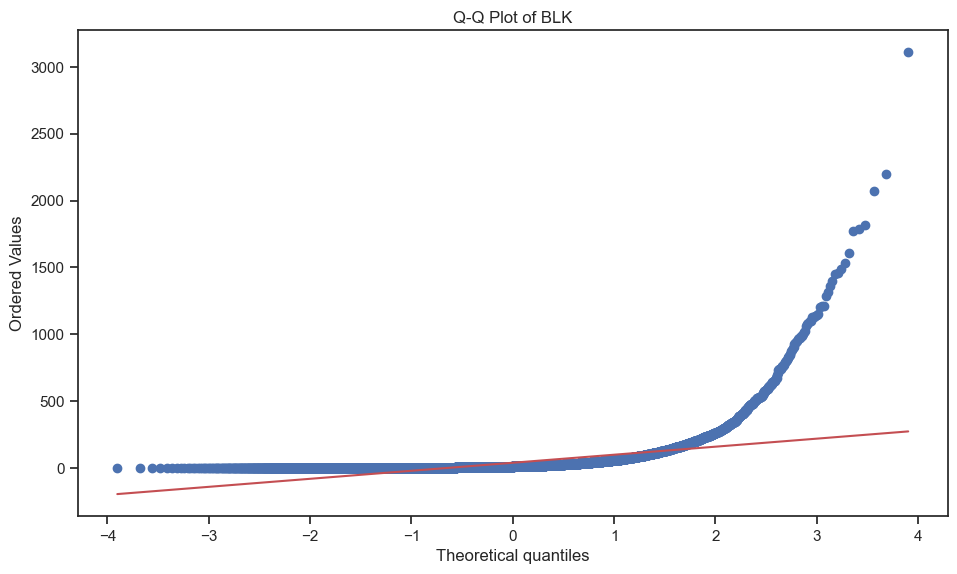

Shapiro-Wilk Test for BLK:
Statistic: 0.3481377959251404, p-value: 0.0
Kolmogorov-Smirnov Test for BLK:
Statistic: 0.35159650087830263, p-value: 0.0

--- PTS ---


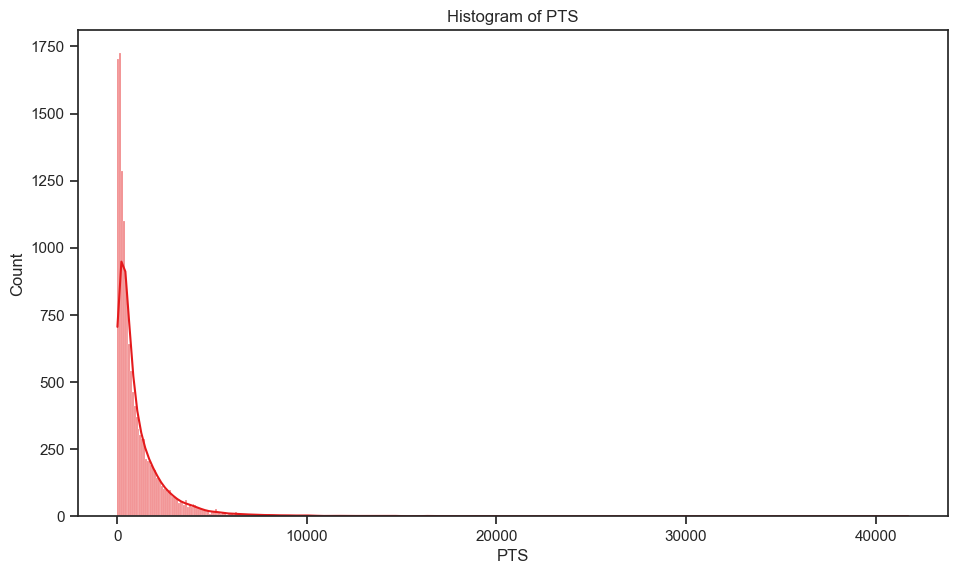

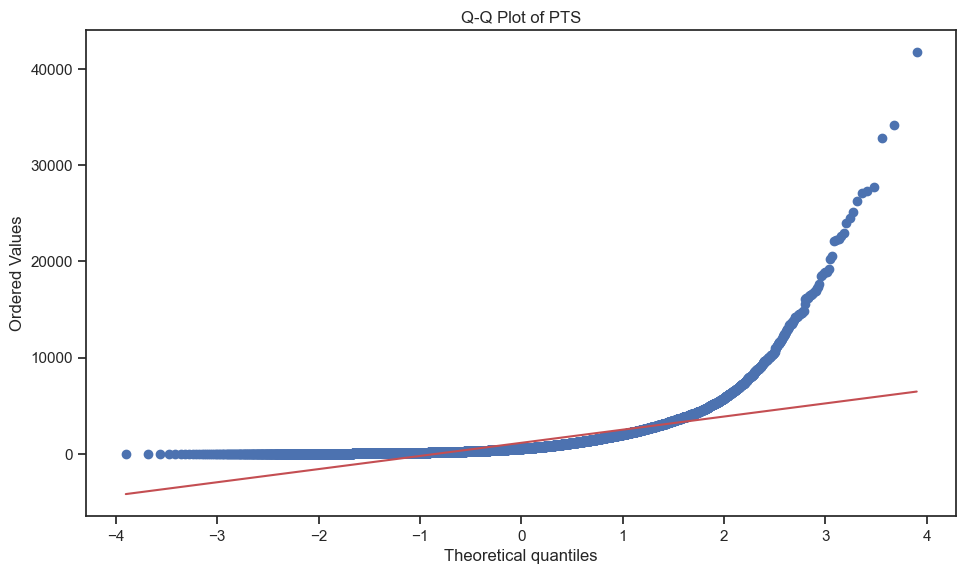

Shapiro-Wilk Test for PTS:
Statistic: 0.5332657098770142, p-value: 0.0
Kolmogorov-Smirnov Test for PTS:
Statistic: 0.26898688053437947, p-value: 0.0

--- birth_year ---


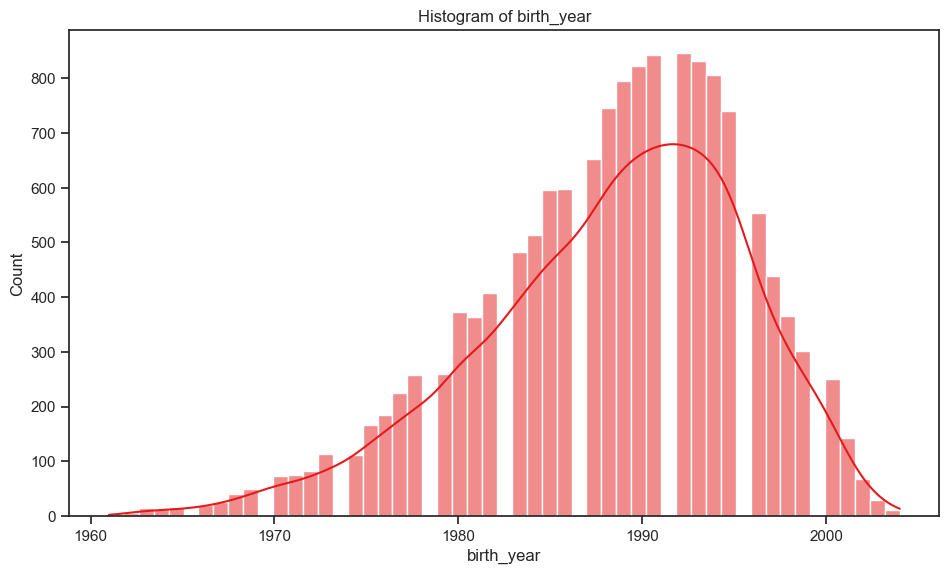

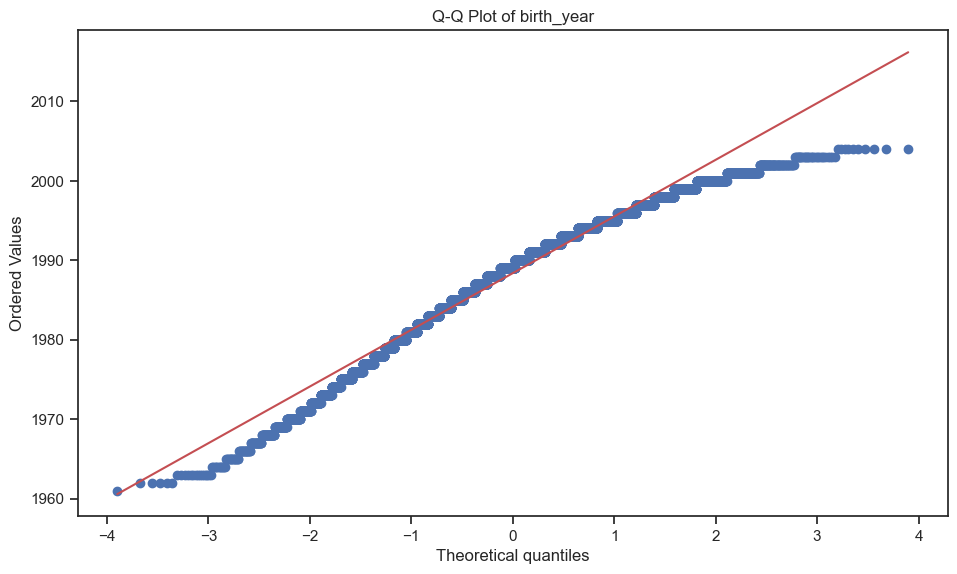

Shapiro-Wilk Test for birth_year:
Statistic: 0.9722191691398621, p-value: 1.401298464324817e-45
Kolmogorov-Smirnov Test for birth_year:
Statistic: 0.08273596083709311, p-value: 1.1469353274793431e-85

--- height_cm ---


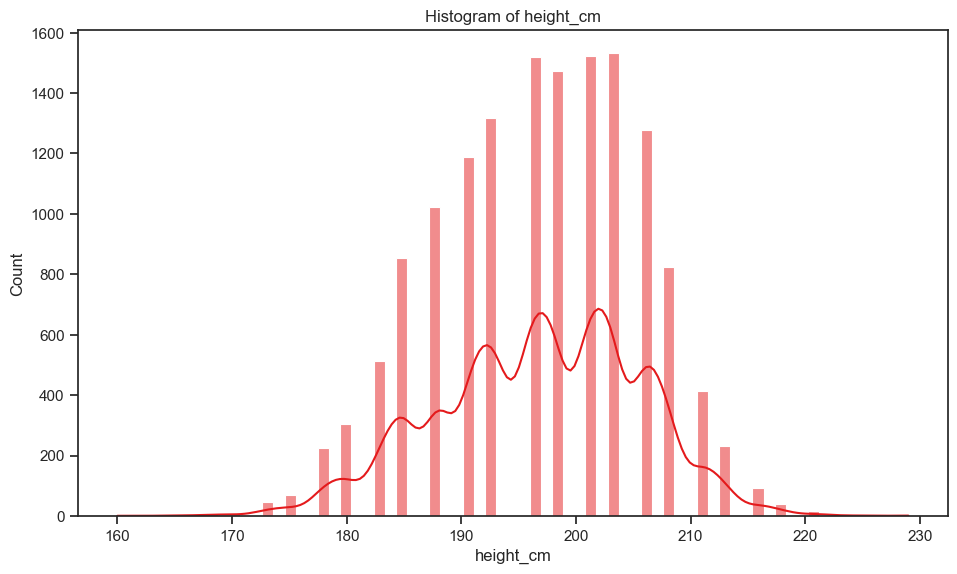

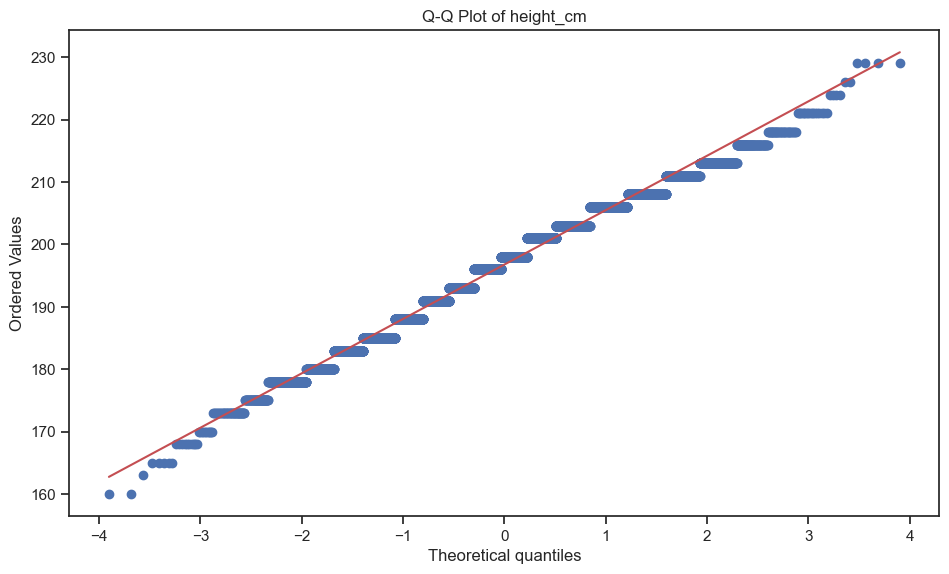

Shapiro-Wilk Test for height_cm:
Statistic: 0.9857479929924011, p-value: 1.6849801773653676e-35
Kolmogorov-Smirnov Test for height_cm:
Statistic: 0.09552092229718911, p-value: 1.0328825608769211e-115

--- weight_kg ---


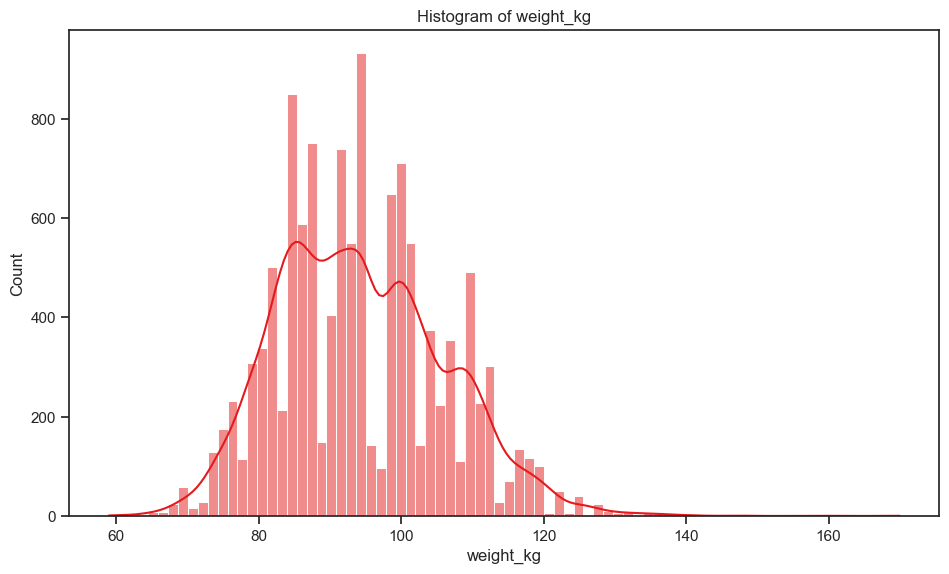

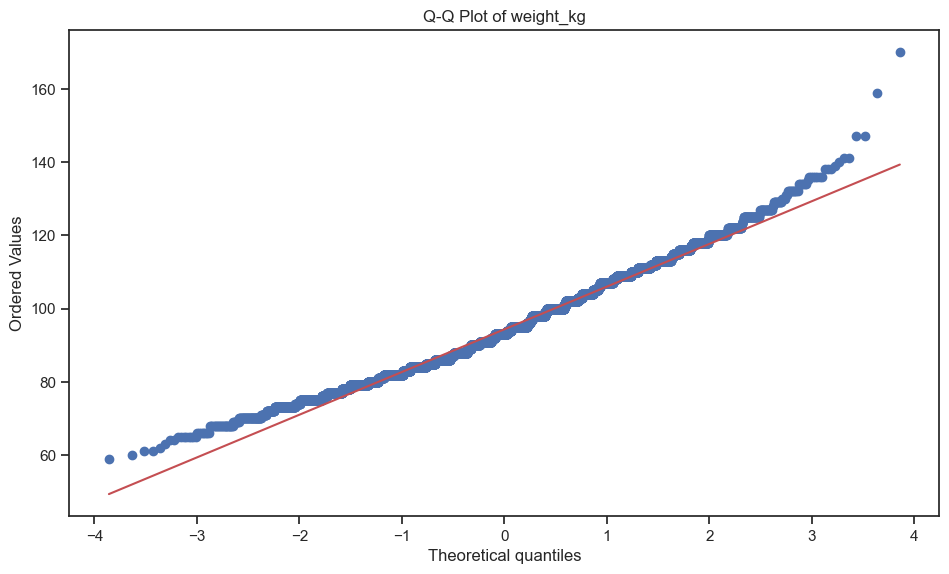

Shapiro-Wilk Test for weight_kg:
Statistic: 0.9865983128547668, p-value: 3.5915454892905253e-32
Kolmogorov-Smirnov Test for weight_kg:
Statistic: 0.06478587643705525, p-value: 1.0470926121098658e-44

--- Number_of_Leagues_Played ---


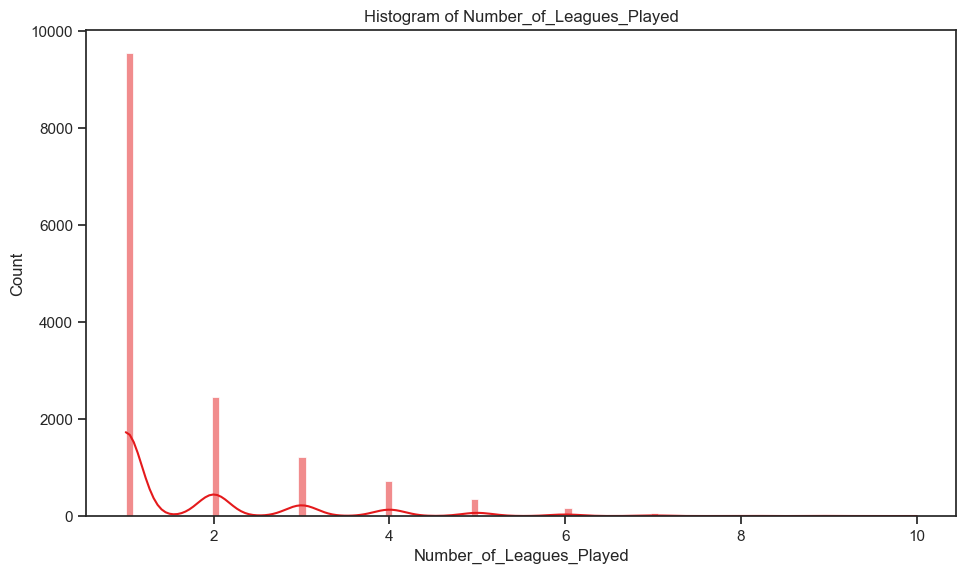

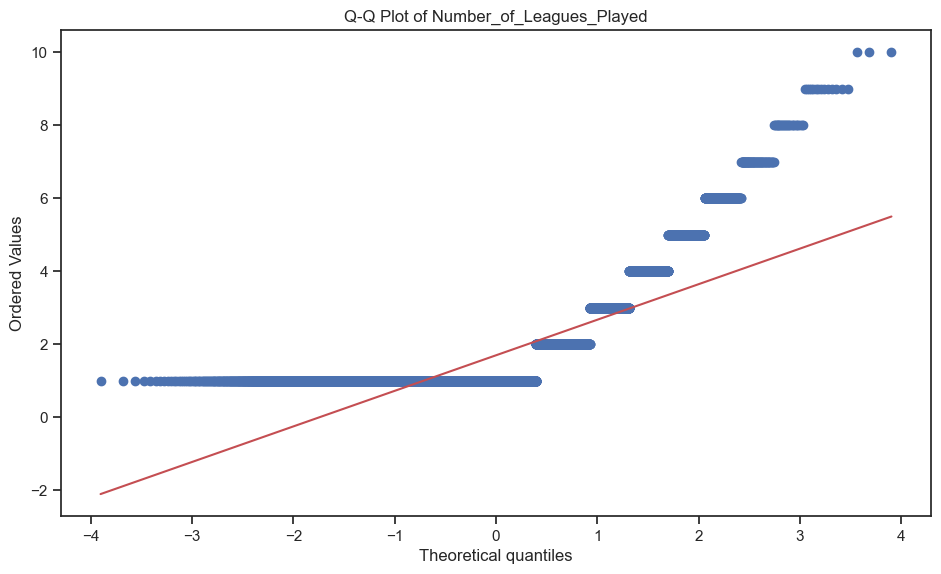

Shapiro-Wilk Test for Number_of_Leagues_Played:
Statistic: 0.6314470767974854, p-value: 0.0
Kolmogorov-Smirnov Test for Number_of_Leagues_Played:
Statistic: 0.3683879985015176, p-value: 0.0

--- NBA_Indication ---


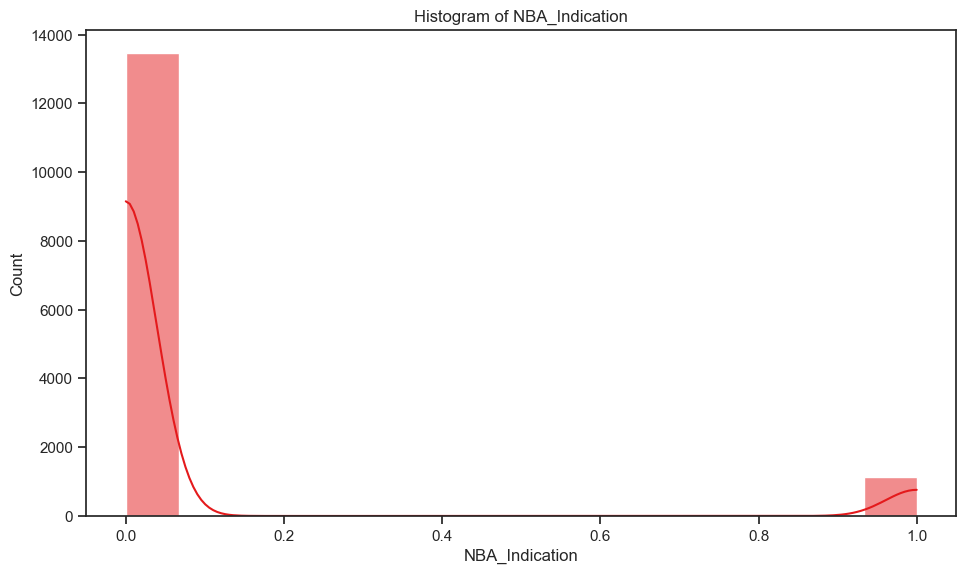

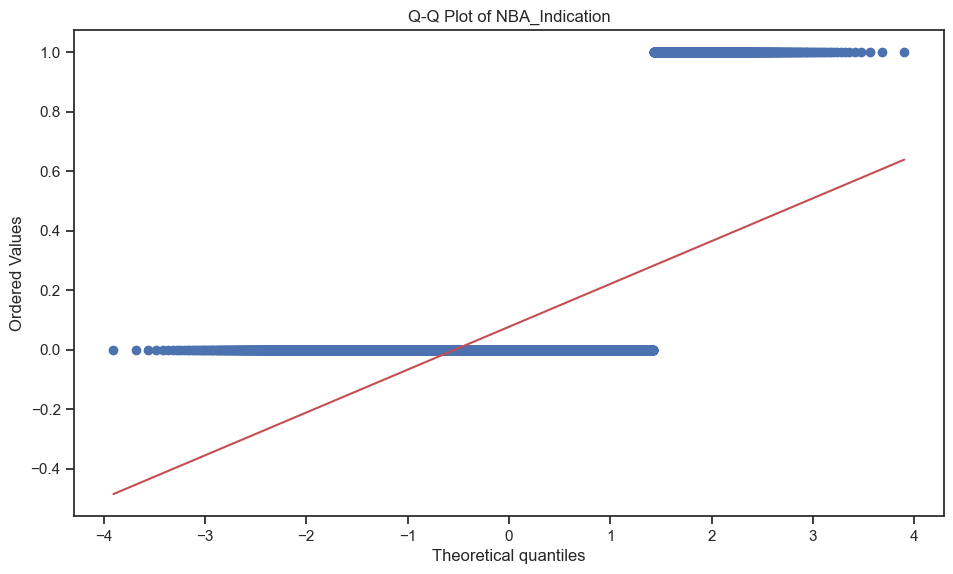

Shapiro-Wilk Test for NBA_Indication:
Statistic: 0.29284876585006714, p-value: 0.0
Kolmogorov-Smirnov Test for NBA_Indication:
Statistic: 0.536699085881682, p-value: 0.0

--- Number_of_Stages_Played ---


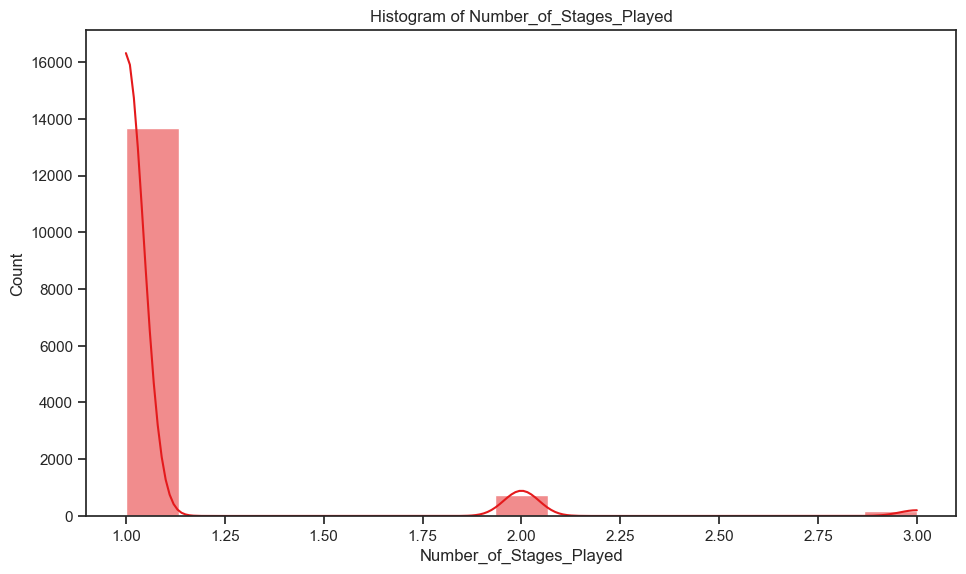

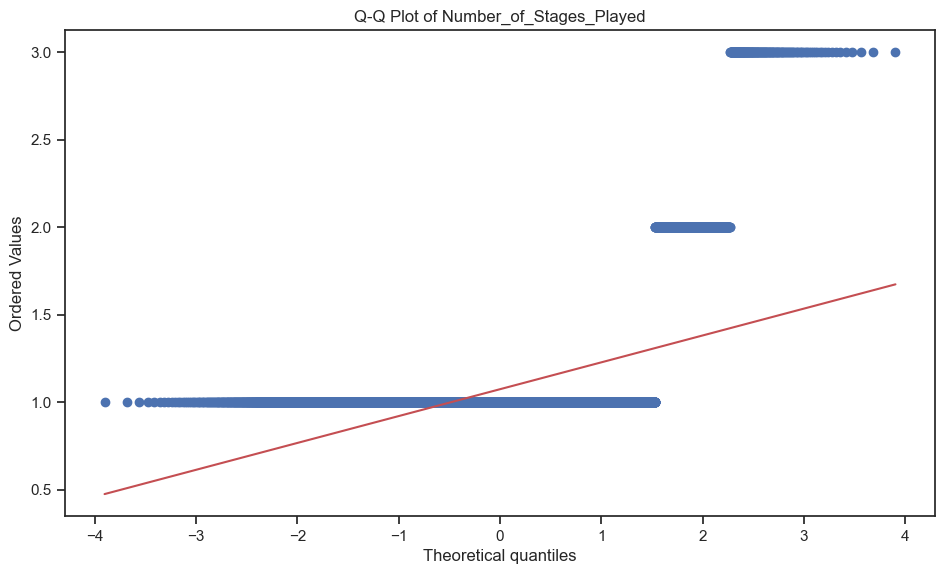

Shapiro-Wilk Test for Number_of_Stages_Played:
Statistic: 0.25649118423461914, p-value: 0.0
Kolmogorov-Smirnov Test for Number_of_Stages_Played:
Statistic: 0.534068802767961, p-value: 0.0

--- International indication ---


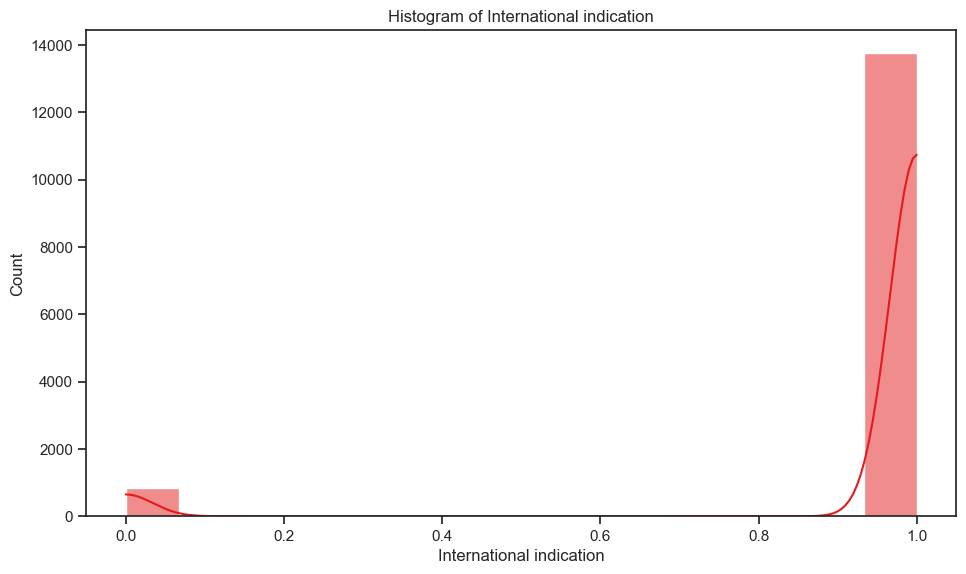

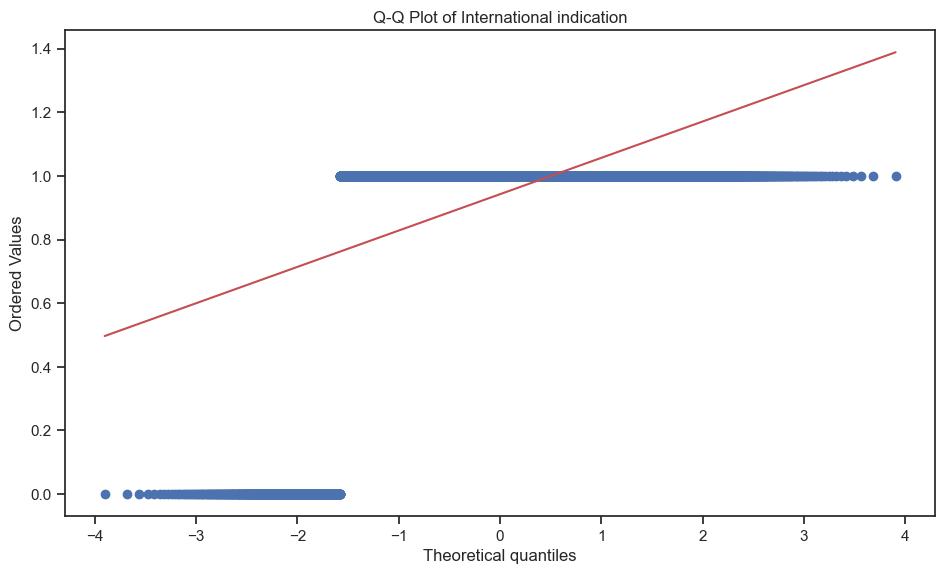

Shapiro-Wilk Test for International indication:
Statistic: 0.2433522343635559, p-value: 0.0
Kolmogorov-Smirnov Test for International indication:
Statistic: 0.5401092742310422, p-value: 0.0

--- Regular_Season indication ---


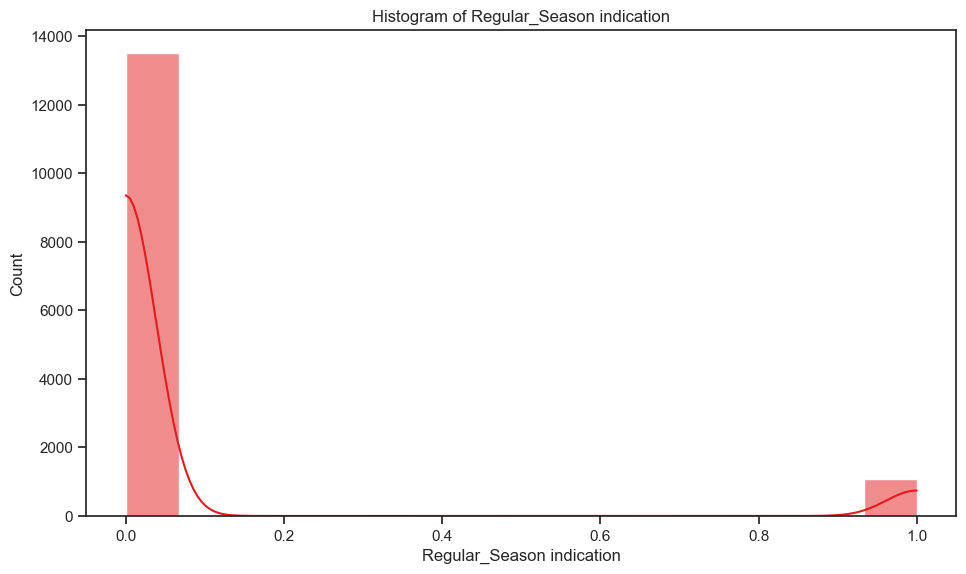

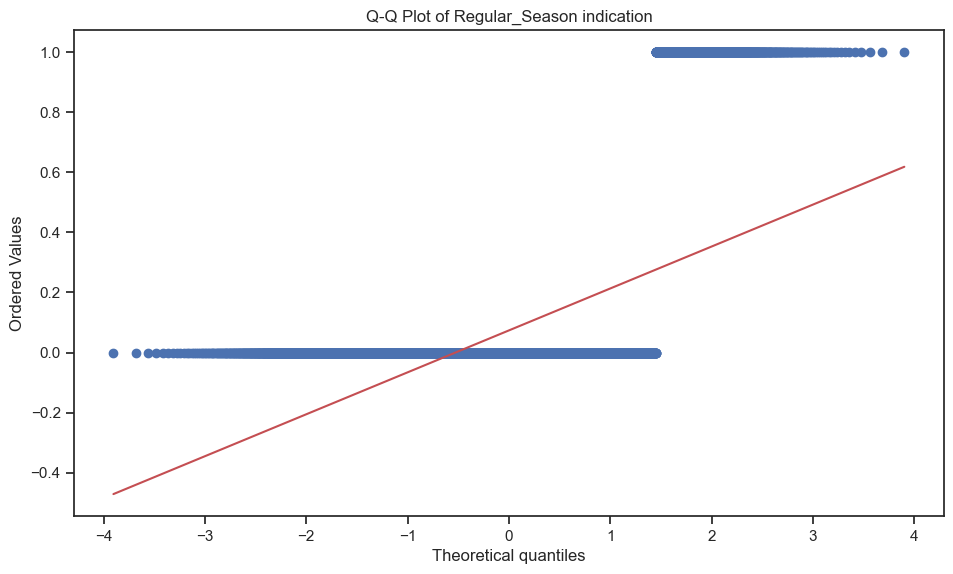

Shapiro-Wilk Test for Regular_Season indication:
Statistic: 0.2856593132019043, p-value: 0.0
Kolmogorov-Smirnov Test for Regular_Season indication:
Statistic: 0.5373615115392113, p-value: 0.0

--- Playoffs indication ---


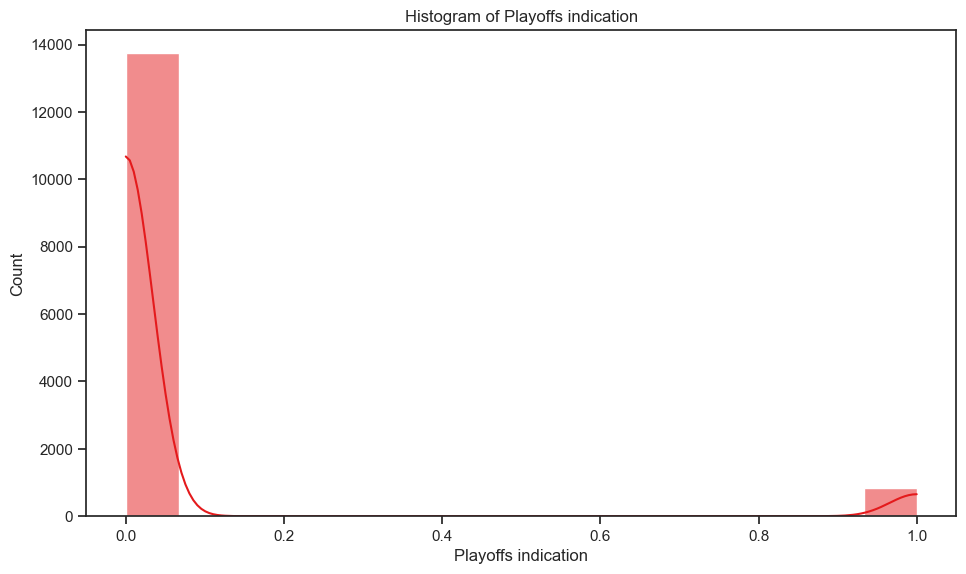

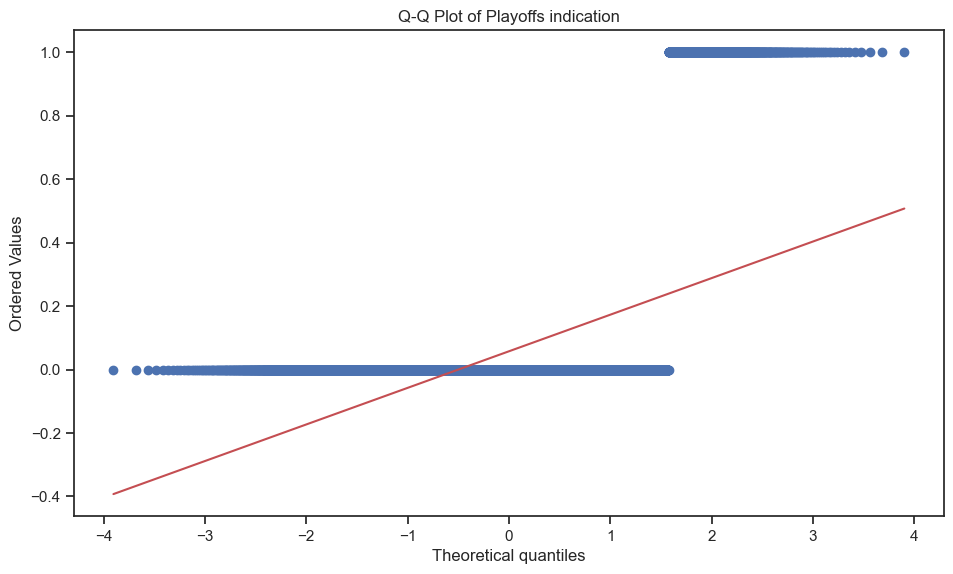

Shapiro-Wilk Test for Playoffs indication:
Statistic: 0.24499958753585815, p-value: 0.0
Kolmogorov-Smirnov Test for Playoffs indication:
Statistic: 0.5400374523324809, p-value: 0.0

--- Avg_REB ---


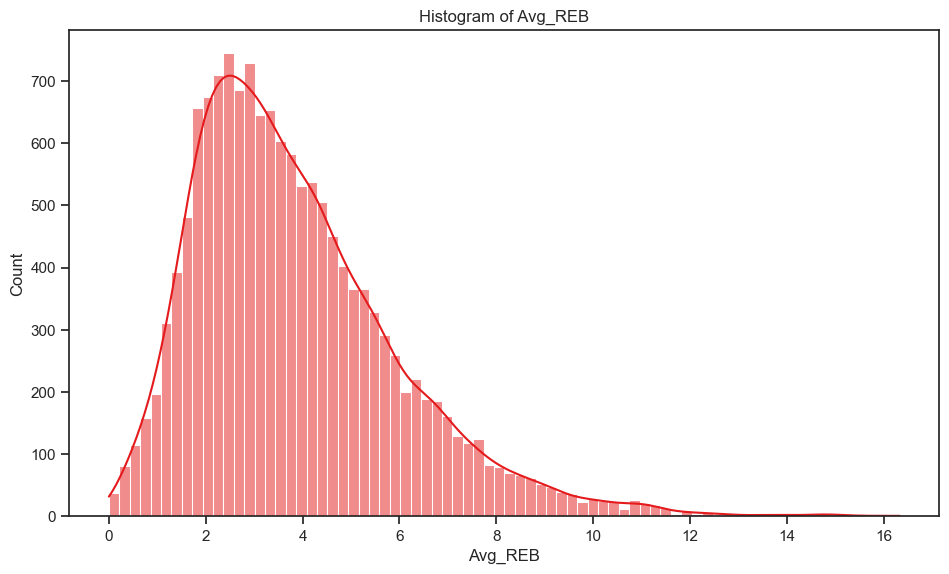

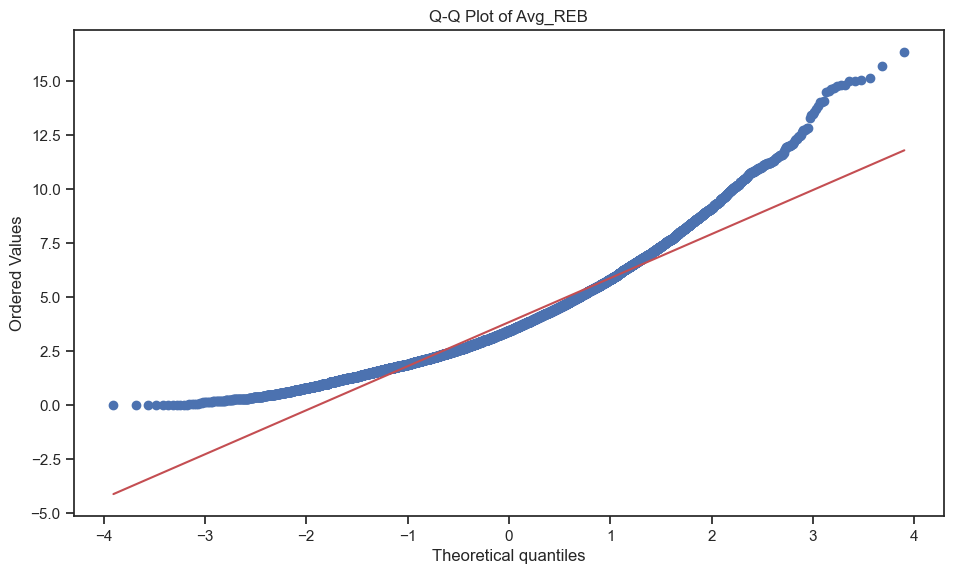

Shapiro-Wilk Test for Avg_REB:
Statistic: 0.9363319873809814, p-value: 0.0
Kolmogorov-Smirnov Test for Avg_REB:
Statistic: 0.07826735917912825, p-value: 3.853602185452293e-78

--- Avg_AST ---


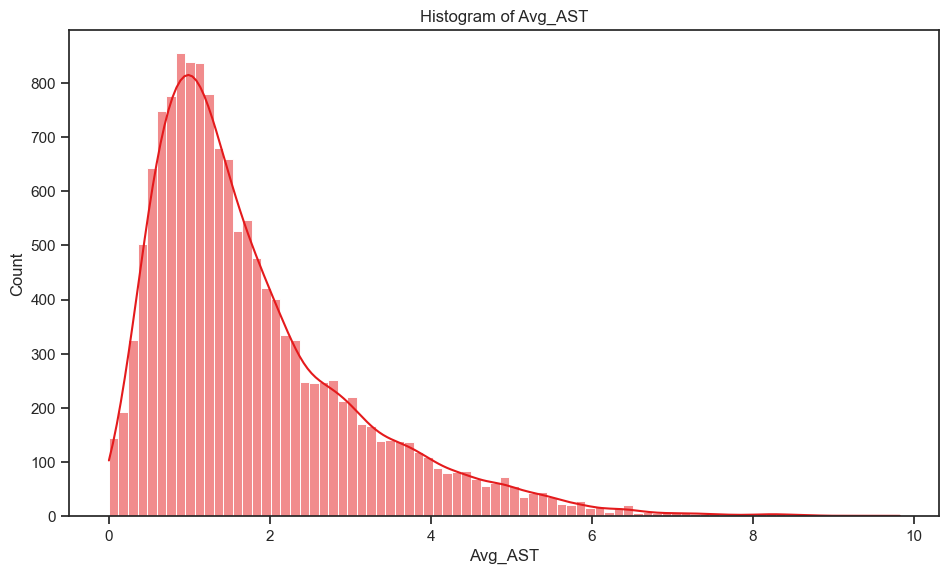

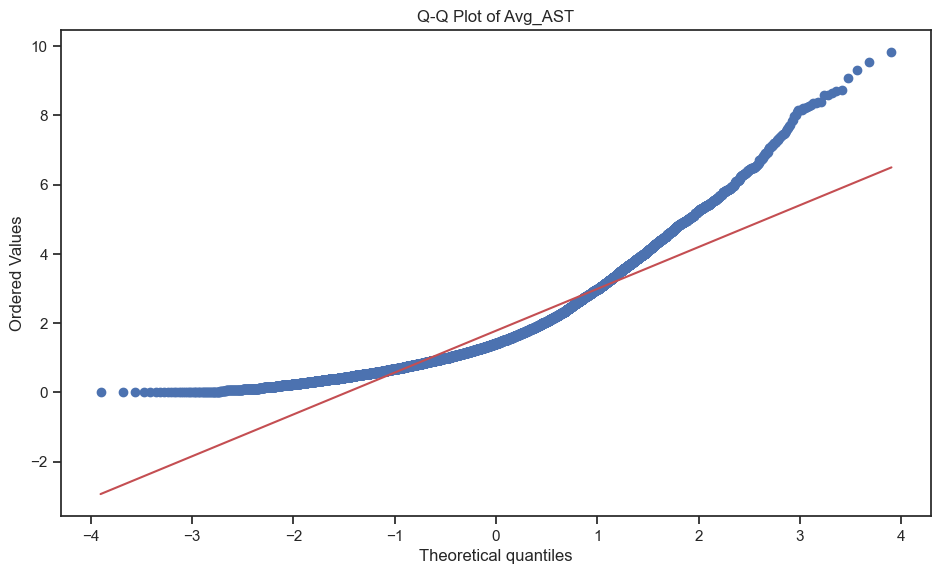

Shapiro-Wilk Test for Avg_AST:
Statistic: 0.878210186958313, p-value: 0.0
Kolmogorov-Smirnov Test for Avg_AST:
Statistic: 0.12452912734414223, p-value: 1.4822031373774296e-197

--- Avg_PTS ---


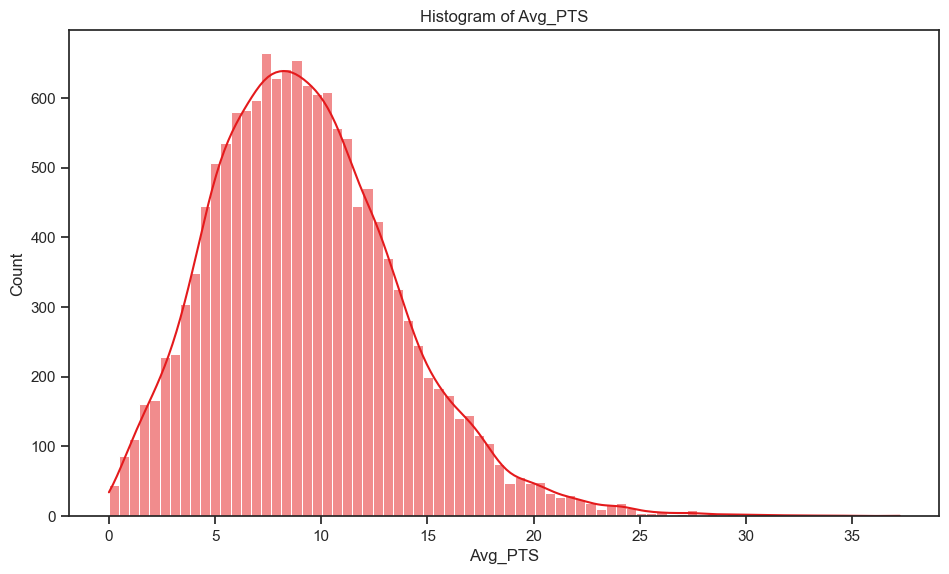

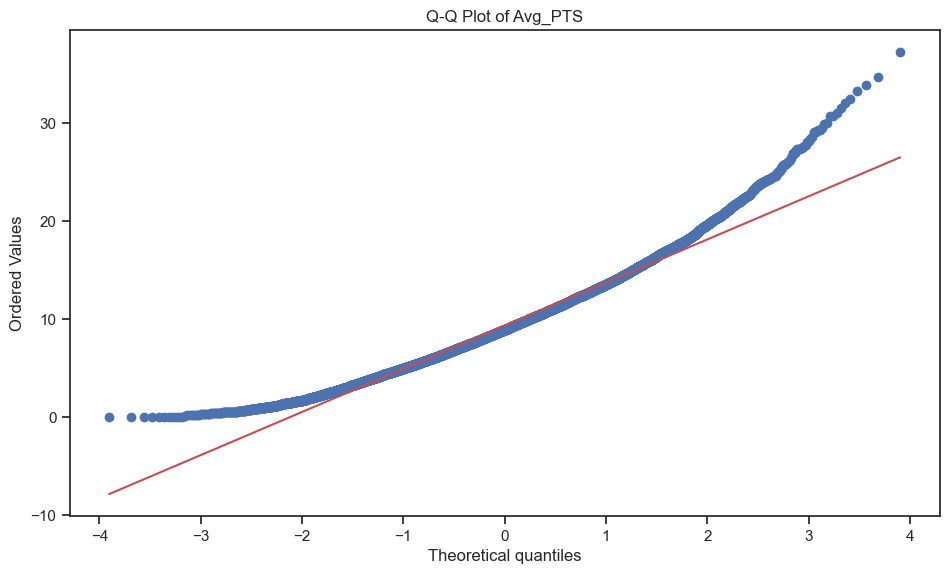

Shapiro-Wilk Test for Avg_PTS:
Statistic: 0.9743725657463074, p-value: 1.1210387714598537e-44
Kolmogorov-Smirnov Test for Avg_PTS:
Statistic: 0.0380025868122727, p-value: 9.830426224413515e-19

--- Avg_MIN ---


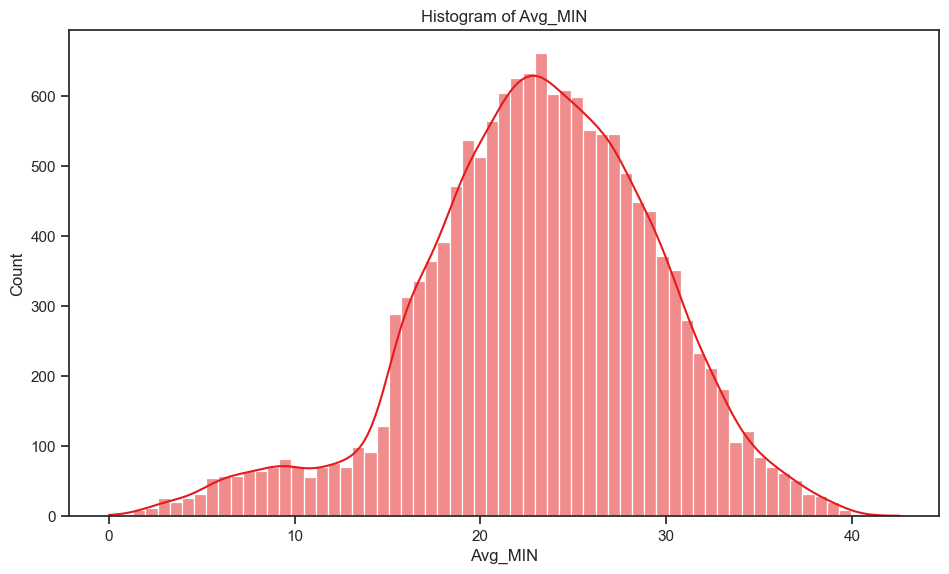

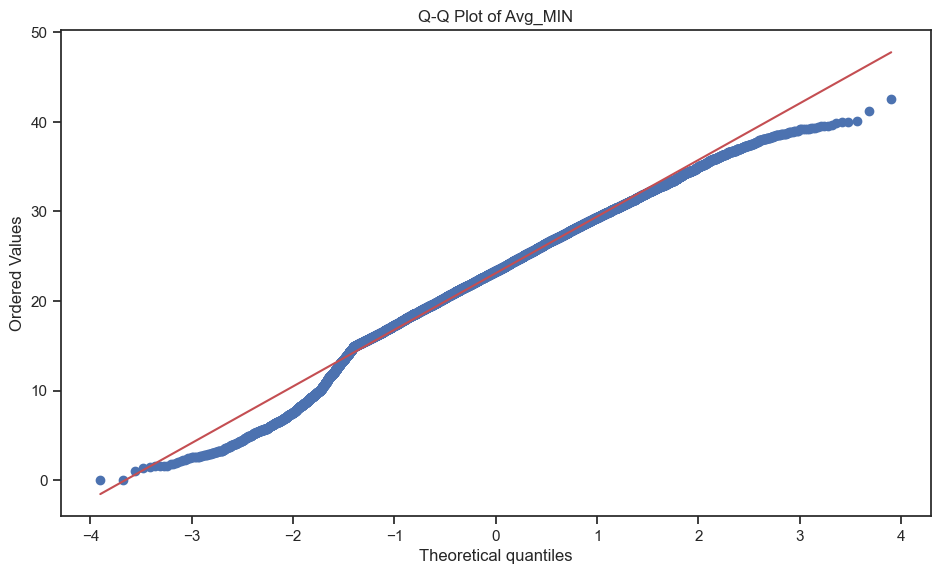

Shapiro-Wilk Test for Avg_MIN:
Statistic: 0.9874107837677002, p-value: 8.978739928977492e-34
Kolmogorov-Smirnov Test for Avg_MIN:
Statistic: 0.026301341800711753, p-value: 3.3925252613593275e-09

--- Avg_FGM ---


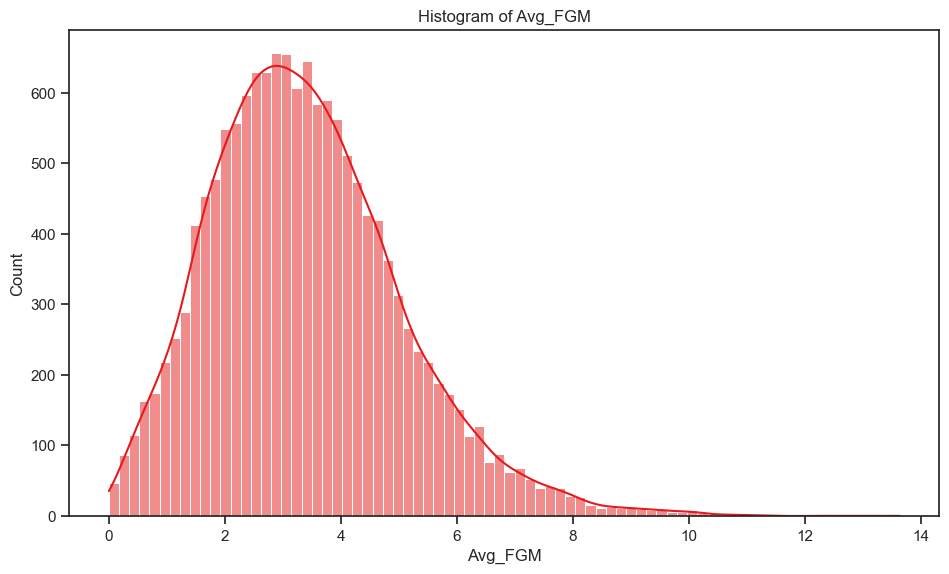

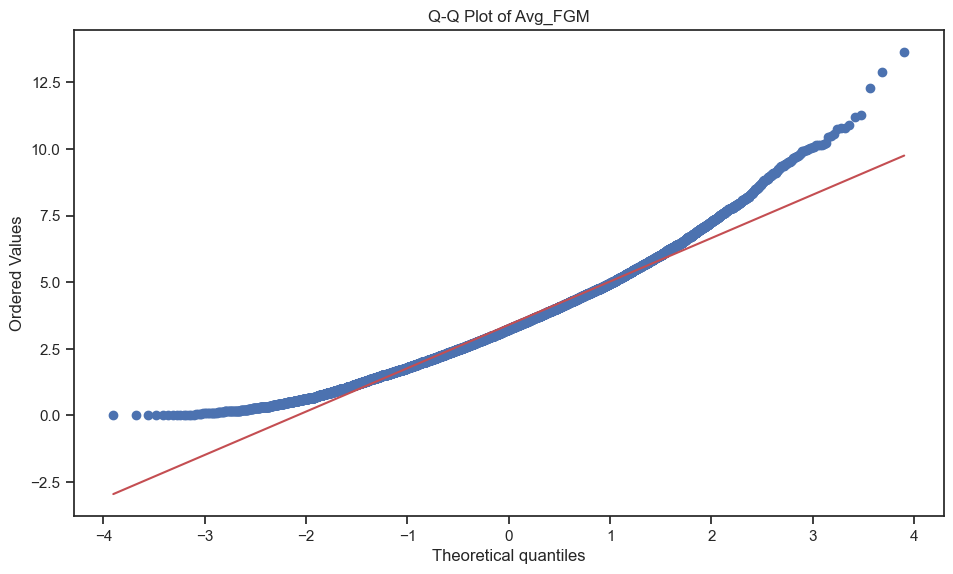

Shapiro-Wilk Test for Avg_FGM:
Statistic: 0.9732746481895447, p-value: 2.802596928649634e-45
Kolmogorov-Smirnov Test for Avg_FGM:
Statistic: 0.042658187585078666, p-value: 1.7042665146725547e-23

--- Avg_FGA ---


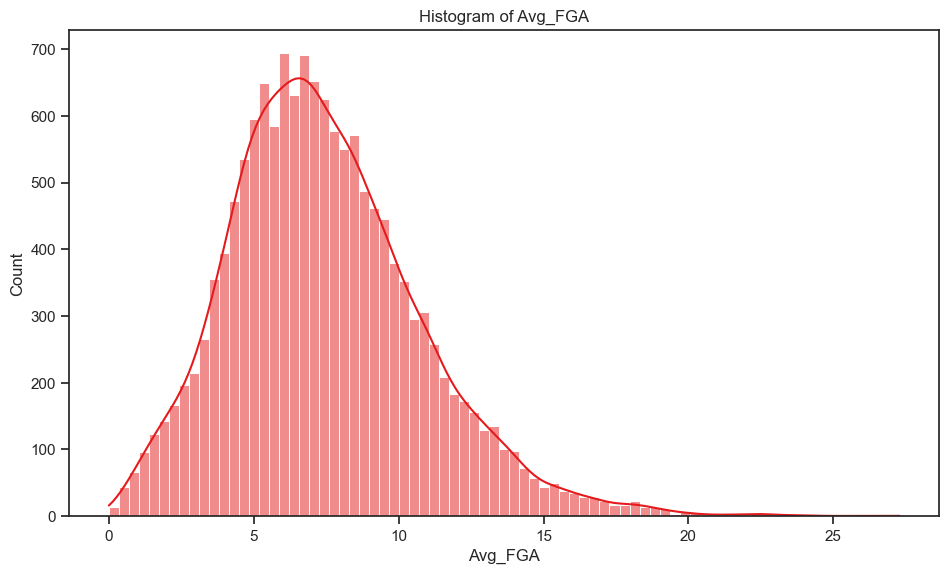

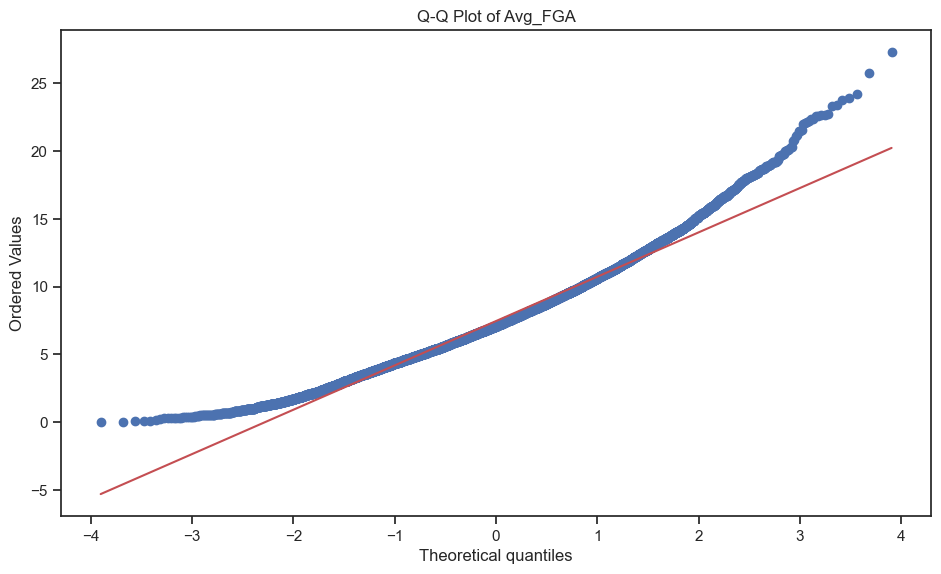

Shapiro-Wilk Test for Avg_FGA:
Statistic: 0.9748380780220032, p-value: 2.1019476964872256e-44
Kolmogorov-Smirnov Test for Avg_FGA:
Statistic: 0.04610375163148095, p-value: 2.2571600609527704e-27

--- Avg_3PM ---


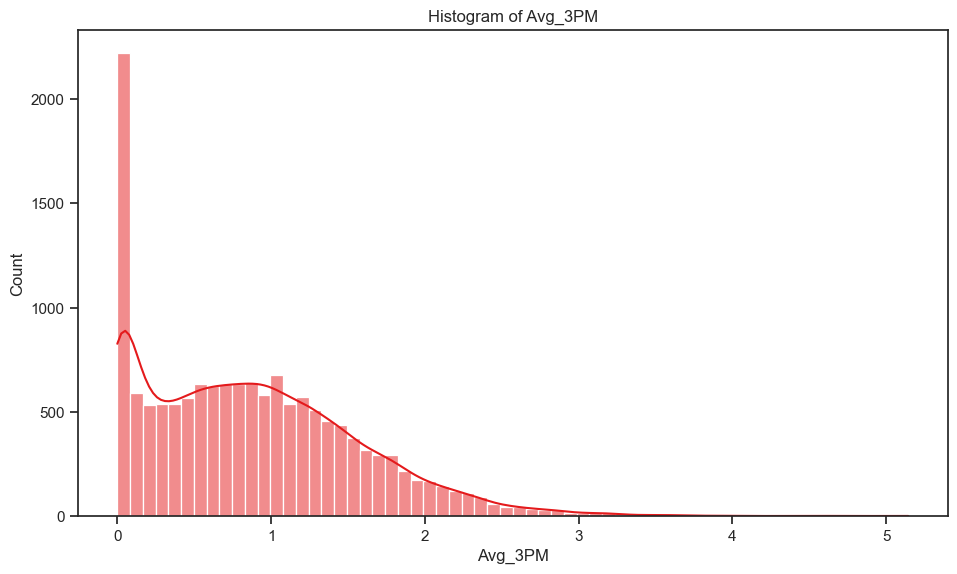

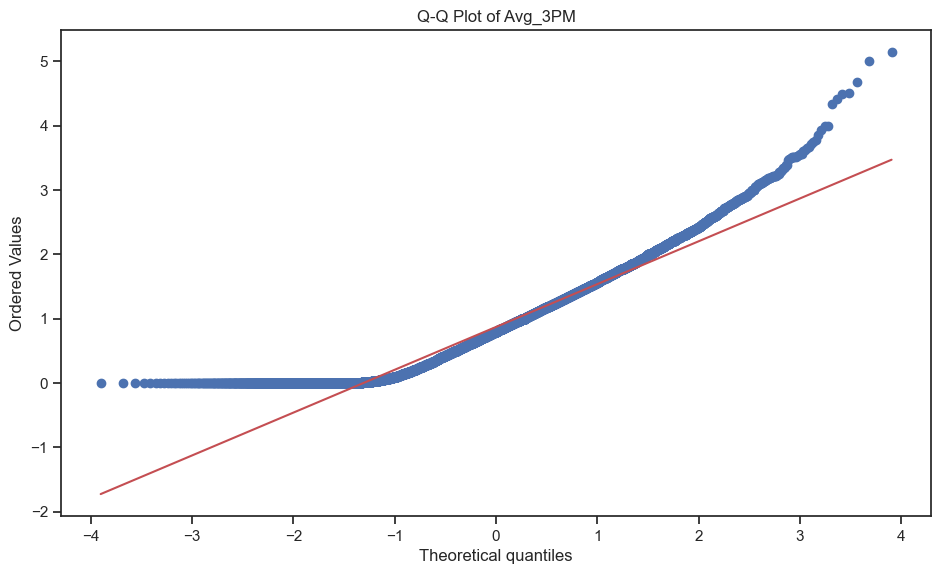

Shapiro-Wilk Test for Avg_3PM:
Statistic: 0.941622793674469, p-value: 0.0
Kolmogorov-Smirnov Test for Avg_3PM:
Statistic: 0.10205850759920487, p-value: 1.0977582310916542e-132

--- Avg_3PA ---


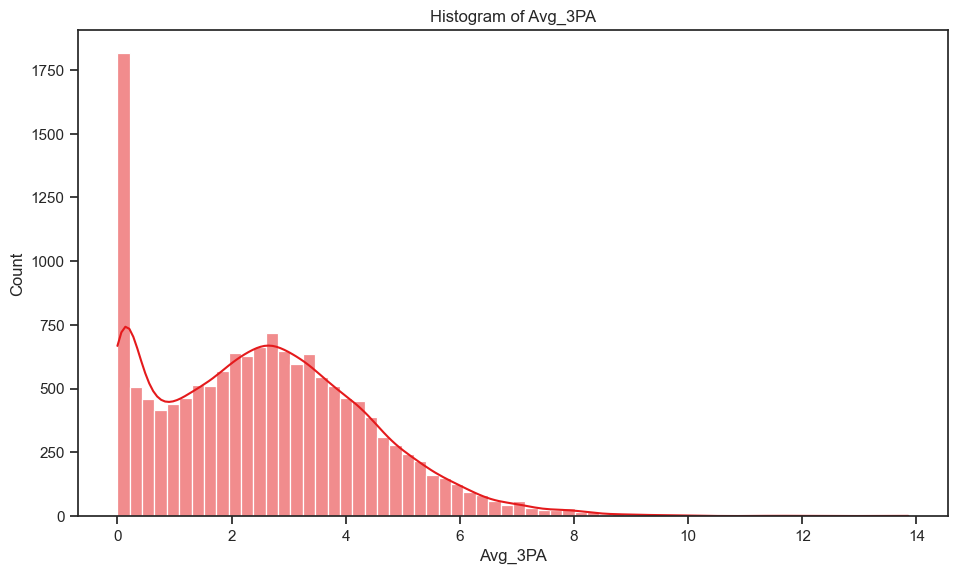

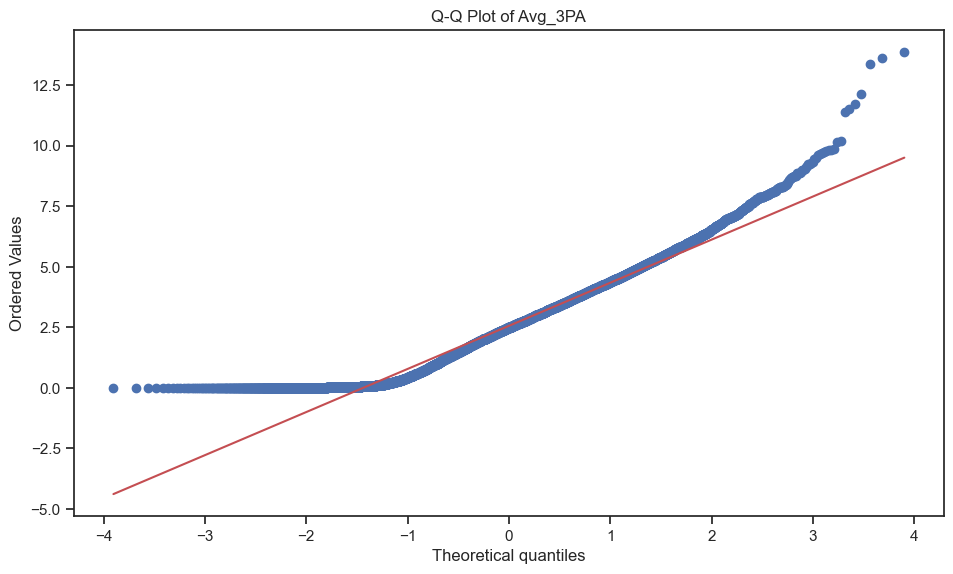

Shapiro-Wilk Test for Avg_3PA:
Statistic: 0.9598658680915833, p-value: 0.0
Kolmogorov-Smirnov Test for Avg_3PA:
Statistic: 0.07926767185731087, p-value: 3.838391823682357e-80

--- Avg_FTM ---


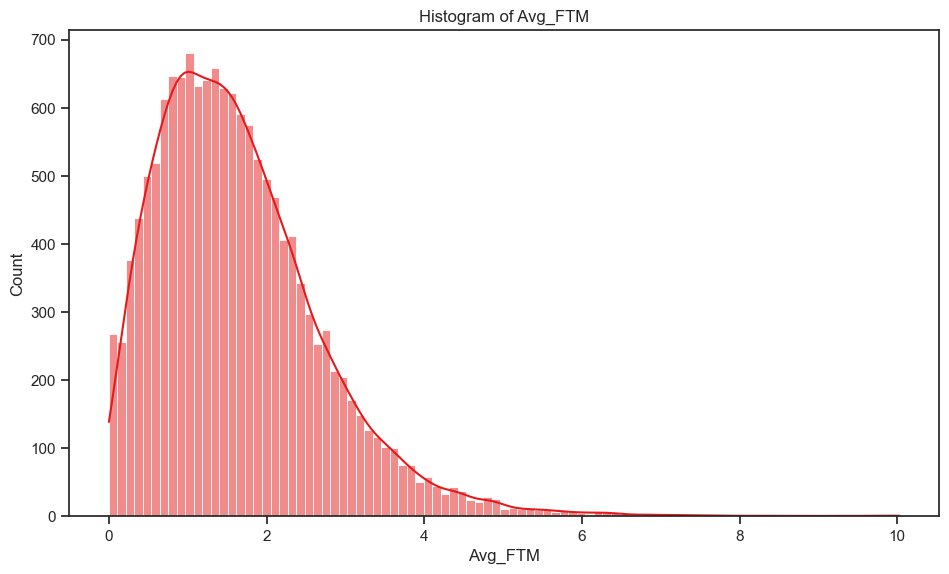

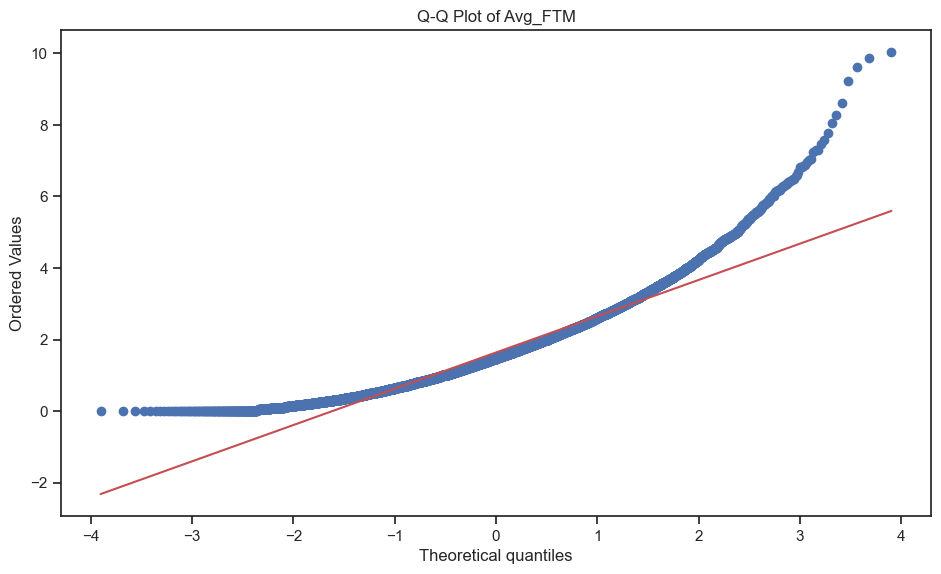

Shapiro-Wilk Test for Avg_FTM:
Statistic: 0.9305165410041809, p-value: 0.0
Kolmogorov-Smirnov Test for Avg_FTM:
Statistic: 0.06726335839832842, p-value: 8.3210700080984e-58

--- Avg_FTA ---


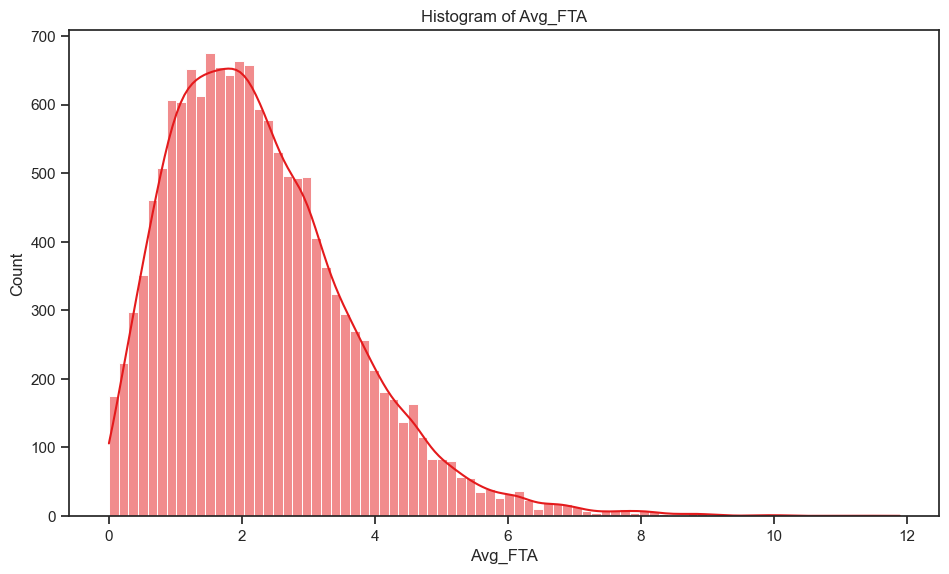

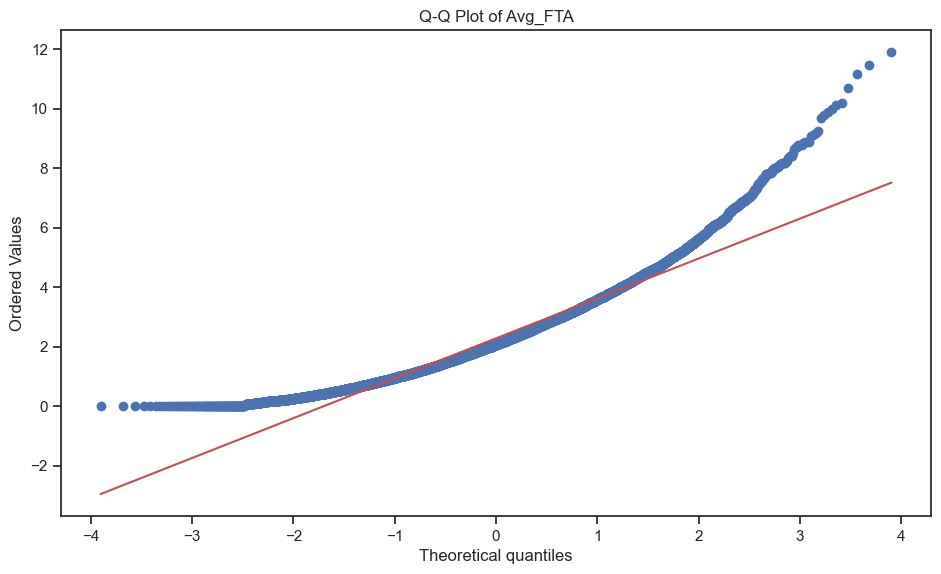

Shapiro-Wilk Test for Avg_FTA:
Statistic: 0.9420432448387146, p-value: 0.0
Kolmogorov-Smirnov Test for Avg_FTA:
Statistic: 0.06412871129889103, p-value: 1.4050044697396905e-52

--- Avg_TOV ---


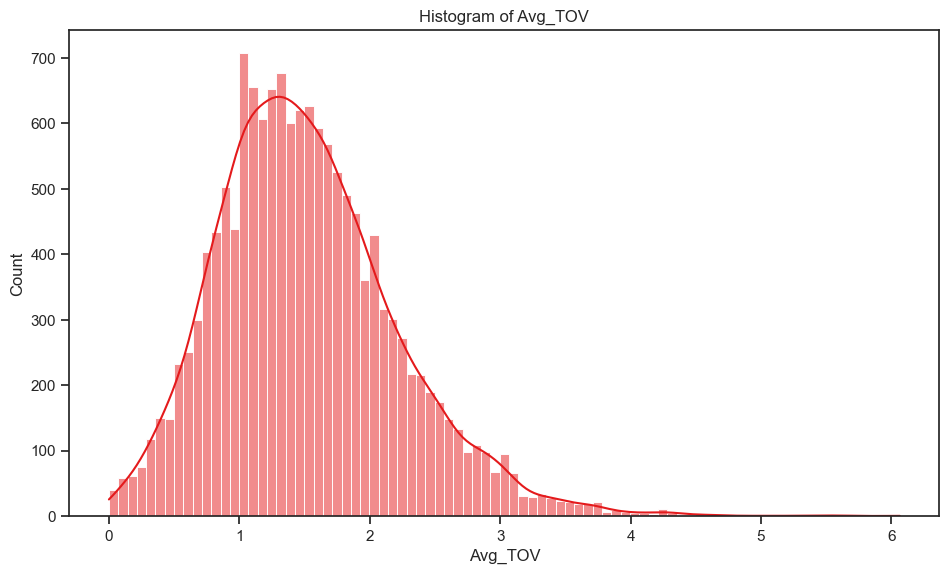

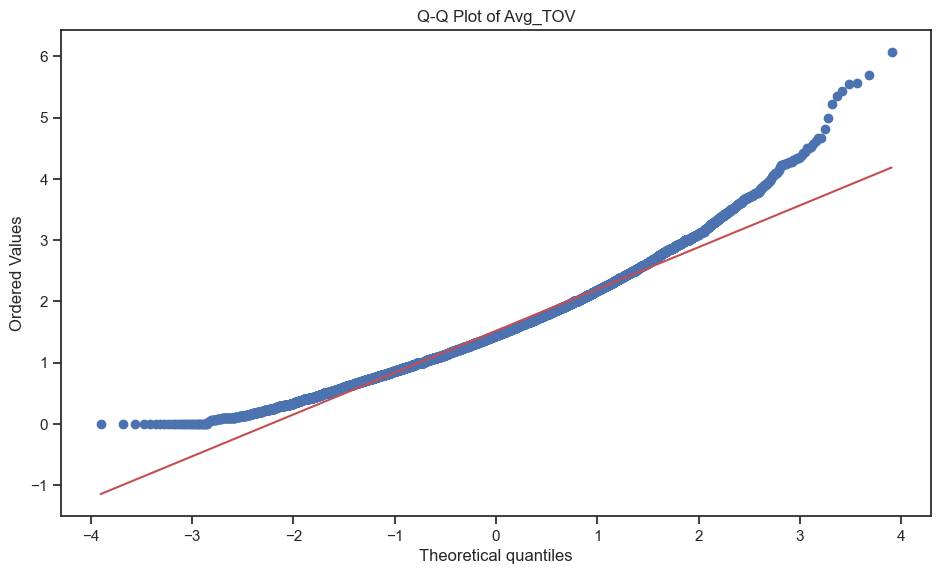

Shapiro-Wilk Test for Avg_TOV:
Statistic: 0.9726517200469971, p-value: 1.401298464324817e-45
Kolmogorov-Smirnov Test for Avg_TOV:
Statistic: 0.04848782259333401, p-value: 3.1172589274176096e-30

--- Avg_PF ---


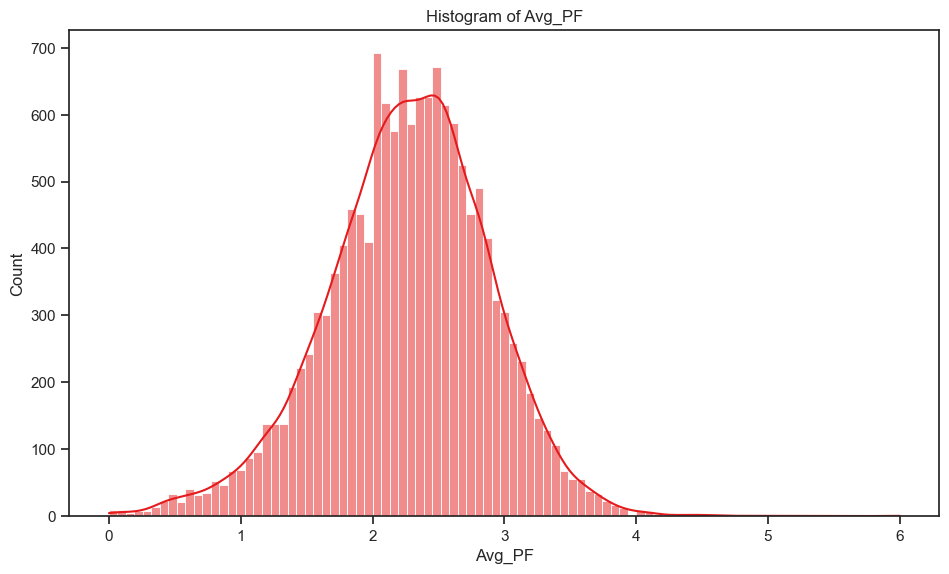

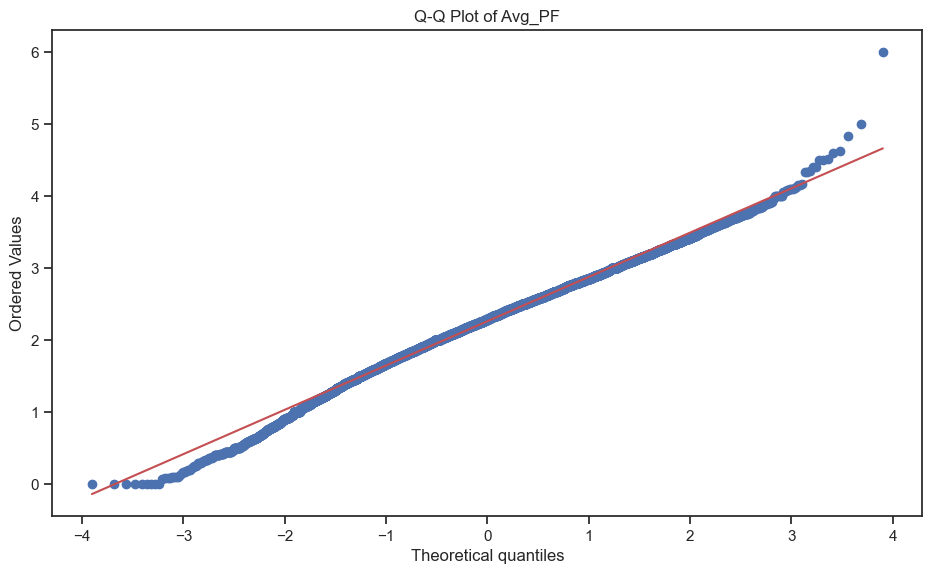

Shapiro-Wilk Test for Avg_PF:
Statistic: 0.9941438436508179, p-value: 8.645080906384566e-24
Kolmogorov-Smirnov Test for Avg_PF:
Statistic: 0.03075750536345201, p-value: 2.03079410948883e-12

--- Avg_ORB ---


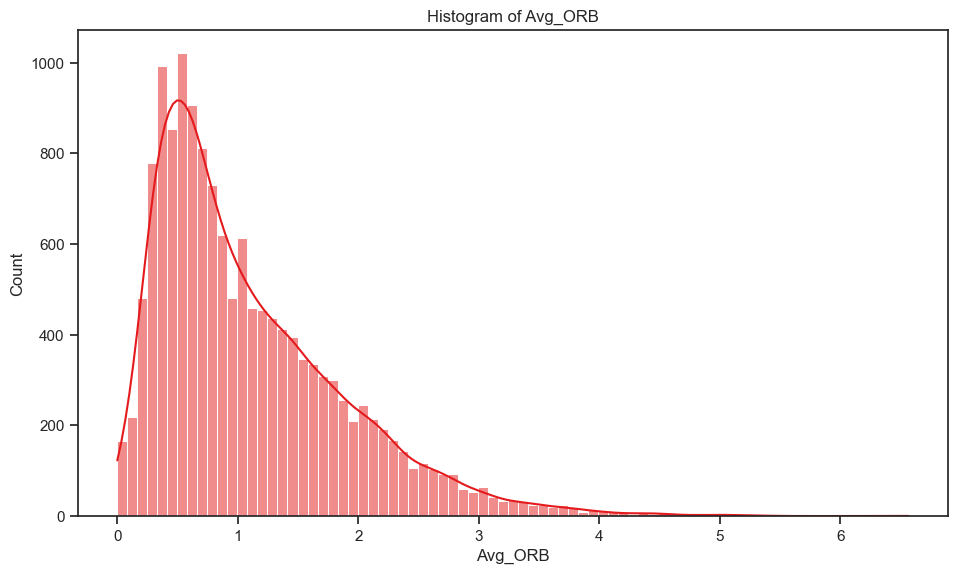

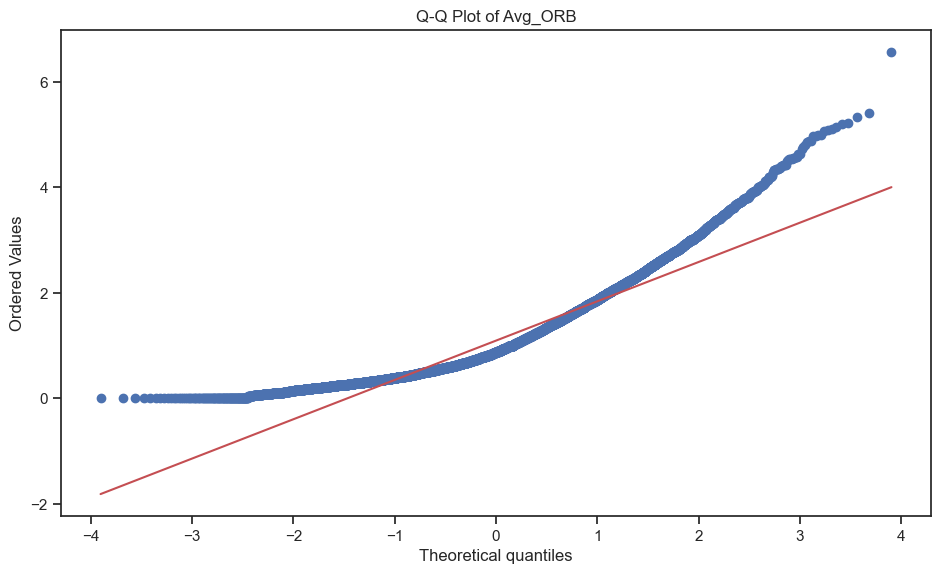

Shapiro-Wilk Test for Avg_ORB:
Statistic: 0.8982337713241577, p-value: 0.0
Kolmogorov-Smirnov Test for Avg_ORB:
Statistic: 0.1143615675071224, p-value: 1.365960239826281e-166

--- Avg_DRB ---


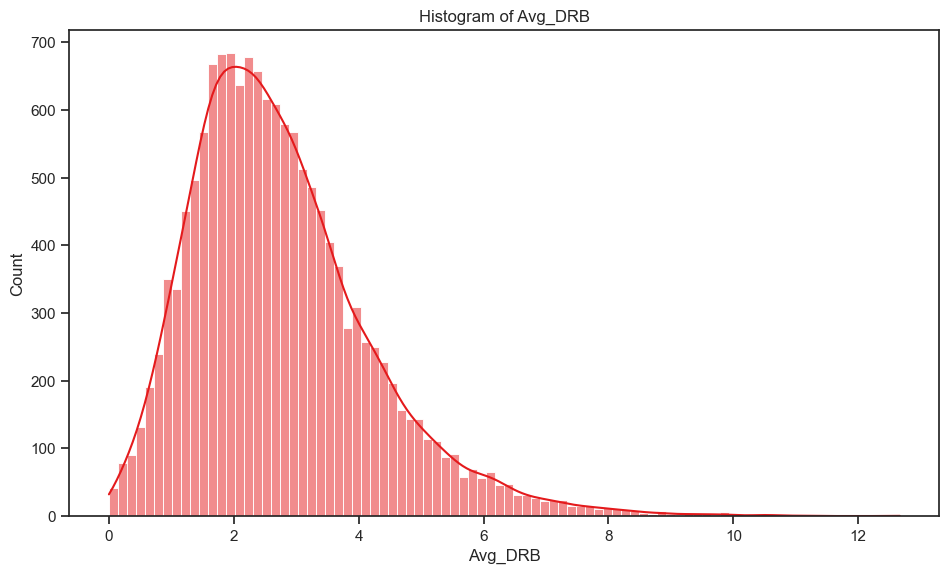

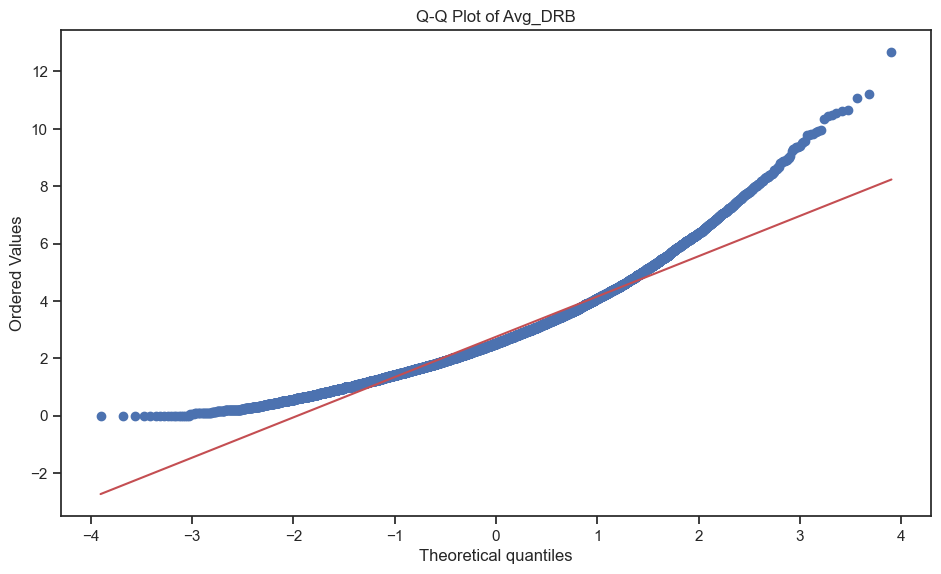

Shapiro-Wilk Test for Avg_DRB:
Statistic: 0.9426360130310059, p-value: 0.0
Kolmogorov-Smirnov Test for Avg_DRB:
Statistic: 0.06929369637819327, p-value: 2.5157416017283524e-61

--- Avg_STL ---


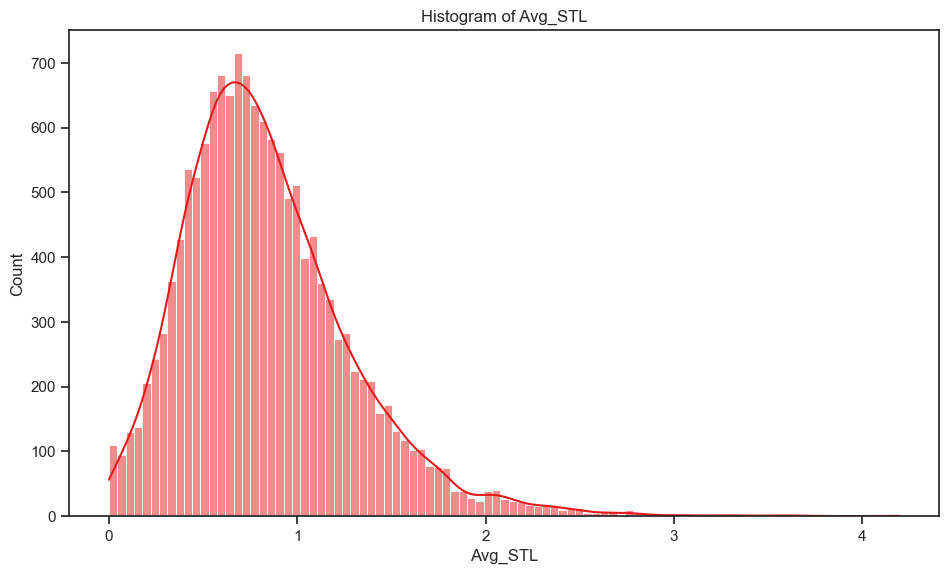

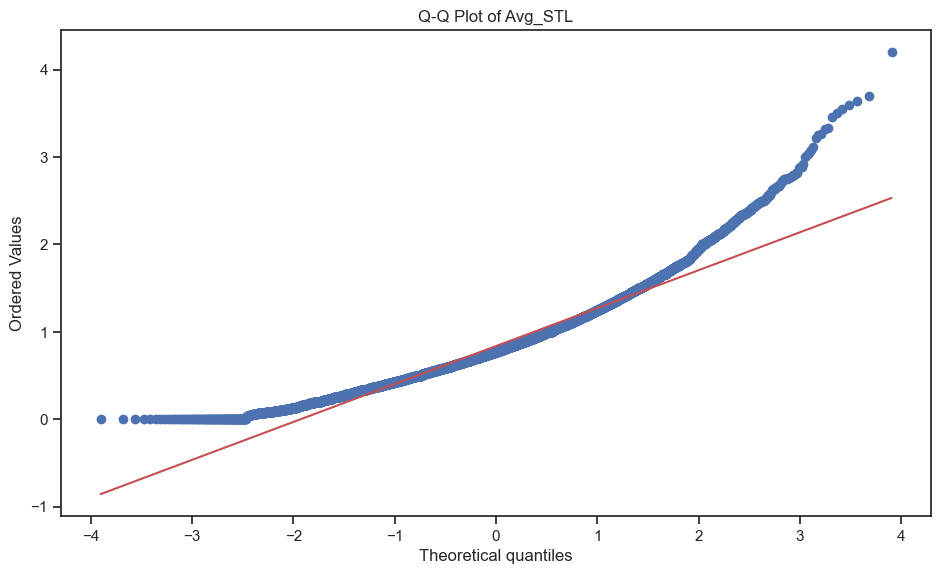

Shapiro-Wilk Test for Avg_STL:
Statistic: 0.9474720358848572, p-value: 0.0
Kolmogorov-Smirnov Test for Avg_STL:
Statistic: 0.06685410684629667, p-value: 4.1388308499173876e-57

--- Avg_BLK ---


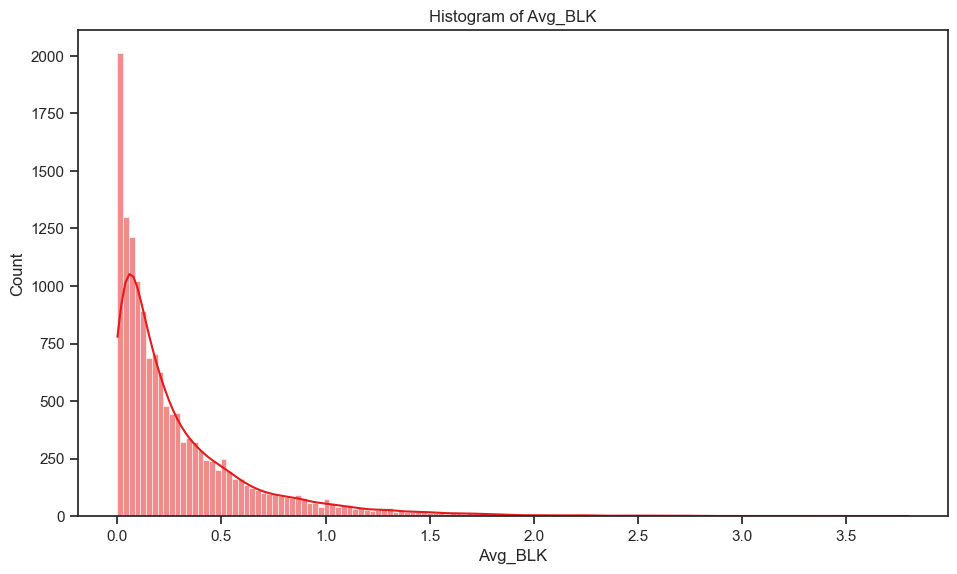

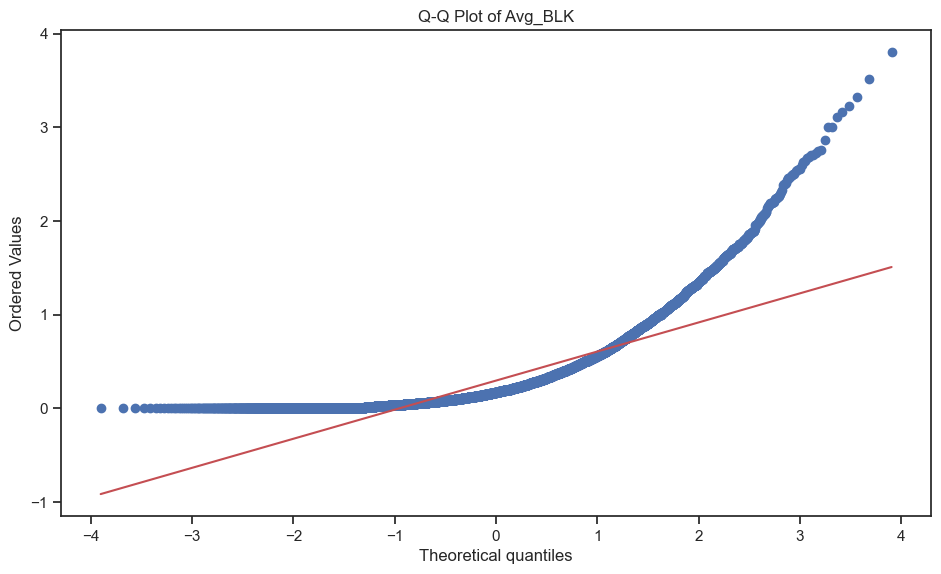

Shapiro-Wilk Test for Avg_BLK:
Statistic: 0.7446090579032898, p-value: 0.0
Kolmogorov-Smirnov Test for Avg_BLK:
Statistic: 0.20526035224208672, p-value: 0.0
   Z_score_GP  Z_score_MIN  Z_score_FGM  Z_score_FGA  Z_score_3PM  \
0  -0.650260   -0.637346    -0.532399    -0.555696    -0.575525     
1  -0.438566   -0.357994    -0.253585    -0.239047    -0.324168     
2   0.528168    0.247728    -0.095102    -0.072498    -0.570061     
3  -0.311550   -0.209015    -0.036404    -0.025207     0.380724     
4  -0.099856    0.014818     0.072187    -0.015611    -0.575525     

   Z_score_3PA  Z_score_FTM  Z_score_FTA  Z_score_TOV  Z_score_PF  \
0  -0.608613    -0.491261    -0.509971    -0.599390    -0.667784    
1  -0.321327    -0.291417    -0.307366    -0.314986    -0.478134    
2  -0.588238    -0.122717    -0.104761    -0.264339     0.090817    
3   0.275656     0.001861    -0.064641    -0.096813    -0.285521    
4  -0.596388    -0.083787     0.170060     0.027858     0.253797    

   Z_score_OR

In [215]:

# בחירת עמודות מספריות בלבד
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

# חישוב Z-score לכל עמודה מספרית
for col in numeric_columns:
    mean = df[col].mean()
    std = df[col].std()
    df[f'Z_score_{col}'] = (df[col] - mean) / std

# בדיקת נורמליות עבור כל עמודה מספרית והצגת היסטוגרמות וגרפים Q-Q
for column in numeric_columns:
    print(f'\n--- {column} ---')
    
    # הצגת היסטוגרמה
    plt.figure(figsize=(10, 6))
    sb.histplot(df[column], kde=True)
    plt.title(f'Histogram of {column}')
    plt.show()
    
    # הצגת גרף Q-Q
    plt.figure(figsize=(10, 6))
    stats.probplot(df[column].dropna(), dist="norm", plot=plt)
    plt.title(f'Q-Q Plot of {column}')
    plt.show()
    
    # בדיקת שפרו-וילק
    shapiro_test = stats.shapiro(df[column].dropna())
    print(f'Shapiro-Wilk Test for {column}:')
    print(f'Statistic: {shapiro_test.statistic}, p-value: {shapiro_test.pvalue}')
    
    # בדיקת קולמוגורוב-סמירנוב
    ks_test = stats.kstest(df[column].dropna(), 'norm', args=(df[column].mean(), df[column].std()))
    print(f'Kolmogorov-Smirnov Test for {column}:')
    print(f'Statistic: {ks_test.statistic}, p-value: {ks_test.pvalue}')

# הצגת התוצאות של Z-score
print(df[[f'Z_score_{col}' for col in numeric_columns]].head())

In [216]:
# חישוב Z-score לכל עמודה מספרית
for col in numeric_columns:
    mean = df[col].mean()
    std = df[col].std()
    df[f'Z_score_{col}'] = (df[col] - mean) / std

# סידור העמודות כך שהעמודות של Z-score יהיו ראשונות
z_score_columns = [f'Z_score_{col}' for col in numeric_columns]
other_columns = [col for col in df.columns if col not in z_score_columns]
new_column_order = z_score_columns + other_columns
df = df[new_column_order]

# הצגת הטבלה
print(df.head())

# שמירת הקובץ החדש עם סדר העמודות המתוקן
df.to_csv('NBA_prepared_reordered.csv', index=False)

print("The columns have been reordered successfully. The new file is saved as 'NBA_prepared_reordered.csv'.")

   Z_score_GP  Z_score_MIN  Z_score_FGM  Z_score_FGA  Z_score_3PM  \
0  -0.650260   -0.637346    -0.532399    -0.555696    -0.575525     
1  -0.438566   -0.357994    -0.253585    -0.239047    -0.324168     
2   0.528168    0.247728    -0.095102    -0.072498    -0.570061     
3  -0.311550   -0.209015    -0.036404    -0.025207     0.380724     
4  -0.099856    0.014818     0.072187    -0.015611    -0.575525     

   Z_score_3PA  Z_score_FTM  Z_score_FTA  Z_score_TOV  Z_score_PF  \
0  -0.608613    -0.491261    -0.509971    -0.599390    -0.667784    
1  -0.321327    -0.291417    -0.307366    -0.314986    -0.478134    
2  -0.588238    -0.122717    -0.104761    -0.264339     0.090817    
3   0.275656     0.001861    -0.064641    -0.096813    -0.285521    
4  -0.596388    -0.083787     0.170060     0.027858     0.253797    

   Z_score_ORB  Z_score_DRB  Z_score_REB  Z_score_AST  Z_score_STL  \
0  -0.468165    -0.516659    -0.512273    -0.477558    -0.645400     
1  -0.137671    -0.282793    -

In [254]:
#בדקתי רק לחלק מהשדות Outliers 
import pandas as pd
import numpy as np

# קביעת סף ל-Z-score (למשל, 3 סטיות תקן)
threshold = 3

# רשימת העמודות לבדיקת outliers
outlier_columns = [
    "GP", "MIN", "FGM", "FGA", "3PM", "3PA", "FTM", "FTA", "TOV", "PF", 
    "ORB", "DRB", "REB", "AST", "STL", "BLK", "PTS", "birth_year", "height_cm", "weight_kg"
]

# הנחת עמודת NBA שמסמנת אם השחקן היה בליגה
df_nba = df[df['NBA_Indication'] == 1].copy()  # שחקנים שהיו ב-NBA
df_non_nba = df[df['NBA_Indication'] == 0].copy()  # שחקנים שלא היו ב-NBA

# פונקציה לחישוב Z-score והחלפת חריגים ב-NaN עבור כל קבוצה בנפרד
def detect_outliers(df_subset, group_name):
    outlier_counts = {}  # מילון לשמירת כמות האאוטליירים לכל עמודה
    
    for col in outlier_columns:
        # חישוב Z-score בתוך הקבוצה הספציפית
        df_subset[f'Z_score_{col}'] = (df_subset[col] - df_subset[col].mean()) / df_subset[col].std()
        
        # ספירת האאוטליירים לפי סף שהגדרנו
        outlier_counts[col] = (df_subset[f'Z_score_{col}'].abs() > threshold).sum()

    # יצירת טבלת סיכום
    outliers_summary = pd.DataFrame.from_dict(outlier_counts, orient='index', columns=[f'Outliers Count ({group_name})'])

    return df_subset, outliers_summary

# חישוב בנפרד לכל קבוצה
df_nba, outliers_summary_nba = detect_outliers(df_nba, "NBA")
df_non_nba, outliers_summary_non_nba = detect_outliers(df_non_nba, "Non-NBA")

# איחוד סיכומי האאוטליירים משתי הקבוצות
outliers_summary = pd.concat([outliers_summary_nba, outliers_summary_non_nba], axis=1)

# שמירת טבלאות החריגים לקובץ CSV
outliers_summary.to_csv('NBA_vs_NonNBA_outliers_summary.csv')
print("טבלת החריגים נשמרה בקובץ 'NBA_vs_NonNBA_outliers_summary.csv'.")

# איחוד מחדש של ה-DataFrame עם כל הנתונים והעמודות החדשות
df_combined = pd.concat([df_nba, df_non_nba])

# שמירת הקובץ הכולל
df_combined.to_csv('NBA_full_dataset_with_outliers.csv', index=False)
print("הקובץ 'NBA_full_dataset_with_outliers.csv' נשמר עם סימון האאוטליירים.")
print("✅ השלמת הערכים הסתיימה בהצלחה!")


טבלת החריגים נשמרה בקובץ 'NBA_vs_NonNBA_outliers_summary.csv'.
הקובץ 'NBA_full_dataset_with_outliers.csv' נשמר עם סימון האאוטליירים.
✅ השלמת הערכים הסתיימה בהצלחה!


In [313]:
#mice
import pandas as pd
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# קריאת הקובץ עם נתוני האאוטליירים
df = pd.read_csv("NBA_full_dataset_with_outliers.csv")

# זיהוי עמודות מספריות עם ערכים חסרים בלבד
numeric_cols = df.select_dtypes(include=['number']).columns
numeric_cols_with_na = [col for col in numeric_cols if df[col].isna().any()]

# הפעלת MICE רק על העמודות שזקוקות להשלמה
if numeric_cols_with_na:  # בדיקה שיש עמודות עם חסרים
    imputer = IterativeImputer(max_iter=10, random_state=42)
    df[numeric_cols_with_na] = imputer.fit_transform(df[numeric_cols_with_na])

    # שמירת הנתונים החדשים לקובץ
    df.to_csv('NBA_filled_dataset.csv', index=False)
    print("✅ השלמת ערכים חסרים בוצעה בהצלחה! הקובץ נשמר בשם 'NBA_filled_dataset.csv'")
else:
    print("⚠️ אין עמודות מספריות עם ערכים חסרים. לא בוצע שום שינוי.")




✅ השלמת ערכים חסרים בוצעה בהצלחה! הקובץ נשמר בשם 'NBA_filled_dataset.csv'


In [315]:
print(df_filled['height_cm'].max())  # האם עדיין יש ערכים מוזרים?
print(df_filled.loc[df_filled['height_cm'] == df_filled['height_cm'].max(), 'Player'])


2.1317005719767573e+75
6209    Jaylin Johnson
Name: Player, dtype: object


In [317]:
import pandas as pd

# קריאת הקובץ שהוזן
df = pd.read_csv("NBA_filled_dataset.csv")

# עדכון הגובה של Jaylin Johnson ל-203 ס"מ
df.loc[df['Player'] == 'Jaylin Johnson', 'Height'] = 203  # עדכון הגובה

# שמירת הקובץ החדש
df.to_csv('NBA_filled_dataset_corrected.csv', index=False)

# הודעת הצלחה
print("✅ הגובה של Jaylin Johnson עודכן בהצלחה! הקובץ נשמר בשם 'NBA_filled_dataset_corrected.csv'")

# הצגת התוצאה לוודא שהשינוי בוצע
print(df[['Player', 'Height']].loc[df['Player'] == 'Jaylin Johnson'])



✅ הגובה של Jaylin Johnson עודכן בהצלחה! הקובץ נשמר בשם 'NBA_filled_dataset_corrected.csv'
          Player      Height
6827  Jaylin Johnson   203.0


In [319]:
import pandas as pd

# קריאת הקובץ
file_path = "NBA_filled_dataset.csv"  # עדכני לפי הנתונים שלך
df = pd.read_csv(file_path)

# רשימת השדות שיש להשאיר כמו שהם
keep_columns = [
    "Player", "League", "Season", "Team", "GP", "MIN", "FGM", "FGA", "3PM", "3PA", 
    "FTM", "FTA", "TOV", "PF", "ORB", "DRB", "REB", "AST", "STL", "BLK", "PTS", 
    "birth_year", "height_cm", "weight_kg", "Number_of_Leagues_Played", "NBA_Indication",
    "Number_of_Stages_Played", "International indication", "Regular_Season indication", 
    "Playoffs indication"
]

# יצירת עמודות ממוצע לשדות הרלוונטיים
avg_columns = ["MIN", "FGM", "FGA", "3PM", "3PA", "FTM", "FTA", "TOV", "PF", 
               "ORB", "DRB", "REB", "AST", "STL", "BLK", "PTS"]

for col in avg_columns:
    df[f"avg_{col}"] = df[col] / df["GP"]

# שמירה לקובץ CSV
csv_output_path = "nba_after_mice.csv"
df[keep_columns + [f"avg_{col}" for col in avg_columns]].to_csv(csv_output_path, index=False)

# שמירה לקובץ פיקל
pkl_output_path = "nba_after_mice.pkl"
df[keep_columns + [f"avg_{col}" for col in avg_columns]].to_pickle(pkl_output_path)

print(f"הקבצים נשמרו בהצלחה:\n- {csv_output_path}\n- {pkl_output_path}")


הקבצים נשמרו בהצלחה:
- nba_after_mice.csv
- nba_after_mice.pkl


In [265]:
print(df.head())

   Z_score_GP  Z_score_MIN  Z_score_FGM  Z_score_FGA  Z_score_3PM  \
0  -0.628698   -0.653467    -0.699264    -0.699559    -0.728205     
1  -1.158196   -0.908627    -0.685682    -0.677305    -0.314016     
2   0.322967    0.171314     0.288139     0.385073     1.044524     
3  -0.006180    0.141245     0.199557     0.229851     0.301351     
4  -1.276259   -1.064757    -0.903005    -0.916045    -0.730571     

   Z_score_3PA  Z_score_FTM  Z_score_FTA  Z_score_TOV  Z_score_PF  \
0  -0.747894    -0.599129    -0.600743    -0.745467    -0.763917    
1  -0.358243    -0.617832    -0.620025    -0.745467    -1.077055    
2   0.959824     0.064333    -0.004550     0.519681     0.195793    
3   0.445911     0.018068     0.094944    -0.036193    -0.098499    
4  -0.756770    -0.754659    -0.771194    -0.913714    -1.165488    

   Z_score_ORB  Z_score_DRB  Z_score_REB  Z_score_AST  Z_score_STL  \
0  -0.243949    -0.493105    -0.434016    -0.611035    -0.649739     
1  -0.751620    -0.801272    -

In [321]:
import pandas as pd

# קריאה מהקובץ
df = pd.read_pickle("nba_after_mice.pkl")

# רשימת העמודות שצריך לשמור
columns_to_keep = [
    "Player", "League", "Season", "Team", "GP", "MIN", "FGM", "FGA", "3PM", "3PA", 
    "FTM", "FTA", "TOV", "PF", "ORB", "DRB", "REB", "AST", "STL", "BLK", "PTS", 
    "birth_year", "height_cm", "weight_kg", "Number_of_Leagues_Played", "NBA_Indication",
    "Number_of_Stages_Played", "International indication", "Regular_Season indication", 
    "Playoffs indication"
]

# שמירה של רק העמודות הרלוונטיות
df = df[columns_to_keep]

# יצירת עמודות ממוצע (לחלק ב-GP)
cols_to_avg = ["MIN", "FGM", "FGA", "3PM", "3PA", "FTM", "FTA", "TOV", "PF", 
               "ORB", "DRB", "REB", "AST", "STL", "BLK", "PTS"]

for col in cols_to_avg:
    df[f"avg_{col}"] = df[col] / df["GP"]

# שמירה מחדש בפורמט CSV
csv_output_path = "nba_after_mice_data_preparation.csv"
df.to_csv(csv_output_path, index=False)

# שמירה מחדש בפורמט פיקל
pkl_output_path = "nba_after_mice_data_preparation.pkl"
df.to_pickle(pkl_output_path)

print(f"הקבצים נשמרו בהצלחה:\n- {csv_output_path}\n- {pkl_output_path}")


הקבצים נשמרו בהצלחה:
- nba_after_mice_data_preparation.csv
- nba_after_mice_data_preparation.pkl


In [269]:
print(df.head())

      Player    League    Season    Team   GP      MIN      FGM     FGA   \
0    A.C. Green   NBA   2000 - 2001  MIA  187.0   3769.0   354.0   801.0   
1    A.J. Price   NBA   2015 - 2016  SDS   39.0   1484.6   377.0   882.0   
2  Aaron Brooks   NBA   2016 - 2017  IND  453.0  11153.1  2026.0  4749.0   
3  Aaron Gordon   NBA   2019 - 2020  ORL  361.0  10883.9  1876.0  4184.0   
4    Aaron Gray   NBA   2010 - 2011  NOP    6.0     86.8     9.0    13.0   

    3PM     3PA    FTM     FTA    TOV    PF     ORB     DRB     REB     AST   \
0    1.0    10.0  161.0   229.0  107.0  290.0  310.0   585.0   895.0   132.0   
1  176.0   449.0  142.0   204.0  107.0   74.0   44.0   162.0   206.0   160.0   
2  750.0  1934.0  835.0  1002.0  874.0  952.0  228.0   725.0   953.0  1552.0   
3  436.0  1355.0  788.0  1131.0  537.0  749.0  604.0  1850.0  2454.0   949.0   
4    0.0     0.0    3.0     8.0    5.0   13.0    3.0    18.0    21.0     2.0   

    STL    BLK     PTS   birth_year  height_cm  weight_kg  \
0

In [323]:
import pandas as pd

# קריאת הנתונים מהקובץ
df = pd.read_pickle("nba_after_mice_data_preparation.pkl")  # שם הקובץ שהוכן בשלב הקודם

# רשימת עמודות להסרה (טקסטואליות ולא מספריות)
columns_to_remove = ["Player", "Season", "Team", "League"]

# הסרת העמודות הלא רלוונטיות
df_numeric = df.drop(columns=columns_to_remove)

# שמירה לקובץ חדש בפורמט CSV
df_numeric.to_csv("nba_model_ready.csv", index=False)

# שמירה לקובץ חדש בפורמט פיקל
df_numeric.to_pickle("nba_model_ready.pkl")

print("הנתונים מוכנים למודל ונשמרו בהצלחה!")


הנתונים מוכנים למודל ונשמרו בהצלחה!


In [325]:
import pandas as pd

# קריאת הנתונים מהקובץ פיקל
df_numeric = pd.read_pickle("nba_model_ready.pkl")

# יצירת טבלה מסכמת עם סוג הנתונים וכמות הערכים החסרים
missing_values = df_numeric.isnull().sum()
df_summary = pd.DataFrame({"Data Type": df_numeric.dtypes, "Missing Values": missing_values})

# הצגת הטבלה בצורה מסודרת
print(df_summary.to_string())  # להדפסה מלאה



                          Data Type  Missing Values
GP                            int64         0      
MIN                         float64         0      
FGM                           int64         0      
FGA                           int64         0      
3PM                           int64         0      
3PA                           int64         0      
FTM                           int64         0      
FTA                           int64         0      
TOV                           int64         0      
PF                            int64         0      
ORB                           int64         0      
DRB                           int64         0      
REB                           int64         0      
AST                           int64         0      
STL                           int64         0      
BLK                           int64         0      
PTS                           int64         0      
birth_year                  float64         0      
height_cm   

In [327]:
# בדיקת נתונים לפני האימון
import numpy as np

# בדיקה אם יש NaN
print("🔍 כמות NaN בכל עמודה:\n", X.isnull().sum())

# בדיקה אם יש ערכים אינסופיים
print("🔍 כמות אינסוף בכל עמודה:\n", np.isinf(X).sum())

# בדיקה אם יש ערכים קיצוניים (גדולים מדי)
print("🔍 מקסימום בכל עמודה:\n", X.max())

# הדפסת השורות עם בעיות (אם יש)
problematic_rows = X[(X.isnull().any(axis=1)) | (np.isinf(X).any(axis=1))]
print("🔍 שורות בעייתיות:\n", problematic_rows)
print("🔍 גובה מינימלי:", X['height_cm'].min())
print("🔍 גובה מקסימלי:", X['height_cm'].max())



🔍 כמות NaN בכל עמודה:
 GP                           0
MIN                          0
FGM                          0
FGA                          0
3PM                          0
3PA                          0
FTM                          0
FTA                          0
TOV                          0
PF                           0
ORB                          0
DRB                          0
REB                          0
AST                          0
STL                          0
BLK                          0
PTS                          0
birth_year                   0
height_cm                    0
weight_kg                    0
Number_of_Leagues_Played     0
Number_of_Stages_Played      0
International indication     0
Regular_Season indication    0
Playoffs indication          0
avg_MIN                      0
avg_FGM                      0
avg_FGA                      0
avg_3PM                      0
avg_3PA                      0
avg_FTM                      0
avg_FTA         

In [295]:
# בדיקת ערכים בעייתיים
print("מספר ערכי NaN בכל עמודה:")
print(df.isna().sum())

print("\nמספר ערכי אינסוף בכל עמודה:")
print((df == np.inf).sum())

print("\nמספר ערכי מינוס אינסוף בכל עמודה:")
print((df == -np.inf).sum())

מספר ערכי NaN בכל עמודה:
Z_score_GP                              0
Z_score_MIN                             0
Z_score_FGM                             0
Z_score_FGA                             0
Z_score_3PM                             0
Z_score_3PA                             0
Z_score_FTM                             0
Z_score_FTA                             0
Z_score_TOV                             0
Z_score_PF                              0
Z_score_ORB                             0
Z_score_DRB                             0
Z_score_REB                             0
Z_score_AST                             0
Z_score_STL                             0
Z_score_BLK                             0
Z_score_PTS                             0
Z_score_birth_year                    271
Z_score_height_cm                      68
Z_score_weight_kg                    2452
Z_score_Number_of_Leagues_Played        0
Z_score_NBA_Indication                  0
Z_score_Number_of_Stages_Played         0
Z_score_I

In [329]:
#בודקת 4 מודלים לפני ששולחת ללמידה 
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, f1_score

# קריאת הנתונים
df = pd.read_pickle("nba_model_ready.pkl")

# הפרדת X ו- y
X = df.drop(columns=["NBA_Indication"])  # מאפיינים
y = df["NBA_Indication"]  # המטרה (0 = לא הגיע, 1 = הגיע)

# חלוקה ל-Train ו-Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# רשימת המודלים לבדיקה
models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric="logloss"),
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Gradient Boosting": GradientBoostingClassifier(n_estimators=100, random_state=42)
}

# ריצה על כל מודל ובדיקת ביצועים
results = {}
for name, model in models.items():
    model.fit(X_train, y_train)  # אימון המודל
    y_pred = model.predict(X_test)  # חיזוי
    acc = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    results[name] = {"Accuracy": acc, "F1 Score": f1}

# הצגת התוצאות
results_df = pd.DataFrame(results).T
print(results_df)


                     Accuracy  F1 Score
Random Forest         1.00000  1.000000
XGBoost               1.00000  1.000000
Logistic Regression   0.97086  0.785894
Gradient Boosting     1.00000  1.000000


NBA_Indication
0    13463
1     1119
Name: count, dtype: int64


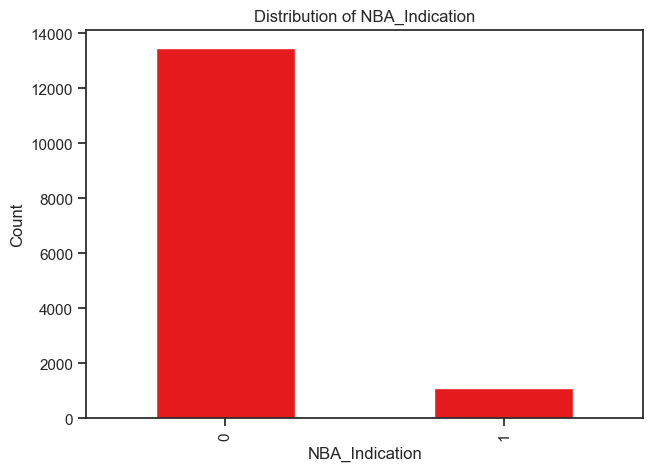

In [331]:
#בודקת איזון כי משהו לא תקין
# בדיקת התפלגות הקטגוריות ב- NBA_Indication
class_distribution = y.value_counts()
print(class_distribution)

# הצגת התפלגות באמצעות גרף
import matplotlib.pyplot as plt

class_distribution.plot(kind='bar')
plt.title('Distribution of NBA_Indication')
plt.xlabel('NBA_Indication')
plt.ylabel('Count')
plt.show()
